# Wind Forcing comparision: monthly mean clim 1980-2009
## Tech preamble

In [1]:
%matplotlib inline
from pathlib import Path
import os
from scipy import stats
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import cmocean as co     # for details on this colormap module see https://matplotlib.org/cmocean/
import numpy as np
import xarray as xr
import dask
from dask.distributed import Client

## Dask-jobqueue and clients

In [2]:
# import dask_jobqueue
# cluster = dask_jobqueue.SLURMCluster(
#     # Dask worker size
#     cores=4, memory='24GB',
#     processes=1, # Dask workers per job
#     # SLURM job script things
#     queue='cluster', walltime='00:45:00',
#     # Dask worker network and temporary storage
#     interface='ib0', local_directory='$TMPDIR',
#     log_directory='./slurm_logs'
# )

In [3]:
# client = Client(cluster)
client = Client(n_workers=1, threads_per_worker=8, memory_limit=24e9)
client

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 46737 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:46737/status,
Dashboard: http://127.0.0.1:46737/status,Workers: 1
Total threads: 8,Total memory: 22.35 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33685,Workers: 1
Dashboard: http://127.0.0.1:46737/status,Total threads: 8
Started: Just now,Total memory: 22.35 GiB
Comm: tcp://127.0.0.1:41009,Total threads: 8
Dashboard: http://127.0.0.1:35319/status,Memory: 22.35 GiB
Nanny: tcp://127.0.0.1:46631,


In [4]:
# cluster.adapt(
#     minimum=1, maximum=20,
# )

## Parameter preamble

In [5]:
in_dir_global = Path('../')
in_dir_data = 'data/INALT20_wind_forcing_comparison'
JRA_exp_id = "INALT20.L46-KFS10X"
CORE_exp_id = "INALT20.L46-KFS044"
nest_prefix = "1_"

JRA_file_y = Path((in_dir_global / f"{in_dir_data}_tauy/{nest_prefix}{JRA_exp_id[:-1]}X_JRA_tauy_mm_clim_10S10N_65W15E_1980_2009.nc"))
JRA_file_x = Path((in_dir_global / f"{in_dir_data}_taux/{nest_prefix}{JRA_exp_id[:-1]}X_JRA_taux_mm_clim_10S10N_65W15E_1980_2009.nc"))
CORE_file_y = Path((in_dir_global / f"{in_dir_data}_tauy/{nest_prefix}{CORE_exp_id}_CORE_tauy_mm_clim_10S10N_65W15E_1980_2009.nc"))
CORE_file_x = Path((in_dir_global / f"{in_dir_data}_taux/{nest_prefix}{CORE_exp_id}_CORE_taux_mm_clim_10S10N_65W15E_1980_2009.nc"))

JRA_CORE_file_A_y = Path((in_dir_global / f"{in_dir_data}_tauy/{nest_prefix}INALT20_JRA_CORE_AM_tauy_mmA_10S10N_65W15E_clim_1980_2009.nc"))
JRA_CORE_file_A_x = Path((in_dir_global / f"{in_dir_data}_taux/{nest_prefix}INALT20_JRA_CORE_AM_taux_mmA_10S10N_65W15E_clim_1980_2009.nc"))

mesh_mask_file = Path('/gxfs_work1/geomar/smomw294/iAtlantic/Subprojects/Wind_forcing/data/INALT20_taux_tauy_10S10N/1_mesh_mask_windstress_10S10N_65W15E.nc')

## load YCM
EUC_data_path = Path("../data/INALT20_EUC_calc_transport/")
NEUC_data_path = Path("../data/INALT20_NEUC_calc_transport/")
SEUC_data_path = Path("../data/INALT20_SEUC_calc_transport/")
NECC_data_path = Path("../data/INALT20_NECC_calc_transport/")
nSECu_data_path = Path("../data/INALT20_nSECu_calc_transport/")
nSECl_data_path = Path("../data/INALT20_nSECl_calc_transport/")

## Load Ekman
Ekman_data_path = Path('../data/INALT20_wind_forcing_Ekman/')

In [6]:
out_dir = "../figures/INALT20_wind_forcing_maps/"
Path(out_dir).mkdir(parents=True, exist_ok=True)
fig_name = "INALT20_wind_forcing_maps_season_1980_2009"
fig_name2 = "INALT20_wind_forcing_maps_mean_1980_2009"
fig_name3 = "INALT20_sverdrup_circ_maps_mean_1980_2009"
fig_format = ".png"
savefig = 1

## Figure settings

In [7]:
font = {'weight' : 'normal',
        'size'   : 14}
plt.rc('font', **font)

## Functions

### load data

In [8]:
def load_model_output(data_path):
    JRA_exp_id = "INALT20.L46-KFS10?"
    CORE_exp_id = "INALT20.L46-KFS044" # INALT COREv2

    temp_res = "_5d_" # 5d:5-daily; 1m:monthly; 1y:yearly; 1d:daily(stored currently on TAPE) 
    nest_prefix = "1_" # "1_" for high resolution; leave empty for base model

    JRA_files = list(sorted(
        (data_path).glob(
            f"{nest_prefix}{JRA_exp_id}{temp_res}*transport.nc")
    ))

    CORE_files = list(sorted(
        (data_path ).glob(
            f"{nest_prefix}{CORE_exp_id}{temp_res}*transport.nc"
        )
    ))

    print(f"Found {len(CORE_files)} CORE files and {len(JRA_files)} JRA files.")
    
    ds_JRA = xr.open_mfdataset(
        JRA_files,
        combine='by_coords',
        decode_cf=True
    )
    
    ds_CORE = xr.open_mfdataset(
        CORE_files,
        combine='by_coords',
        decode_cf=True
    )
    ds_CORE.coords['time_counter']=ds_JRA.sel(time_counter=slice('1958','2009')).time_counter
    
    return ds_JRA, ds_CORE

In [9]:
def load_lin_adv():
    in_path = Path('../data/INALT20_lin_adv_term/')
    JRA_exp_id = "INALT20.L46-KFS10?"
    CORE_exp_id = "INALT20.L46-KFS044"
    nest_prefix = "1_"
    temp_res='_5d_'

    mesh_fn = '1_mesh_mask_10S10N_65W15E_u500m.nc'
    
    fn_CORE=list(sorted(
            (in_path).glob(
                f"{nest_prefix}{CORE_exp_id}{temp_res}*lin_adv_term.nc")
        ))
    
    fn_JRA=list(sorted(
            (in_path).glob(
                f"{nest_prefix}{JRA_exp_id}{temp_res}*lin_adv_term.nc")
        ))
    

    mesh = xr.open_dataset((in_path/mesh_fn))
    
    ds_JRA = xr.open_mfdataset(fn_JRA,
                decode_cf=True)
    ds_CORE = xr.open_mfdataset(fn_CORE,
                decode_cf=True)
    ds_CORE['time_counter']=ds_JRA.time_counter
    
    with xr.set_options(keep_attrs=True):
            ds = xr.concat([ds_JRA,ds_CORE],
                            'forcings')
    
    ds.coords['forcings'] = (['forcings'],['JRA','CORE'],)
    ds.coords['e2v'] = mesh.e2v.squeeze().rename({'x':'lon','y':'lat'})
    return ds

### figures

In [10]:
def plot_taux(ds_tau,forcing,data_crs,axes):
    c_vmin,c_vmax,levs=-.03,.03,11
        
    if forcing=='DIFF':
        im = ds_tau.taux.diff('forcings').squeeze().plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)
    else:
        im = ds_tau.taux.sel(forcings=forcing).plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)

    axes.axes.axis('tight')
    axes.set_title('')
    axes.coastlines()
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,)
    gl.top_labels = gl.right_labels = False
    return im

def plot_results(ds_curl,ds_tau,forcing,data_crs,axes):
    c_vmin,c_vmax,levs=-1e-7,1e-7,11
    dum_AM = ds_tau.sel(lat=np.arange(-10,11,1),lon=np.arange(-65,15,2),method='nearest')
    
    if forcing=='DIFF':
        im = ds_curl.diff('forcings').squeeze().plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)
        dum = dum_AM.diff('forcings').squeeze()
        Q = axes.quiver(dum.lon,dum.lat,2*dum.taux,2*dum.tauy,
            transform=data_crs, scale=.025, scale_units='xy', angles='xy')
        
        axes.quiverkey(Q, .1 ,.1 , 0.05, r'$0.05\,N\,m^{-2}$', labelpos='E',
                   coordinates='axes')
    else:
        im = ds_curl.sel(forcings=forcing).plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)
        dum = dum_AM.sel(forcings=forcing)
        Q=axes.quiver(dum.lon,dum.lat,dum.taux,dum.tauy,
            transform=data_crs, scale=.05, scale_units='xy', angles='xy')        
        axes.quiverkey(Q, .1 ,.1 , 0.1, r'$0.1\,N\,m^{-2}$', labelpos='E',
                   coordinates='axes')

    axes.axes.axis('tight')
    axes.set_title('')
    axes.coastlines()
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,)
    gl.top_labels = gl.right_labels = False
    return im

In [11]:
def plot_sv_contour(ds_tau,forcing,data_crs,axes):
    c_vmin,c_vmax,levs=-10, 10,11
    levs_diff=[-1.5,-.5,0,.5,1.5]
    line_colour = ['b','b','b','b','b','dimgrey','r','r','r','r','r']
    line_diff = ['b','b','dimgrey','r','r']
        
    if forcing=='DIFF':
        im = ds_tau.squeeze().plot.contour(
            ax=axes, levels=levs_diff,
            colors=line_diff,linewidths=1,
            transform=data_crs)
    else:
        im = ds_tau.sel(forcings=forcing).plot.contour(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            colors=line_colour,linewidths=1,zorder=1,
            transform=data_crs)

## Load model output

In [12]:
# chunk sizes
chu_x = 100 # None means take the full dataset
chu_y = 100
chu_z = 1
chu_t = None
ds_mesh1 = xr.open_dataset(
            '/sfs/fs1/work-geomar1/smomw044/INALT20.L46-KFS10X/1_mesh_mask.nc',
            decode_cf=True,
            chunks={"t":chu_t,"z":chu_z, 
                  "y":chu_y,"x":chu_x})

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/dataset.py:278: UserWarning: The specified chunks separate the stored chunks along dimension "y" starting at index 100. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/dataset.py:278: UserWarning: The specified chunks separate the stored chunks along dimension "x" starting at index 100. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/dataset.py:278: UserWarning: The specified chunks separate the stored chunks along dimension "z" starting at index 1. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(


In [13]:
ds_mesh1.gdept_1d.squeeze()[:10].values

array([ 3.04677264,  9.45404872, 16.36396575, 23.89871054, 32.20929121,
       41.48185515, 51.94513088, 63.8790495 , 77.62451264, 93.59412573])

In [14]:
EUC_JRA, EUC_CORE = load_model_output(EUC_data_path)
NEUC_JRA, NEUC_CORE = load_model_output(NEUC_data_path)
SEUC_JRA, SEUC_CORE = load_model_output(SEUC_data_path)
NECC_JRA, NECC_CORE = load_model_output(NECC_data_path)
nSECu_JRA, nSECu_CORE = load_model_output(nSECu_data_path)
nSECl_JRA, nSECl_CORE = load_model_output(nSECl_data_path)

Found 52 CORE files and 61 JRA files.
Found 52 CORE files and 61 JRA files.
Found 52 CORE files and 61 JRA files.
Found 52 CORE files and 61 JRA files.
Found 52 CORE files and 61 JRA files.
Found 52 CORE files and 61 JRA files.


In [15]:
tlim1_C,tlim2_C = '1980','2009'
tlim1_J,tlim2_J = '1980','2009'
EUC_JRA_8009 = EUC_JRA.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()
NEUC_JRA_8009 = NEUC_JRA.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()
SEUC_JRA_8009 = SEUC_JRA.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()
NECC_JRA_8009 = NECC_JRA.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()
nSECu_JRA_8009 = nSECu_JRA.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()

EUC_CORE_8009 = EUC_CORE.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()
NEUC_CORE_8009 = NEUC_CORE.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()
SEUC_CORE_8009 = SEUC_CORE.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()
NECC_CORE_8009 = NECC_CORE.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()
nSECu_CORE_8009 = nSECu_CORE.Y_CM.sel(time_counter=slice(tlim1_C,tlim2_C)).mean(dim=['time_counter']).compute()

In [16]:
ds_lin_adv = load_lin_adv()
ds_lin_adv_mean = ds_lin_adv.sel(time_counter=slice(tlim1_C,tlim2_C)).mean('time_counter').compute()

In [17]:
w_ek_clim = xr.open_dataset((Ekman_data_path/'1_INALT20_w_ek_mm_clim_1980_2009.nc'))
w_ek_clim_2deg = xr.open_dataset((Ekman_data_path/'2deg_INALT20_w_ek_mm_clim_1980_2009.nc'))

In [18]:
ds_JRA_y = xr.open_dataset(JRA_file_y)
ds_JRA_y = ds_JRA_y.where(ds_JRA_y.vmask==1)
ds_JRA_x = xr.open_dataset(JRA_file_x)
ds_JRA_x = ds_JRA_x.where(ds_JRA_x.umask==1)
ds_CORE_y = xr.open_dataset(CORE_file_y)
ds_CORE_y = ds_CORE_y.where(ds_CORE_y.vmask==1)
ds_CORE_x = xr.open_dataset(CORE_file_x)
ds_CORE_x = ds_CORE_x.where(ds_CORE_x.umask==1)
ds_mesh = xr.open_dataset(mesh_mask_file)

with xr.set_options(keep_attrs=True):
    ds_tauy = xr.concat([ds_JRA_y,ds_CORE_y],
                        'forcings')
    ds_taux = xr.concat([ds_JRA_x,ds_CORE_x],
                        'forcings')
    
ds_taux.coords['forcings'] = (['forcings'],['JRA','CORE'],)
ds_taux['e2u'] = ds_mesh.e2u.where(ds_mesh.umaskutil==1,drop=True).squeeze().rename({'x':'lon','y':'lat'})
ds_taux['e1u'] = ds_mesh.e1u.where(ds_mesh.umaskutil==1,drop=True).squeeze().rename({'x':'lon','y':'lat'})
ds_tauy.coords['forcings'] = (['forcings'],['JRA','CORE'],)
ds_tauy['e1v'] = ds_mesh.e1v.where(ds_mesh.vmaskutil==1,drop=True).squeeze().rename({'x':'lon','y':'lat'})
ds_tauy = ds_tauy.sel(lat=slice(-10,10))
display(ds_tauy)
display(ds_taux)

<xarray.Dataset>
Dimensions:   (forcings: 2, month: 12, lat: 402, lon: 1516)
Coordinates:
  * lat       (lat) float32 -9.974 -9.925 -9.876 -9.826 ... 9.876 9.925 9.974
  * lon       (lon) float32 -62.35 -62.3 -62.25 -62.2 ... 13.25 13.3 13.35 13.4
    vmask     (lat, lon) int8 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
  * month     (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * forcings  (forcings) <U4 'JRA' 'CORE'
Data variables:
    tauy      (forcings, month, lat, lon) float64 nan nan nan ... nan nan nan
    e1v       (lat, lon) float64 nan nan nan nan nan nan ... nan nan nan nan nan
Attributes:
    title:          JRA tauy clim 1980-2009
    expirement_id:  INALT20.L46-KFS10?
    long_name:      Merid. Wind Stress
    units:          N/m2
    history:        Monthly mean clim 1980-2009 calculated from ../data/INALT...

<xarray.Dataset>
Dimensions:   (forcings: 2, month: 12, lat: 403, lon: 1515)
Coordinates:
  * lat       (lat) float32 -9.999 -9.95 -9.9 -9.851 ... 9.851 9.9 9.95 9.999
  * lon       (lon) float32 -62.33 -62.28 -62.22 -62.17 ... 13.27 13.32 13.38
    umask     (lat, lon) int8 0 0 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0 0
  * month     (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
  * forcings  (forcings) <U4 'JRA' 'CORE'
Data variables:
    taux      (forcings, month, lat, lon) float64 nan nan nan ... nan nan nan
    e2u       (lat, lon) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    e1u       (lat, lon) float64 nan nan nan nan nan nan ... nan nan nan nan nan

In [19]:
ds_AM_y = xr.open_dataset(JRA_CORE_file_A_y)
ds_AM_x = xr.open_dataset(JRA_CORE_file_A_x)

with xr.set_options(keep_attrs=True):
    ds_AM_y = xr.concat([ds_AM_y.JRA_tauy,ds_AM_y.CORE_tauy],
                        'forcings')
    ds_AM_x = xr.concat([ds_AM_x.JRA_taux,ds_AM_x.CORE_taux],
                        'forcings')
    
ds_AM_x.coords['forcings'] = (['forcings'],['JRA','CORE'],)
ds_AM_x['e2u'] = ds_mesh.e2u.where(ds_mesh.umaskutil==1,drop=True).squeeze().rename({'x':'lon','y':'lat'})
ds_AM_x['e1u'] = ds_mesh.e1u.where(ds_mesh.umaskutil==1,drop=True).squeeze().rename({'x':'lon','y':'lat'})
ds_AM_x.name = 'taux'
ds_AM_y.coords['forcings'] = (['forcings'],['JRA','CORE'],)
ds_AM_y['e1v'] = ds_mesh.e1v.where(ds_mesh.vmaskutil==1,drop=True).squeeze().rename({'x':'lon','y':'lat'})
ds_AM_y = ds_AM_y.sel(lat=slice(-10,10))
ds_AM_y.name = 'tauy'

# Weighted avarages 1980-2009

In [20]:
time = pd.date_range("2001-01-15",periods=12,freq='1M')
ds_tauy = ds_tauy.assign_coords(time=('month',time))
ds_taux = ds_taux.assign_coords(time=('month',time))

In [21]:
month_length = ds_taux.swap_dims({'month':'time'}).time.dt.days_in_month

## Total

In [22]:
weights = month_length / month_length.sum()
np.testing.assert_allclose(weights.sum().values, np.ones(1))
ds_taux_annual_w = (ds_taux.swap_dims({'month':'time'}) * weights).sum(dim='time',skipna=False)
ds_tauy_annual_w = (ds_tauy.swap_dims({'month':'time'}) * weights).sum(dim='time',skipna=False)
ds_annual_uw = ds_taux.mean('month')
ds_diff = ds_taux_annual_w - ds_annual_uw

## Mean zonal windstress along equator (35°W-10°W, 1°S-1°N)

In [23]:
ZWS_mean = ds_taux_annual_w.taux.sel(lat=slice(-2.5,2.5),lon=slice(-35,-10)).mean(['lat','lon'])

In [24]:
ZWS_std = ds_taux_annual_w.taux.sel(lat=slice(-2.5,2.5),lon=slice(-35,-10)).std(['lat','lon'])

In [25]:
print('JRA')
print(ZWS_mean.sel(forcings='JRA').values)
print(ZWS_std.sel(forcings='JRA').values)
print('CORE')
print(ZWS_mean.sel(forcings='CORE').values)
print(ZWS_std.sel(forcings='CORE').values)

JRA
-0.027506418131565083
0.011459719548087261
CORE
-0.0345695941279003
0.01218000289735333


## Seasonal

In [26]:
weights = month_length.groupby('time.season') / month_length.groupby('time.season').sum()
np.testing.assert_allclose(weights.groupby('time.season').sum().values, np.ones(4))
ds_taux_season_w = (ds_taux.swap_dims({'month':'time'}) * weights).groupby('time.season').sum(dim='time',skipna=False)
ds_tauy_season_w = (ds_tauy.swap_dims({'month':'time'}) * weights).groupby('time.season').sum(dim='time',skipna=False)
ds_season_uw = ds_taux.swap_dims({'month':'time'}).groupby('time.season').mean(dim='time',skipna=False)
ds_diff = ds_taux_season_w - ds_season_uw

In [27]:
ds_lin_adv_clim = ds_lin_adv.sel(time_counter=slice(tlim1_C,tlim2_C)).groupby('time_counter.month').mean('time_counter').compute()
ds_lin_adv_clim = ds_lin_adv_clim.assign_coords(time=('month',time))
ds_lin_adv_SM = (ds_lin_adv_clim.swap_dims({'month':'time'}) * weights).groupby('time.season').sum(dim='time',skipna=False)

# Calculate wind stress curl

In [28]:
dtaux_dy = ds_taux_annual_w.diff('lat')/ds_taux_annual_w.e2u.isel(lat=slice(1,ds_taux_annual_w.diff('lat').lat.size+1));
dtauy_dx = ds_tauy_annual_w.diff('lon')/ds_tauy_annual_w.e1v.isel(lon=slice(1,ds_tauy_annual_w.diff('lon').lon.size+1));
dtaux_dy.coords['lat'] = dtauy_dx.lat
dtauy_dx.coords['lon'] = dtaux_dy.lon

tau_curl_AM= dtauy_dx.tauy.drop(['vmask']) - dtaux_dy.taux.drop(['umask'])

In [29]:
dtaux_dy = ds_taux.diff('lat')/ds_taux.e2u.isel(lat=slice(1,ds_taux_annual_w.diff('lat').lat.size+1));
dtauy_dx = ds_tauy.diff('lon')/ds_tauy.e1v.isel(lon=slice(1,ds_tauy_annual_w.diff('lon').lon.size+1));
dtaux_dy.coords['lat'] = dtauy_dx.lat
dtauy_dx.coords['lon'] = dtaux_dy.lon

tau_curl_clim= dtauy_dx.tauy.drop(['vmask']) - dtaux_dy.taux.drop(['umask'])

In [30]:
dtaux_dy = ds_taux_season_w.diff('lat')/ds_taux_season_w.e2u.isel(lat=slice(1,ds_taux_season_w.diff('lat').lat.size+1));
dtauy_dx = ds_tauy_season_w.diff('lon')/ds_tauy_season_w.e1v.isel(lon=slice(1,ds_tauy_season_w.diff('lon').lon.size+1));
dtaux_dy.coords['lat'] = dtauy_dx.lat
dtauy_dx.coords['lon'] = dtaux_dy.lon

tau_curl_SM= dtauy_dx.tauy.drop(['vmask']) - dtaux_dy.taux.drop(['umask'])

In [31]:
dtaux_dy = ds_AM_x.diff('lat')/ds_AM_x.e2u.isel(lat=slice(1,ds_AM_x.diff('lat').lat.size+1));
dtauy_dx = ds_AM_y.diff('lon')/ds_AM_y.e1v.isel(lon=slice(1,ds_AM_y.diff('lon').lon.size+1));
dtaux_dy.coords['lat'] = dtauy_dx.lat
dtauy_dx.coords['lon'] = dtaux_dy.lon

ds_AM_curl= dtauy_dx.drop(['vmask']) - dtaux_dy.drop(['umask'])

## Sverdrup transport

The Sverdrup balance relates the transport in the ocean interior below the Ekman layer to the curl of the wind stress. It can be derived from the momentum balance of the wind stress, the Coriolis force and the pressure gradient (Sverdrup1947). We calculate the Sverdrup streamfunction as follows: 
\begin{equation}
\Psi = - \frac{1}{\rho_0\beta}\left(\int_{x}^{x_0} \left(\hat{\text{k}}\, \nabla \times \tau\right) \ dx
\right), \qquad
\beta = \frac{\partial\, f}{\partial y} = \frac{2\Omega \cos(\phi)}{R_{Earth}}
\end{equation}

where $\rho_0=1025$kg m$^{-3}$ is mean water density, $x_0$ is west coast of Africa, $x$ is longitude, $(\hat{\text{k}}\, \nabla \times \tau)$ is wind stress curl, $\Omega$=7.271$\cdot 10^{-5}$ rad s$^{-1}$ is the rotation of the Earth, $\phi$ is latitude, $R_{Earth}$=6.37$\cdot 10^6$m is the radius of the Earth.

In [32]:
def calc_sv(tau_curl,e2u):
    rho=1025;
    Omega,R_earth = 7.271e-5,6.37e6
    beta=(2*Omega*np.cos(tau_curl.lat*(np.pi/180)))/R_earth
    T_sv_A=-(tau_curl/(rho*beta))*e2u
    return (T_sv_A.isel(lon=slice(None, None, -1)).cumsum('lon')).isel(lon=slice(None, None, -1)).where(tau_curl.notnull())*1e-6

In [33]:
T_sv_A = calc_sv(ds_AM_curl,ds_AM_curl.e2u)
T_sv = calc_sv(tau_curl_AM,ds_AM_curl.e2u)
T_sv_SM = calc_sv(tau_curl_SM,ds_AM_curl.e2u)

In [34]:
T_sv_diff = calc_sv(tau_curl_AM.diff('forcings').squeeze(),ds_AM_curl.e2u)
T_sv_diff.coords['forcings']='CORE minus JRA'

In [35]:
V_int = calc_sv(ds_lin_adv.Linear_advection_500m,ds_lin_adv.e2v)
V_int_mean = V_int.sel(time_counter=slice(tlim1_C,tlim2_C)).mean('time_counter').compute()

V_int_SM = ds_lin_adv_SM.Linear_advection_500m.compute()

In [36]:
ds_lin_adv_clim = ds_lin_adv.Linear_advection_500m.sel(time_counter=slice(tlim1_C,tlim2_C)).groupby('time_counter.dayofyear').mean('time_counter').compute()
ds_lin_adv_A = (ds_lin_adv.Linear_advection_500m.groupby('time_counter.dayofyear')-ds_lin_adv_clim)

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 52 times more chunks
  return self.array[key]
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 10.46 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


In [37]:
V_int_clim = V_int.sel(time_counter=slice(tlim1_C,tlim2_C)).groupby('time_counter.dayofyear').mean('time_counter').compute()
V_int_A = (V_int.groupby('time_counter.dayofyear')-V_int_clim)

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 52 times more chunks
  return self.array[key]


# Ekman transport (from Tuchen et al., 2019)
Assumption: poleward surface transport associated with thte upper branch of the STCs is driven by Ekamn transport:

\begin{equation}
T_E(x,y,t) = - \frac{1}{\rho_0}\frac{\tau_x(x,y,t)}{f(y)}\Delta x
\end{equation}

where $\tau_x$ represents the zonal wind stress for a given horizontal cell ($\Delta x$)

In [38]:
def calc_Ekman(taux):
    omega = 7.271e-5
    f = 2 * omega * np.sin(np.deg2rad(taux.lat))
    rho = 1025
    T_E=-((taux.taux/(rho*f).where(abs(taux.lat)>2.5))*taux.e1u)
    return T_E*1e-6

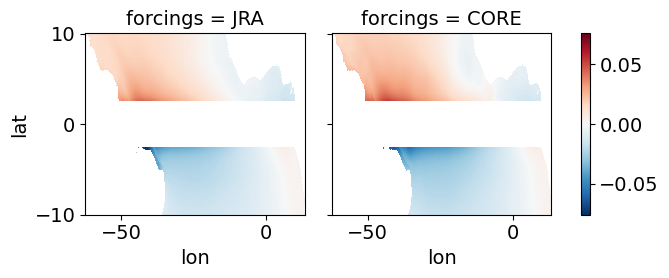

In [39]:
T_E_AM = calc_Ekman(ds_taux_annual_w)
T_E_AM.plot(x='lon',col='forcings')

In [40]:
T_E_SM = calc_Ekman(ds_taux_season_w)

In [41]:
T_E_AM.sel(lat=[-10,10],method='nearest').sum('lon')

<xarray.DataArray (forcings: 2, lat: 2)>
array([[ -9.38836798,   9.28502663],
       [-11.00519852,  11.40181752]])
Coordinates:
  * lat       (lat) float32 -9.999 9.999
  * forcings  (forcings) <U4 'JRA' 'CORE'

In [42]:
T_E_AM.sel(lat=[-10,10],method='nearest').sum('lon').diff('lat')

<xarray.DataArray (forcings: 2, lat: 1)>
array([[18.67339461],
       [22.40701604]])
Coordinates:
  * lat       (lat) float32 9.999
  * forcings  (forcings) <U4 'JRA' 'CORE'

In [43]:
T_E_AM.sel(lat=[-3,3],method='nearest').sum('lon').diff('lat')

<xarray.DataArray (forcings: 2, lat: 1)>
array([[33.87179833],
       [44.46285198]])
Coordinates:
  * lat       (lat) float32 2.999
  * forcings  (forcings) <U4 'JRA' 'CORE'

## Interpolate taux and tauy on one grid

In [44]:
with xr.set_options(keep_attrs=True):
    ds_AM = xr.merge([ds_tauy_annual_w.interp(lon=ds_taux_annual_w.lon),
                      ds_taux_annual_w.interp(lat=ds_tauy_annual_w.lat)])
    
    ds_SM = xr.merge([ds_tauy_season_w.interp(lon=ds_taux_season_w.lon),
                      ds_taux_season_w.interp(lat=ds_tauy_season_w.lat)])
    
    ds_AM_A = xr.merge([ds_AM_y.interp(lon=ds_AM_x.lon),
                      ds_AM_x.interp(lat=ds_AM_y.lat)])


# Plot results

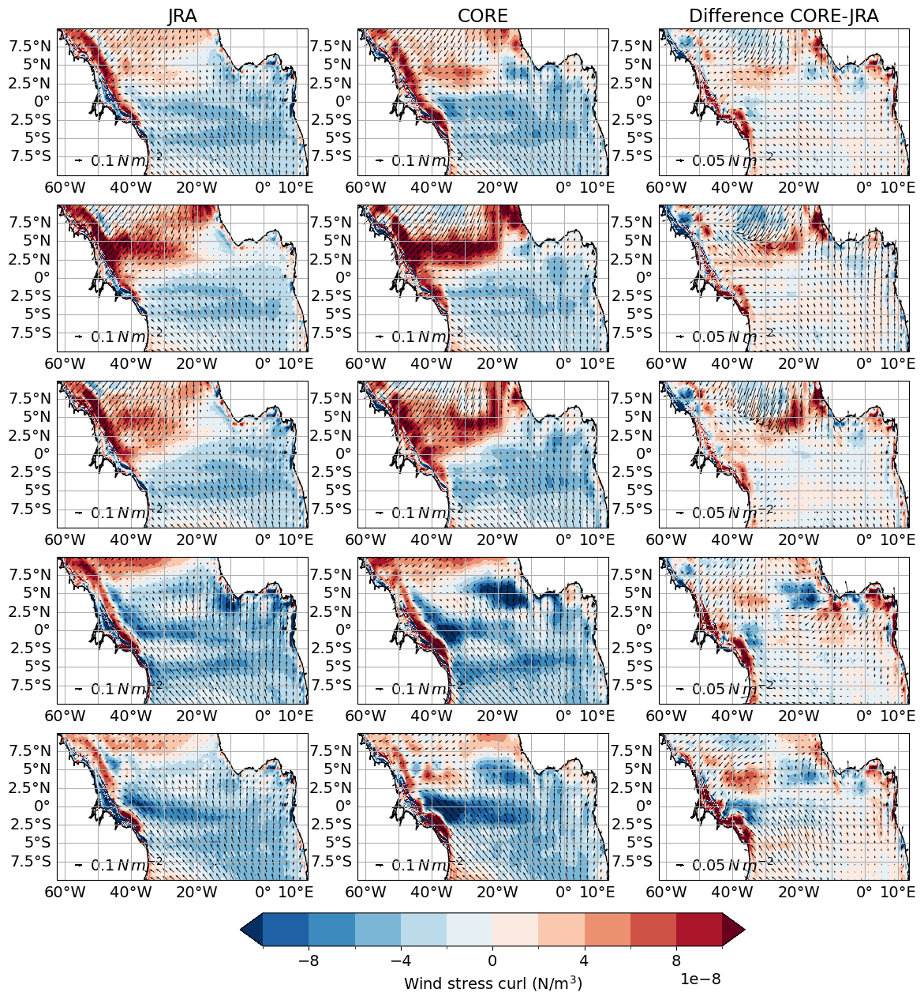

In [45]:
# Quick plot to show the results
data_crs = ccrs.PlateCarree()

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(16,14),subplot_kw={'projection': ccrs.PlateCarree()})

im = plot_results(tau_curl_AM,ds_AM,'JRA',data_crs,axes[0,0])
im = plot_results(tau_curl_AM,ds_AM,'CORE',data_crs,axes[0,1])
im = plot_results(tau_curl_AM,ds_AM,'DIFF',data_crs,axes[0,2])

axes[0, 0].set_ylabel('Mean 1980-2009')
axes[0, 1].set_ylabel('')
axes[0, 2].set_ylabel('')

axes[0, 0].set_title('JRA')
axes[0, 1].set_title('CORE')
axes[0, 2].set_title('Difference CORE-JRA')

for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    
    im = plot_results(tau_curl_SM.sel(season=season),ds_SM.sel(season=season),'JRA',data_crs,axes[i+1,0])
    im = plot_results(tau_curl_SM.sel(season=season),ds_SM.sel(season=season),'CORE',data_crs,axes[i+1,1])
    im = plot_results(tau_curl_SM.sel(season=season),ds_SM.sel(season=season),'DIFF',data_crs,axes[i+1,2])

    axes[i+1, 0].set_ylabel(season)
    axes[i+1, 1].set_ylabel('')
    axes[i+1, 2].set_ylabel('')    

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.27, 0.05, 0.4, 0.03])
cb =fig.colorbar(im, cax=cbar_ax, extend='both',orientation='horizontal')
cb.set_label('Wind stress curl (N/m$^3$)')
# plt.tight_layout()
if savefig:
    plt.savefig(out_dir+fig_name+fig_format,dpi=300)

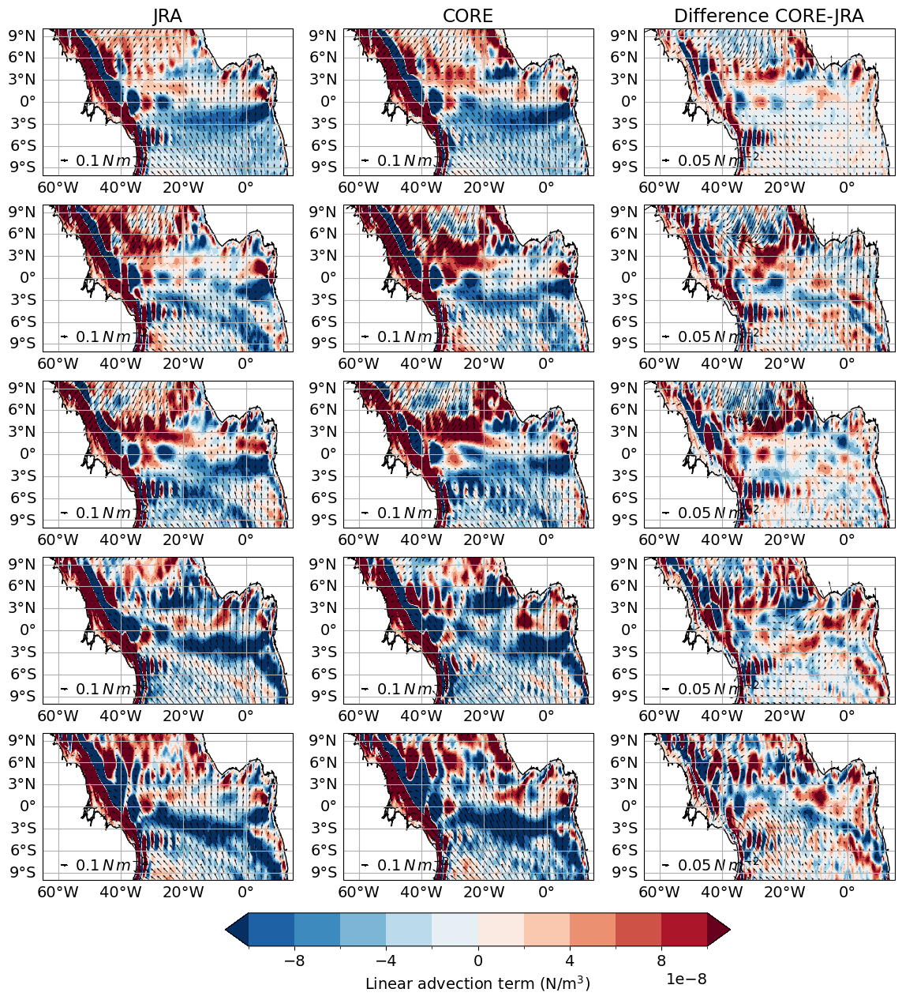

In [46]:
# Quick plot to show the results
data_crs = ccrs.PlateCarree()
dummy = (ds_lin_adv_mean.Linear_advection_500m)

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(16,14),subplot_kw={'projection': ccrs.PlateCarree()})

im = plot_results(dummy,ds_AM,'JRA',data_crs,axes[0,0])
im = plot_results(dummy,ds_AM,'CORE',data_crs,axes[0,1])
im = plot_results(dummy,ds_AM,'DIFF',data_crs,axes[0,2])

axes[0, 0].set_ylabel('Mean 1980-2009')
axes[0, 1].set_ylabel('')
axes[0, 2].set_ylabel('')

axes[0, 0].set_title('JRA')
axes[0, 1].set_title('CORE')
axes[0, 2].set_title('Difference CORE-JRA')
dummy = (ds_lin_adv_SM.Linear_advection_500m)
for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    
    im = plot_results(dummy.sel(season=season),ds_SM.sel(season=season),'JRA',data_crs,axes[i+1,0])
    im = plot_results(dummy.sel(season=season),ds_SM.sel(season=season),'CORE',data_crs,axes[i+1,1])
    im = plot_results(dummy.sel(season=season),ds_SM.sel(season=season),'DIFF',data_crs,axes[i+1,2])

    axes[i+1, 0].set_ylabel(season)
    axes[i+1, 1].set_ylabel('')
    axes[i+1, 2].set_ylabel('')    

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.27, 0.05, 0.4, 0.03])
cb =fig.colorbar(im, cax=cbar_ax, extend='both',orientation='horizontal')
cb.set_label('Linear advection term (N/m$^3$)')
# plt.tight_layout()
if savefig:
    plt.savefig(out_dir+fig_name+fig_format,dpi=300)

In [47]:
lat_box=[3,6]
lon_box=[-25,-15]
dummy = (ds_lin_adv_mean.Linear_advection_500m
        ).sel(lat=slice(*lat_box),lon=slice(*lon_box)).mean(['lat','lon'])
print(f'Lin adv term box: {dummy.forcings.isel(forcings=0).values} {dummy.isel(forcings=0).round(decimals=9).values}')
print(f'Lin adv term box: {dummy.forcings.isel(forcings=1).values} {dummy.isel(forcings=1).round(decimals=9).values}')

dummy = (tau_curl_AM
        ).sel(lat=slice(*lat_box),lon=slice(*lon_box)).mean(['lat','lon'])
print(f'Curl term box: {dummy.forcings.isel(forcings=0).values} {dummy.isel(forcings=0).round(decimals=9).values}')
print(f'Curl term box: {dummy.forcings.isel(forcings=1).values} {dummy.isel(forcings=1).round(decimals=9).values}')

dummy = ((ds_lin_adv_mean.Linear_advection_500m).interp_like(tau_curl_AM) - tau_curl_AM).sel(
    lat=slice(*lat_box),lon=slice(*lon_box)).mean(['lat','lon'])
print(f'DIFF term box: {dummy.forcings.isel(forcings=0).values} {dummy.isel(forcings=0).round(decimals=9).values}')
print(f'DIFF term box: {dummy.forcings.isel(forcings=1).values} {dummy.isel(forcings=1).round(decimals=9).values}')

Lin adv term box: JRA -2.2e-08
Lin adv term box: CORE -1.5e-08
Curl term box: JRA -8e-09
Curl term box: CORE -1.1e-08
DIFF term box: JRA -1.4e-08
DIFF term box: CORE -3e-09


In [48]:
for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    print(season)
    dummy = (ds_lin_adv_SM.Linear_advection_500m
        ).sel(lat=slice(*lat_box),lon=slice(*lon_box),season=season).mean(['lat','lon'])
    print(f'Lin adv term box: {dummy.forcings.isel(forcings=0).values} {dummy.isel(forcings=0).round(decimals=9).values}')
    print(f'Lin adv term box: {dummy.forcings.isel(forcings=1).values} {dummy.isel(forcings=1).round(decimals=9).values}')
    
    dummy = (tau_curl_SM
            ).sel(lat=slice(*lat_box),lon=slice(*lon_box),season=season).mean(['lat','lon'])
    print(f'Curl term box: {dummy.forcings.isel(forcings=0).values} {dummy.isel(forcings=0).round(decimals=9).values}')
    print(f'Curl term box: {dummy.forcings.isel(forcings=1).values} {dummy.isel(forcings=1).round(decimals=9).values}')
    
    dummy = ((ds_lin_adv_SM.Linear_advection_500m).interp_like(tau_curl_SM) - tau_curl_SM).sel(
        lat=slice(*lat_box),lon=slice(*lon_box),season=season).mean(['lat','lon'])
    print(f'DIFF term box: {dummy.forcings.isel(forcings=0).values} {dummy.isel(forcings=0).round(decimals=9).values}')
    print(f'DIFF term box: {dummy.forcings.isel(forcings=1).values} {dummy.isel(forcings=1).round(decimals=9).values}')


DJF
Lin adv term box: JRA -8e-09
Lin adv term box: CORE 3.7e-08
Curl term box: JRA 1.4e-08
Curl term box: CORE 5.1e-08
DIFF term box: JRA -2.2e-08
DIFF term box: CORE -1.4e-08
MAM
Lin adv term box: JRA 2e-09
Lin adv term box: CORE 5.7e-08
Curl term box: JRA 5e-09
Curl term box: CORE 5.7e-08
DIFF term box: JRA -3e-09
DIFF term box: CORE -0.0
JJA
Lin adv term box: JRA -9.2e-08
Lin adv term box: CORE -1.27e-07
Curl term box: JRA -3e-08
Curl term box: CORE -9.1e-08
DIFF term box: JRA -6.3e-08
DIFF term box: CORE -3.6e-08
SON
Lin adv term box: JRA 1.5e-08
Lin adv term box: CORE -1.9e-08
Curl term box: JRA -2e-08
Curl term box: CORE -6.1e-08
DIFF term box: JRA 3.5e-08
DIFF term box: CORE 4.2e-08


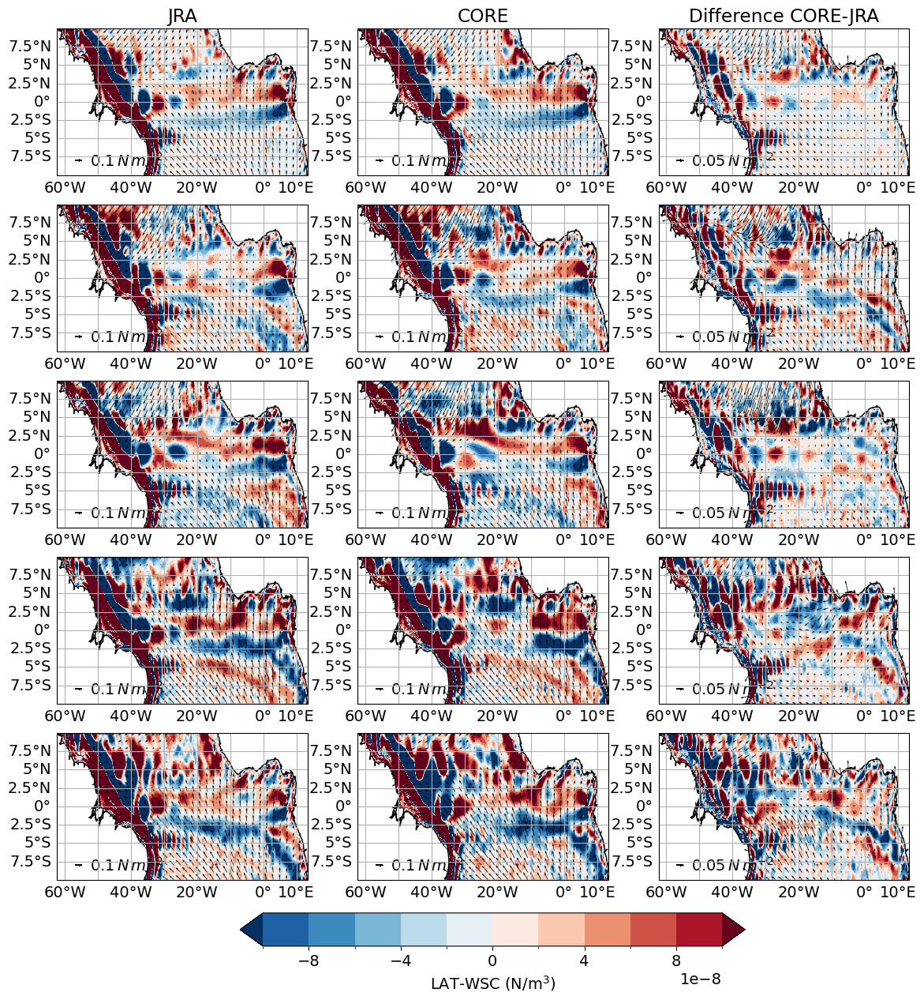

In [49]:
# Quick plot to show the results
data_crs = ccrs.PlateCarree()
dummy = (ds_lin_adv_mean.Linear_advection_500m).interp_like(tau_curl_AM) - tau_curl_AM

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(16,14),subplot_kw={'projection': ccrs.PlateCarree()})

im = plot_results(dummy,ds_AM,'JRA',data_crs,axes[0,0])
im = plot_results(dummy,ds_AM,'CORE',data_crs,axes[0,1])
im = plot_results(dummy,ds_AM,'DIFF',data_crs,axes[0,2])

axes[0, 0].set_ylabel('Mean 1980-2009')
axes[0, 1].set_ylabel('')
axes[0, 2].set_ylabel('')

axes[0, 0].set_title('JRA')
axes[0, 1].set_title('CORE')
axes[0, 2].set_title('Difference CORE-JRA')
dummy = (ds_lin_adv_SM.Linear_advection_500m).interp_like(tau_curl_SM) - tau_curl_SM
for i, season in enumerate(('DJF', 'MAM', 'JJA', 'SON')):
    
    im = plot_results(dummy.sel(season=season),ds_SM.sel(season=season),'JRA',data_crs,axes[i+1,0])
    im = plot_results(dummy.sel(season=season),ds_SM.sel(season=season),'CORE',data_crs,axes[i+1,1])
    im = plot_results(dummy.sel(season=season),ds_SM.sel(season=season),'DIFF',data_crs,axes[i+1,2])

    axes[i+1, 0].set_ylabel(season)
    axes[i+1, 1].set_ylabel('')
    axes[i+1, 2].set_ylabel('')    

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.27, 0.05, 0.4, 0.03])
cb =fig.colorbar(im, cax=cbar_ax, extend='both',orientation='horizontal')
cb.set_label('LAT-WSC (N/m$^3$)')
# plt.tight_layout()
if savefig:
    plt.savefig(out_dir+fig_name+fig_format,dpi=300)

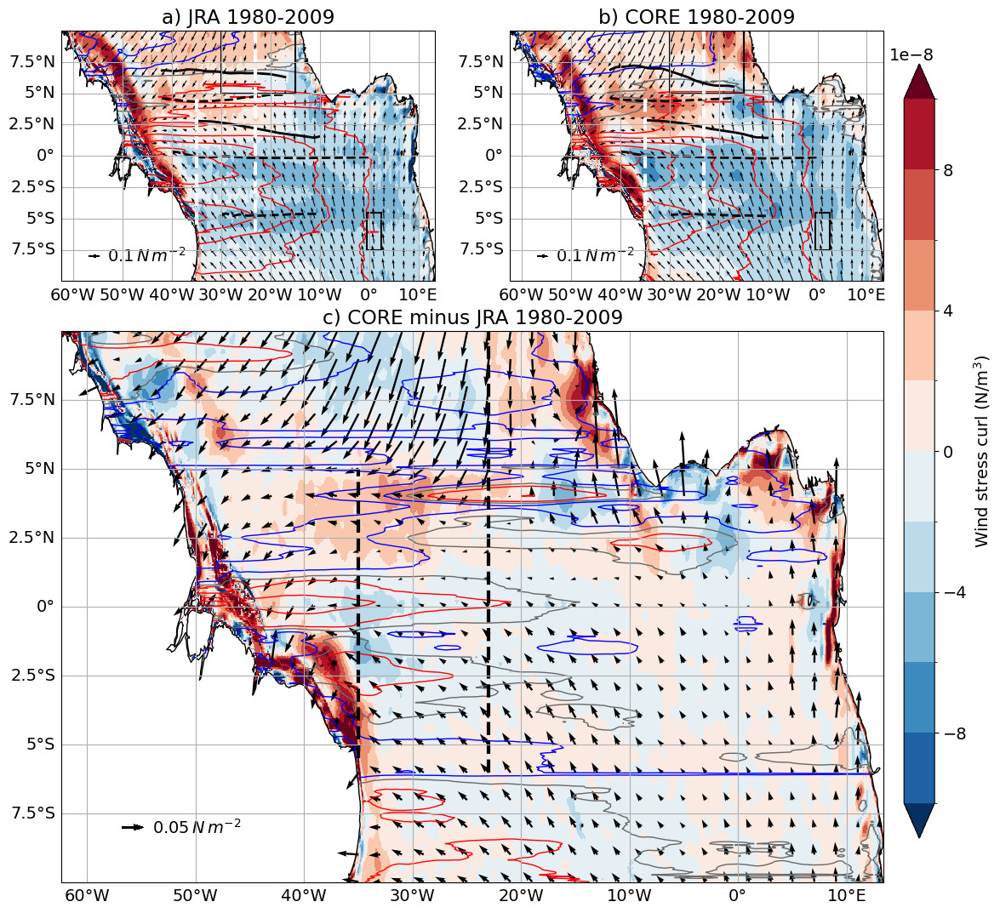

In [50]:
tlim1_C,tlim2_C = '1980','2009'
tlim1_J,tlim2_J = '1980','2009'
# Quick plot to show the results
lw=2
linest='dashed'

data_crs = ccrs.PlateCarree()

# fig, axes = plt.figure(figsize=(12,13)).subplot_mosaic([['a)', 'b)'], ['c)', 'c)'], ['c)', 'c)']],subplot_kw={'projection': ccrs.PlateCarree()})
fig= plt.figure(figsize=(12,13))
axes = fig.subplot_mosaic([['a)', 'b)'], ['c)', 'c)'], ['c)', 'c)']],
                           subplot_kw={'projection': ccrs.PlateCarree()})

im = plot_results(tau_curl_AM,ds_AM,'JRA',data_crs,axes['a)'])
EUC_JRA_8009.plot.line('k',ax=axes['a)'],linestyle=linest,transform=data_crs,linewidth=lw)
NEUC_JRA_8009.plot.line('k',ax=axes['a)'],linestyle=linest,transform=data_crs,linewidth=lw)
SEUC_JRA_8009.plot.line('k',ax=axes['a)'],linestyle=linest,transform=data_crs,linewidth=lw)
NECC_JRA_8009.plot.line('k',ax=axes['a)'],transform=data_crs,linewidth=lw)
nSECu_JRA_8009.plot.line('k',ax=axes['a)'],transform=data_crs,linewidth=lw)
plot_sv_contour(T_sv,'JRA',data_crs,axes['a)'])
axes['a)'].plot([-30,-15,-15,-30,-30],[5,5,10,10,5],'k')
axes['a)'].plot([-0.5,2.5,2.5,-.5,-.5],[-7.5,-7.5,-4.5,-4.5,-7.5],'k')

im = plot_results(tau_curl_AM,ds_AM,'CORE',data_crs,axes['b)'])
EUC_CORE_8009.plot.line('k',ax=axes['b)'],linestyle=linest,transform=data_crs,linewidth=lw)
NEUC_CORE_8009.plot.line('k',ax=axes['b)'],linestyle=linest,transform=data_crs,linewidth=lw)
SEUC_CORE_8009.plot.line('k',ax=axes['b)'],linestyle=linest,transform=data_crs,linewidth=lw)
NECC_CORE_8009.plot.line('k',ax=axes['b)'],transform=data_crs,linewidth=lw)
nSECu_CORE_8009.plot.line('k',ax=axes['b)'],transform=data_crs,linewidth=lw)
plot_sv_contour(T_sv,'CORE',data_crs,axes['b)'])
axes['b)'].plot([-30,-15,-15,-30,-30],[5,5,10,10,5],'k')
axes['b)'].plot([-0.5,2.5,2.5,-.5,-.5],[-7.5,-7.5,-4.5,-4.5,-7.5],'k')

im = plot_results(tau_curl_AM,ds_AM,'DIFF',data_crs,axes['c)'])
plot_sv_contour(T_sv_diff,'DIFF',data_crs,axes['c)'])


axes['b)'].vlines(-23, -6,10, colors='w',linestyles='dashed',linewidths=3)
axes['b)'].vlines(-35, -5.5,5, colors='w',linestyles='dashed',linewidths=3)

axes['a)'].vlines(-23, -6,10, colors='w',linestyles='dashed',linewidths=3)
axes['a)'].vlines(-35, -5.5,5, colors='w',linestyles='dashed',linewidths=3)

axes['c)'].vlines(-23, -6,10, colors='k',linestyles='dashed',linewidths=3)
axes['c)'].vlines(-35, -5.5,5, colors='k',linestyles='dashed',linewidths=3)

axes['a)'].set_title('a) JRA 1980-2009')
axes['b)'].set_title('b) CORE 1980-2009')
axes['c)'].set_title('c) CORE minus JRA 1980-2009')

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.03, 0.7])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Wind stress curl (N/m$^3$)')

if savefig:
    plt.savefig(out_dir+fig_name2+fig_format,dpi=300, bbox_inches='tight')

In [51]:
def plot_YCM(sim,ax):
    lw=2
    linest='dashed'
    if sim=='JRA':
        EUC_JRA_8009.plot.line('k',ax=ax,linestyle=linest,transform=data_crs,linewidth=lw)
        NEUC_JRA_8009.plot.line('k',ax=ax,linestyle=linest,transform=data_crs,linewidth=lw)
        SEUC_JRA_8009.plot.line('k',ax=ax,linestyle=linest,transform=data_crs,linewidth=lw)
        NECC_JRA_8009.plot.line('k',ax=ax,transform=data_crs,linewidth=lw)
        nSECu_JRA_8009.plot.line('k',ax=ax,transform=data_crs,linewidth=lw)
    elif sim == 'CORE':
        EUC_CORE_8009.plot.line('k',ax=ax,linestyle=linest,transform=data_crs,linewidth=lw)
        NEUC_CORE_8009.plot.line('k',ax=ax,linestyle=linest,transform=data_crs,linewidth=lw)
        SEUC_CORE_8009.plot.line('k',ax=ax,linestyle=linest,transform=data_crs,linewidth=lw)
        NECC_CORE_8009.plot.line('k',ax=ax,transform=data_crs,linewidth=lw)
        nSECu_CORE_8009.plot.line('k',ax=ax,transform=data_crs,linewidth=lw)

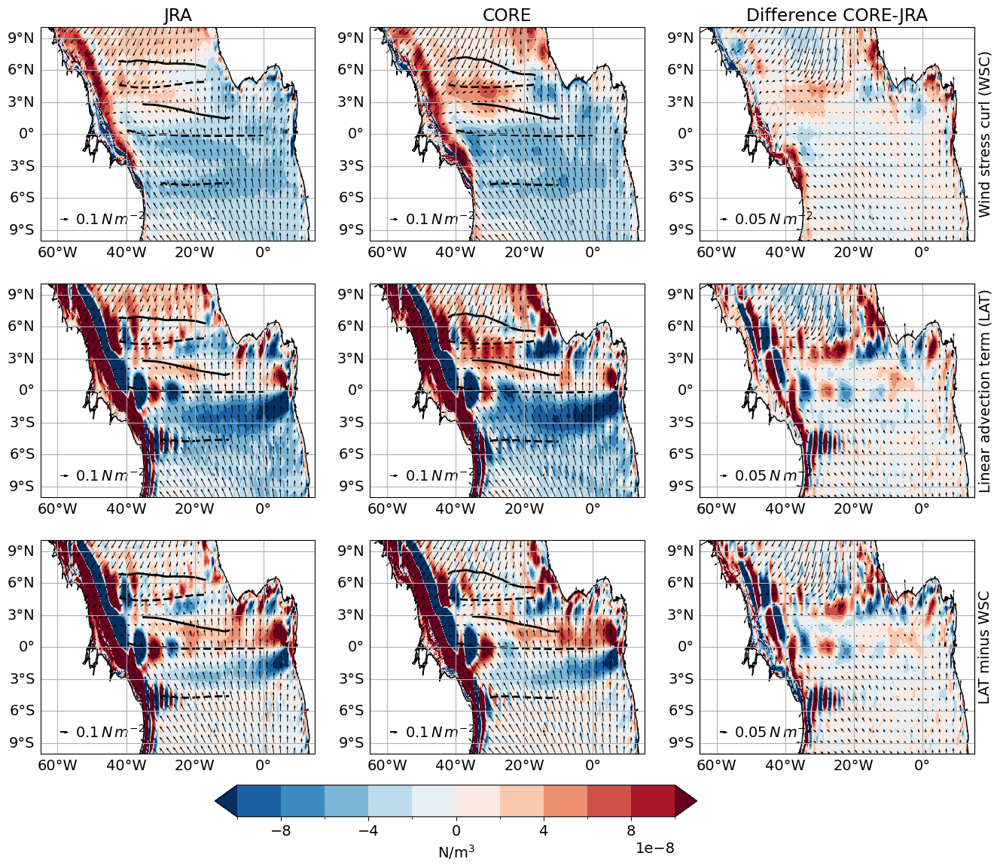

In [52]:
# Quick plot to show the results
lw=2
linest='dashed'

data_crs = ccrs.PlateCarree()

# Quick plot to show the results
data_crs = ccrs.PlateCarree()

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(16,14),sharex=True,sharey=True,subplot_kw={'projection': ccrs.PlateCarree()})

im = plot_results(tau_curl_AM,ds_AM,'JRA',data_crs,axes[0,0])
plot_YCM('JRA',axes[0,0])
im = plot_results(tau_curl_AM,ds_AM,'CORE',data_crs,axes[0,1])
plot_YCM('CORE',axes[0,1])
im = plot_results(tau_curl_AM,ds_AM,'DIFF',data_crs,axes[0,2])

ax2 = axes[0, 2].twinx()
ax2.set_ylabel('Wind stress curl (WSC)')
ax2.tick_params(axis='y', which='both', labelright=False, length=0)

axes[0, 0].set_title('JRA')
axes[0, 1].set_title('CORE')
axes[0, 2].set_title('Difference CORE-JRA')

im = plot_results(ds_lin_adv_mean.Linear_advection_500m,ds_AM,'JRA',data_crs,axes[1,0])
plot_YCM('JRA',axes[1,0])
im = plot_results(ds_lin_adv_mean.Linear_advection_500m,ds_AM,'CORE',data_crs,axes[1,1])
plot_YCM('CORE',axes[1,1])
im = plot_results(ds_lin_adv_mean.Linear_advection_500m,ds_AM,'DIFF',data_crs,axes[1,2])   

ax2 = axes[1, 2].twinx()
ax2.set_ylabel('Linear advection term (LAT)')
ax2.tick_params(axis='y', which='both', labelright=False, length=0)

dummy = (ds_lin_adv_mean.Linear_advection_500m).interp_like(tau_curl_AM) - tau_curl_AM

im = plot_results(dummy,ds_AM,'JRA',data_crs,axes[2,0])
plot_YCM('JRA',axes[2,0])
im = plot_results(dummy,ds_AM,'CORE',data_crs,axes[2,1])
plot_YCM('CORE',axes[2,1])
im = plot_results(dummy,ds_AM,'DIFF',data_crs,axes[2,2])   

ax2 = axes[2, 2].twinx()
ax2.set_ylabel('LAT minus WSC')
ax2.tick_params(axis='y', which='both', labelright=False, length=0)

fig.subplots_adjust(top=0.8,right=0.9)
cbar_ax = fig.add_axes([0.27, 0.05, 0.4, 0.03])
cb =fig.colorbar(im, cax=cbar_ax, extend='both',orientation='horizontal')
cb.set_label('Wind stress curl (N/m$^3$)')
# plt.tight_layout()
if savefig:
    plt.savefig(out_dir+fig_name+fig_format,dpi=300)
cb.set_label('N/m$^3$')

if savefig:
    plt.savefig(out_dir+'INALT20_linear_advection_maps_mean_1980_2009'+fig_format,dpi=300, bbox_inches='tight')

/tmp/ipykernel_225234/708557686.py:47: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


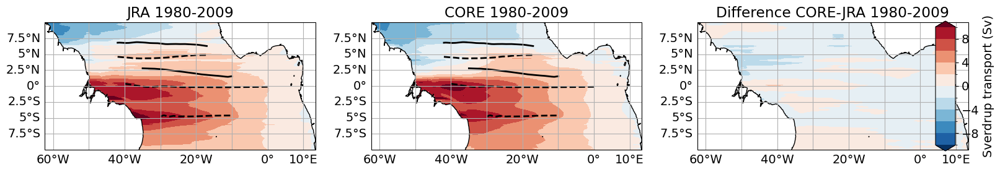

In [53]:
def plot_sv(ds_tau,forcing,data_crs,axes):
    c_vmin,c_vmax,levs=-10, 10,11
    c_vmin_diff,c_vmax_diff,levs_diff=-2, 2,5
        
    if forcing=='DIFF':
        im = ds_tau.diff('forcings').squeeze().plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)
    else:
        im = ds_tau.sel(forcings=forcing).plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)

    axes.axes.axis('tight')
    axes.set_title('')
    axes.coastlines()
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,)
    gl.top_labels = gl.right_labels = False
    return im

# Quick plot to show the results
tlim1_C,tlim2_C = '1980','2009'
tlim1_J,tlim2_J = '1980','2009'
lw=3

data_crs = ccrs.PlateCarree()

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3),subplot_kw={'projection': ccrs.PlateCarree()})

im = plot_sv(T_sv,'JRA',data_crs,axes[0])
plot_YCM('JRA',axes[0])

im = plot_sv(T_sv,'CORE',data_crs,axes[1])
plot_YCM('JRA',axes[1])
im = plot_sv(T_sv,'DIFF',data_crs,axes[2])

axes[0].set_title('JRA 1980-2009')
axes[1].set_title('CORE 1980-2009')
axes[2].set_title('Difference CORE-JRA 1980-2009')

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Sverdrup transport (Sv)')
plt.tight_layout()
if savefig:
    plt.savefig(out_dir+fig_name3+fig_format,dpi=300,bbox_inches='tight')

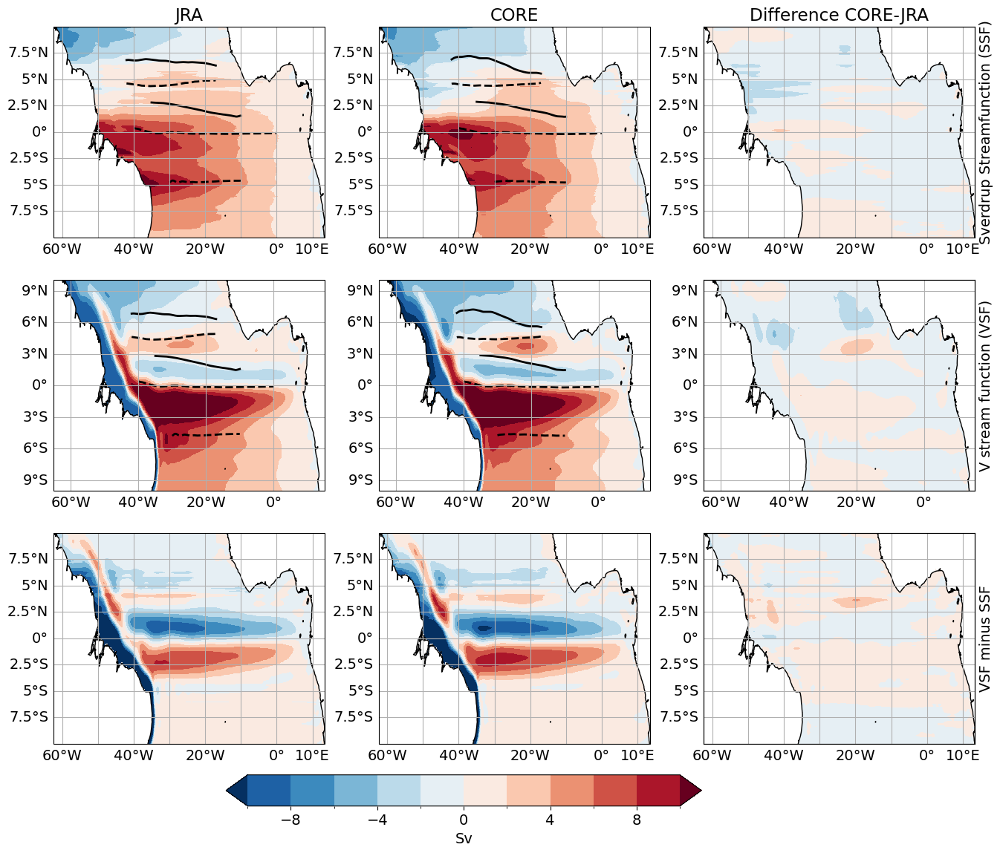

In [54]:
# Quick plot to show the results
data_crs = ccrs.PlateCarree()

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(16,14),subplot_kw={'projection': ccrs.PlateCarree()})

im = plot_sv(T_sv,'JRA',data_crs,axes[0,0])
plot_YCM('JRA',axes[0,0])
im = plot_sv(T_sv,'CORE',data_crs,axes[0,1])
plot_YCM('CORE',axes[0,1])
im = plot_sv(T_sv,'DIFF',data_crs,axes[0,2])

ax2 = axes[0, 2].twinx()
ax2.set_ylabel('Sverdrup Streamfunction (SSF)')
ax2.tick_params(axis='y', which='both', labelright=False, length=0)

axes[0, 0].set_title('JRA')
axes[0, 1].set_title('CORE')
axes[0, 2].set_title('Difference CORE-JRA')

im = plot_sv(V_int_mean,'JRA',data_crs,axes[1,0])
plot_YCM('JRA',axes[1,0])
im = plot_sv(V_int_mean,'CORE',data_crs,axes[1,1])
plot_YCM('CORE',axes[1,1])
im = plot_sv(V_int_mean,'DIFF',data_crs,axes[1,2])   

ax2 = axes[1, 2].twinx()
ax2.set_ylabel('V stream function (VSF)')
ax2.tick_params(axis='y', which='both', labelright=False, length=0)

dummy = (V_int_mean).interp_like(T_sv) - T_sv

im = plot_sv(dummy,'JRA',data_crs,axes[2,0])
im = plot_sv(dummy,'CORE',data_crs,axes[2,1])
im = plot_sv(dummy,'DIFF',data_crs,axes[2,2])   

ax2 = axes[2, 2].twinx()
ax2.set_ylabel('VSF minus SSF')
ax2.tick_params(axis='y', which='both', labelright=False, length=0)

fig.subplots_adjust(top=0.8,right=0.9)
cbar_ax = fig.add_axes([0.27, 0.05, 0.4, 0.03])
cb =fig.colorbar(im, cax=cbar_ax, extend='both',orientation='horizontal')
cb.set_label('Sv')

if savefig:
    plt.savefig(out_dir+'INALT20_Sverdrup_VSF_maps_mean_1980_2009'+fig_format,dpi=300, bbox_inches='tight')

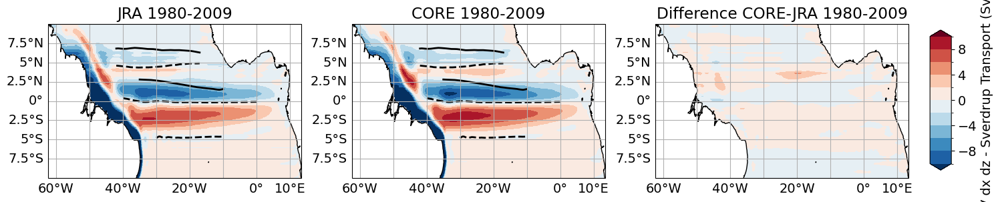

In [55]:
data_crs = ccrs.PlateCarree()
dummy=V_int_mean.interp_like(T_sv)-T_sv
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3),subplot_kw={'projection': ccrs.PlateCarree()})

im = plot_sv(dummy,'JRA',data_crs,axes[0])
plot_YCM('JRA',axes[0])

im = plot_sv(dummy,'CORE',data_crs,axes[1])
plot_YCM('JRA',axes[1])
im = plot_sv(dummy,'DIFF',data_crs,axes[2])

axes[0].set_title('JRA 1980-2009')
axes[1].set_title('CORE 1980-2009')
axes[2].set_title('Difference CORE-JRA 1980-2009')

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('V dx dz - Sverdrup Transport (Sv)')

# if savefig:
    # plt.savefig(out_dir+fig_name3+fig_format,dpi=300,bbox_inches='tight')

In [56]:
def plot_results2(ds_curl,forcing,data_crs,axes,c_vmin,c_vmax,levs,tlim=['1980','2009']):
    import matplotlib.ticker as mticker
    lw = 2
    
    if forcing=='DIFF':
        im = ds_curl.diff('forcings').squeeze().plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)
    else:
        im = ds_curl.sel(forcings=forcing).plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)

    if forcing=='JRA':
        EUC_JRA.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('--k',ax=axes,transform=data_crs,linewidth=lw)
        NEUC_JRA.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('--k',ax=axes,transform=data_crs,linewidth=lw)
        SEUC_JRA.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('--k',ax=axes,transform=data_crs,linewidth=lw)
        NECC_JRA.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('k',ax=axes,transform=data_crs,linewidth=lw)
        nSECu_JRA.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('k',ax=axes,transform=data_crs,linewidth=lw)
    elif forcing=='CORE':
        EUC_CORE.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('--k',ax=axes,transform=data_crs,linewidth=lw)
        NEUC_CORE.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('--k',ax=axes,transform=data_crs,linewidth=lw)
        SEUC_CORE.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('--k',ax=axes,transform=data_crs,linewidth=lw)
        NECC_CORE.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('k',ax=axes,transform=data_crs,linewidth=lw)
        nSECu_CORE.Y_CM.sel(time_counter=slice(*tlim)).mean(dim=['time_counter']).plot.line('k',ax=axes,transform=data_crs,linewidth=lw)
    
    axes.plot([-30,-15,-15,-30,-30],[5,5,10,10,5],'k')
    axes.plot([-0.5,2.5,2.5,-.5,-.5],[-7.5,-7.5,-4.5,-4.5,-7.5],'k')
    axes.axes.axis('tight')
    axes.set_title('')
    axes.coastlines()
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
    gl.top_labels = gl.right_labels = False
    gl.ylocator = mticker.FixedLocator(np.arange(-9,10,3))
    return im

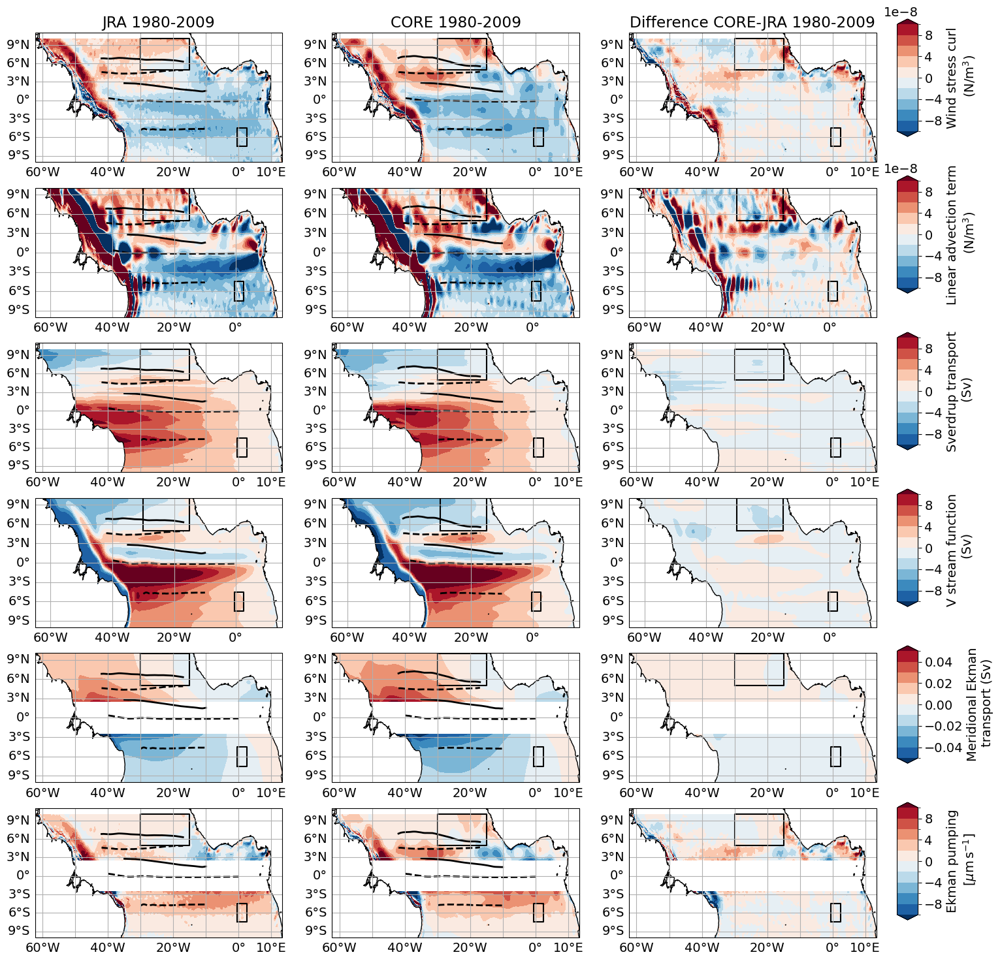

In [57]:
# Quick plot to show the results
tlim= ['1980','2009']
lw=2
linest='dashed'
c_vmin,c_vmax,levs=-10,10,11
ax_no = 6
cb_h = 0.6/ax_no
cb_ht = 0.8/ax_no

data_crs = ccrs.PlateCarree()

fig, axes = plt.subplots(nrows=ax_no, ncols=3, figsize=(16,3*ax_no),subplot_kw={'projection': ccrs.PlateCarree()})

c_vmin,c_vmax,levs=-1e-7,1e-7,11
ax = 0
im = plot_results2(tau_curl_AM,'JRA',data_crs,axes[ax,0],c_vmin,c_vmax,levs)
im = plot_results2(tau_curl_AM,'CORE',data_crs,axes[ax,1],c_vmin,c_vmax,levs)
im = plot_results2(tau_curl_AM,'DIFF',data_crs,axes[ax,2],c_vmin,c_vmax,levs)

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-ax)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Wind stress curl\n (N/m$^3$)')

c_vmin,c_vmax,levs=-1e-7,1e-7,11
ax = 1
im = plot_results2(ds_lin_adv_mean.Linear_advection_500m,'JRA',data_crs,axes[ax,0],c_vmin,c_vmax,levs)
im = plot_results2(ds_lin_adv_mean.Linear_advection_500m,'CORE',data_crs,axes[ax,1],c_vmin,c_vmax,levs)
im = plot_results2(ds_lin_adv_mean.Linear_advection_500m,'DIFF',data_crs,axes[ax,2],c_vmin,c_vmax,levs)

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-ax)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Linear advection term\n (N/m$^3$)')

c_vmin,c_vmax,levs=-10,10,11
ax = 2
im = plot_results2(T_sv,'JRA',data_crs,axes[ax,0],c_vmin,c_vmax,levs)
im = plot_results2(T_sv,'CORE',data_crs,axes[ax,1],c_vmin,c_vmax,levs)
im = plot_results2(T_sv,'DIFF',data_crs,axes[ax,2],c_vmin,c_vmax,levs)

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-ax)*cb_ht, 0.02,cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Sverdrup transport\n (Sv)')


c_vmin,c_vmax,levs=-10,10,11
ax = 3
im = plot_results2(V_int_mean,'JRA',data_crs,axes[ax,0],c_vmin,c_vmax,levs)
im = plot_results2(V_int_mean,'CORE',data_crs,axes[ax,1],c_vmin,c_vmax,levs)
im = plot_results2(V_int_mean,'DIFF',data_crs,axes[ax,2],c_vmin,c_vmax,levs)

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-ax)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('V stream function \n (Sv)')

c_vmin,c_vmax,levs=-5e-2,5e-2,11
ax = 4
im = plot_results2(T_E_AM,'JRA',data_crs,axes[ax,0],c_vmin,c_vmax,levs)
im = plot_results2(T_E_AM,'CORE',data_crs,axes[ax,1],c_vmin,c_vmax,levs)
im = plot_results2(T_E_AM,'DIFF',data_crs,axes[ax,2],c_vmin,c_vmax,levs)

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-ax)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Meridional Ekman\n transport (Sv)')

c_vmin,c_vmax,levs=-10,10,11
ax = 5
im = plot_results2(w_ek_clim.w_ek.mean('month'),'JRA',data_crs,axes[ax,0],c_vmin,c_vmax,levs)
im = plot_results2(w_ek_clim.w_ek.mean('month'),'CORE',data_crs,axes[ax,1],c_vmin,c_vmax,levs)
im = plot_results2(w_ek_clim.w_ek.mean('month'),'DIFF',data_crs,axes[ax,2],c_vmin,c_vmax,levs)

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-ax)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Ekman pumping\n [$\mu$m$\,$s$^{-1}$]')

axes[0,0].set_title('JRA 1980-2009')
axes[0,1].set_title('CORE 1980-2009')
axes[0,2].set_title('Difference CORE-JRA 1980-2009')

plt.savefig(out_dir+f'1_INALT20_wind_forcing_mean_{tlim[0]}_{tlim[1]}'+fig_format,dpi=300,bbox_inches='tight')

In [58]:
GD_lat, GD_lon = [5,10],[-30,-15]
curl_GD = tau_curl_AM.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon']).values
print(f'GD - Wind stress curl (N/m$^3), JRA, CORE:{curl_GD}, ratio {curl_GD[1]/curl_GD[0]}')
w_ek_GD = w_ek_clim.w_ek.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon','month']).values
print(f'GD - Ekman pumping ($\mu$m/s), JRA, CORE:{w_ek_GD}, ratio {w_ek_GD[1]/w_ek_GD[0]}')

GD_lat, GD_lon = [5,10],[-15,7.5]
curl_GD = ds_AM.tauy.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon']).values
print(f'Coastal - Wind stress (N/m$^2), JRA, CORE:{curl_GD}, ratio {curl_GD[1]/curl_GD[0]}')
w_ek_GD = w_ek_clim.w_ek.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon','month']).values
print(f'Coastal - Ekman pumping ($\mu$m/s), JRA, CORE:{w_ek_GD}, ratio {w_ek_GD[1]/w_ek_GD[0]}')

AD_lat, AD_lon = [-7.5,-4.5],[-0.5,2.5]
curl_AD = tau_curl_AM.sel(lat=slice(*AD_lat),lon=slice(*AD_lon)).mean(['lat','lon']).values
print(f'AD - Wind stress curl (N/m$^3), JRA, CORE:{curl_AD}, ratio {curl_AD[1]/curl_AD[0]}')
w_ek_AD = w_ek_clim.w_ek.sel(lat=slice(*AD_lat),lon=slice(*AD_lon)).mean(['lat','lon','month']).values
print(f'AD - Ekman pumping ($\mu$m/s), JRA, CORE:{w_ek_AD}, ratio {w_ek_AD[1]/w_ek_AD[0]}')

GD - Wind stress curl (N/m$^3), JRA, CORE:[1.22698089e-08 1.85337961e-08], ratio 1.5105203597719175
GD - Ekman pumping ($\mu$m/s), JRA, CORE:[0.49496765 0.77744039], ratio 1.5706892912913148
Coastal - Wind stress (N/m$^2), JRA, CORE:[0.01159924 0.02227905], ratio 1.9207331373828695
Coastal - Ekman pumping ($\mu$m/s), JRA, CORE:[-1.21445143  1.03470344], ratio -0.851992440499663
AD - Wind stress curl (N/m$^3), JRA, CORE:[-3.70488403e-08 -3.69484981e-08], ratio 0.9972916238648544
AD - Ekman pumping ($\mu$m/s), JRA, CORE:[2.47445952 2.46407925], ratio 0.9958050348612066


In [59]:
# import regionmask
dummy1=NEUC_JRA.INT.sel(time_counter=slice(*tlim),lon=slice(-25,None)).mean(dim=['time_counter','lon']).values
dummy2=NEUC_CORE.INT.sel(time_counter=slice(*tlim),lon=slice(-25,None)).mean(dim=['time_counter','lon']).values
print(f'NEUC JRA:{dummy1}')
print(f'NEUC CORE:{dummy2}')
print(f'NEUC ratio:{dummy2/dummy1}')

dummy1=SEUC_JRA.INT.sel(time_counter=slice(*tlim)).mean(dim=['time_counter','lon']).values
dummy2=SEUC_CORE.INT.sel(time_counter=slice(*tlim)).mean(dim=['time_counter','lon']).values
print(f'SEUC JRA:{dummy1}')
print(f'SEUC CORE:{dummy2}')
print(f'SEUC ratio:{dummy2/dummy1}')

dummy1=NECC_JRA.INT.sel(time_counter=slice(*tlim),lon=slice(-30,None)).mean(dim=['time_counter','lon']).values
dummy2=NECC_CORE.INT.sel(time_counter=slice(*tlim),lon=slice(-30,None)).mean(dim=['time_counter','lon']).values
print(f'NECC JRA:{dummy1}')
print(f'NECC CORE:{dummy2}')
print(f'NECC ratio:{dummy2/dummy1}')

NEUC JRA:3.9955158594544216
NEUC CORE:6.099920016792404
NEUC ratio:1.5266914789884813
SEUC JRA:3.375505349739191
SEUC CORE:3.399331190637044
SEUC ratio:1.0070584515292484
NECC JRA:3.7150973607064004
NECC CORE:5.430096741293561
NECC ratio:1.461629727050024


In [60]:
lonidx=[-35,-30,-23]

for loni in lonidx:
    print(loni)
    dummy1=NECC_JRA.INT.sel(time_counter=slice(*tlim)).sel(lon=loni,method='nearest').mean(dim=['time_counter']).values
    dummy2=NECC_CORE.INT.sel(time_counter=slice(*tlim)).sel(lon=loni,method='nearest').mean(dim=['time_counter']).values
    print(f'NECC JRA:{dummy1}')
    print(f'NECC CORE:{dummy2}')
    print(f'NECC diff:{dummy2-dummy1}')
    print(f'NECC ratio:{dummy2/dummy1}')

    dummy = T_sv.sel(lon=loni,lat=[3,10],method='nearest').diff('lat')
    print(dummy.values)
    print(dummy.diff('forcings').values)
    print((dummy[1]/dummy[0]).values)

-35
NECC JRA:5.244874382107317
NECC CORE:5.736646198725594
NECC diff:0.49177181661827696
NECC ratio:1.093762363174214
[[-5.54802308]
 [-5.38876034]]
[[0.15926274]]
[0.97129379]
-30
NECC JRA:4.557129767699935
NECC CORE:5.860878861677206
NECC diff:1.3037490939772702
NECC ratio:1.2860899646128128
[[-5.24745495]
 [-6.12781399]]
[[-0.88035903]]
[1.16776876]
-23
NECC JRA:3.6818778270935506
NECC CORE:5.541032343927861
NECC diff:1.8591545168343102
NECC ratio:1.5049473676593756
[[-4.94767938]
 [-5.87588607]]
[[-0.92820668]]
[1.18760445]


In [61]:
GD_lat, GD_lon = [0,5],[-35,-15]
curl_GD = ds_AM.taux.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon']).values
print(f'SEC - zonal wind stress (N/m$^2), JRA, CORE:{curl_GD}, ratio {curl_GD[1]/curl_GD[0]}, diff {curl_GD[1]-curl_GD[0]}')
w_ek_GD = w_ek_clim.w_ek.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon','month']).values
print(f'SEC - Ekman pumping ($\mu$m/s), JRA, CORE:{w_ek_GD}, ratio {w_ek_GD[1]/w_ek_GD[0]}, diff {w_ek_GD[1]-w_ek_GD[0]}')

dummy1=nSECu_JRA.INT.sel(time_counter=slice(*tlim),lon=slice(*GD_lon)).mean(dim=['time_counter','lon']).values
dummy2=nSECu_CORE.INT.sel(time_counter=slice(*tlim),lon=slice(*GD_lon)).mean(dim=['time_counter','lon']).values
dummy1=dummy1+nSECl_JRA.INT.sel(time_counter=slice(*tlim),lon=slice(*GD_lon)).mean(dim=['time_counter','lon']).values
dummy2=dummy2+nSECl_CORE.INT.sel(time_counter=slice(*tlim),lon=slice(*GD_lon)).mean(dim=['time_counter','lon']).values
print(f'nSECu+l JRA:{dummy1}')
print(f'nSECu+l CORE:{dummy2}')
print(f'nSECu+l ratio:{dummy2/dummy1}')

SEC - zonal wind stress (N/m$^2), JRA, CORE:[-0.02413139 -0.03080689], ratio 1.2766311073795582, diff -0.0066754942848063804
SEC - Ekman pumping ($\mu$m/s), JRA, CORE:[0.94214433 2.16677262], ratio 2.29983088012358, diff 1.2246282942588431
nSECu+l JRA:-10.746179485520809
nSECu+l CORE:-13.043130134491282
nSECu+l ratio:1.2137457923595394


# Seasons

In [62]:
def calc_season(w_ek_clim,weights):
    ds = w_ek_clim.rename({'month':'time'})
    ds['time']=weights.time
    return (ds*weights).groupby('time.season').sum(dim='time',skipna=False)

In [63]:
w_ek_SM = calc_season(w_ek_clim.w_ek,weights)
V_int_SM = calc_sv(ds_lin_adv_SM.Linear_advection_500m,ds_lin_adv_SM.e2v)

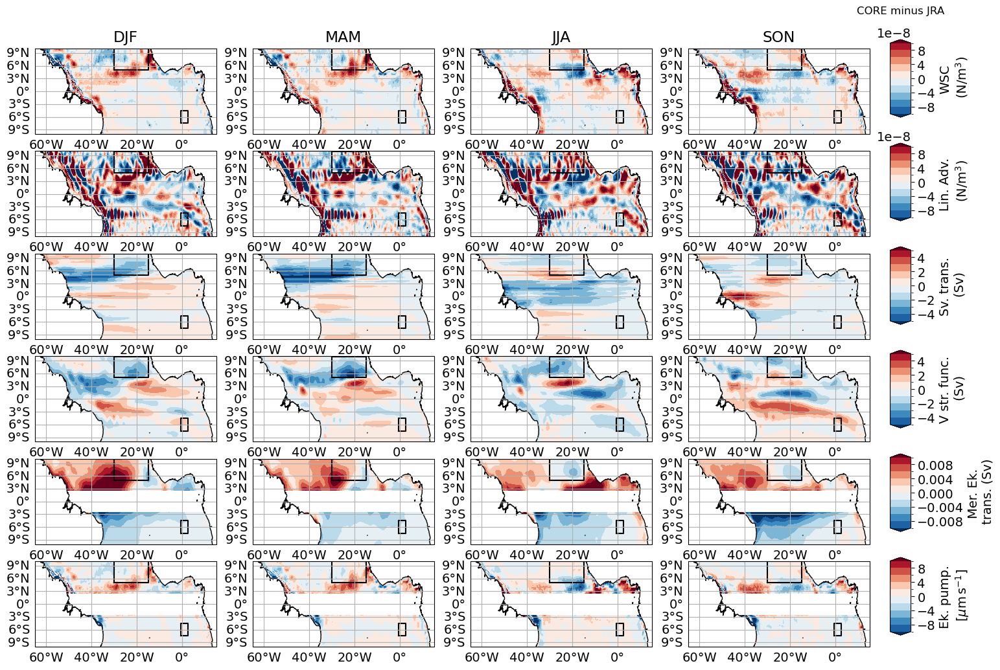

In [64]:
lw=2
linest='dashed'
c_vmin,c_vmax,levs=-10,10,11
season = ['DJF','MAM','JJA','SON']

ax_no = 6
cb_h = 0.6/ax_no
cb_ht = 0.8/ax_no

data_crs = ccrs.PlateCarree()

fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(16,3*4),subplot_kw={'projection': ccrs.PlateCarree()},sharex=True,sharey=True)

c_vmin,c_vmax,levs=-1e-7,1e-7,11
axi = 0
for i,ax in enumerate(axes[axi,:]):
    im = plot_results2(tau_curl_SM.sel(season=season[i]),'DIFF',data_crs,ax,c_vmin,c_vmax,levs)
    ax.set_title(f'{tau_curl_SM.sel(season=season[i]).season.values}')

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-axi)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('WSC\n (N/m$^3$)')
cbar_ax.set_title('CORE minus JRA',pad=15,fontsize=12)

c_vmin,c_vmax,levs=-1e-7,1e-7,11
axi = 1
for i,ax in enumerate(axes[axi,:]):
    im = plot_results2(ds_lin_adv_SM.Linear_advection_500m.sel(season=season[i]),'DIFF',data_crs,ax,c_vmin,c_vmax,levs)

fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-axi)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Lin. Adv. \n (N/m$^3$)')

c_vmin,c_vmax,levs=-5,5,11
axi = 2
for i,ax in enumerate(axes[axi,:]):
    im = plot_results2(T_sv_SM.sel(season=season[i]),'DIFF',data_crs,ax,c_vmin,c_vmax,levs)
fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-axi)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Sv. trans.\n (Sv)')

c_vmin,c_vmax,levs=-5,5,11
axi = 3
for i,ax in enumerate(axes[axi,:]):
    im = plot_results2(V_int_SM.sel(season=season[i]),'DIFF',data_crs,ax,c_vmin,c_vmax,levs)
fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-axi)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('V str. func.\n (Sv)')

c_vmin,c_vmax,levs=-1e-2,1e-2,11
axi = 4
for i,ax in enumerate(axes[axi,:]):
    im = plot_results2(T_E_SM.sel(season=season[i]),'DIFF',data_crs,ax,c_vmin,c_vmax,levs)
fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-axi)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Mer. Ek.\n trans. (Sv)')

c_vmin,c_vmax,levs=-10,10,11
axi = 5
for i,ax in enumerate(axes[axi,:]):
    im = plot_results2(w_ek_SM.sel(season=season[i]),'DIFF',data_crs,ax,c_vmin,c_vmax,levs)
fig.subplots_adjust(right=0.93)
cbar_ax = fig.add_axes([0.95, 0.125+(ax_no-1-axi)*cb_ht, 0.02, cb_h])
cb =fig.colorbar(im, cax=cbar_ax, extend='both')
cb.set_label('Ek. pump.\n [$\mu$m$\,$s$^{-1}$]')

plt.savefig(out_dir+f'1_INALT20_wind_forcing_maps_DIFF_season_{tlim[0]}_{tlim[1]}.png',dpi=300, bbox_inches='tight')

GD tau curl amplitude - JRA 6e-08
GD tau curl amplitude - CORE 1.4e-07
GD ratio CORE/JRA - 2.2
GD w_ek amplitude - JRA 5.5
GD w_ek amplitude - CORE 11.9
GD ratio CORE/JRA - 2.2
GD lin adv amplitude - JRA 1.3e-07
GD lin adv amplitude - CORE 1.8e-07
GD ratio CORE/JRA - 1.4


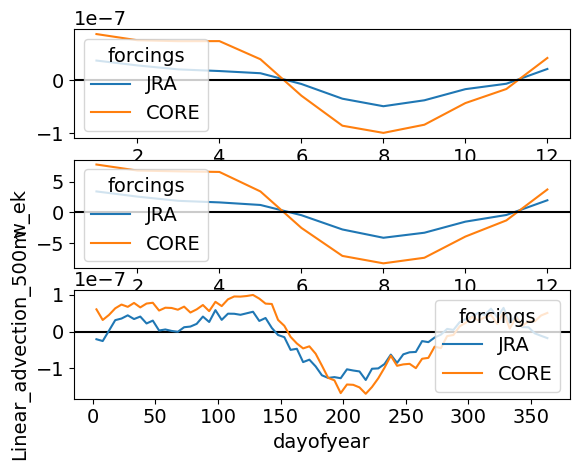

In [65]:
GD_lat, GD_lon = [3,6],[-30,-15]
fig,axs = plt.subplots(3,1)
ax=axs[0]
dummy = tau_curl_clim.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon'])
dummy.plot(ax=ax,hue='forcings')
amp = dummy.max('month')-dummy.min('month')/2
print(f'GD tau curl amplitude - {amp.forcings.isel(forcings=0).data} {amp.isel(forcings=0).round(decimals=8).data}')
print(f'GD tau curl amplitude - {amp.forcings.isel(forcings=1).data} {amp.isel(forcings=1).round(decimals=8).data}')
print(f'GD ratio CORE/JRA - {(amp.isel(forcings=1)/amp.isel(forcings=0)).round(decimals=1).data}')

ax=axs[1]
dummy = w_ek_clim.w_ek.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon'])
dummy.plot(ax=ax,hue='forcings')
amp = dummy.max('month')-dummy.min('month')/2
print(f'GD w_ek amplitude - {amp.forcings.isel(forcings=0).data} {amp.isel(forcings=0).round(decimals=1).data}')
print(f'GD w_ek amplitude - {amp.forcings.isel(forcings=1).data} {amp.isel(forcings=1).round(decimals=1).data}')
print(f'GD ratio CORE/JRA - {(amp.isel(forcings=1)/amp.isel(forcings=0)).round(decimals=1).data}')
for ax in axs:
    ax.axhline(0,color='k')

ax=axs[2]
dummy = ds_lin_adv_clim.sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon'])
dummy.plot(ax=ax,hue='forcings')
amp = dummy.max('dayofyear')-dummy.min('dayofyear')/2
print(f'GD lin adv amplitude - {amp.forcings.isel(forcings=0).data} {amp.isel(forcings=0).round(decimals=8).data}')
print(f'GD lin adv amplitude - {amp.forcings.isel(forcings=1).data} {amp.isel(forcings=1).round(decimals=8).data}')
print(f'GD ratio CORE/JRA - {(amp.isel(forcings=1)/amp.isel(forcings=0)).round(decimals=1).data}')

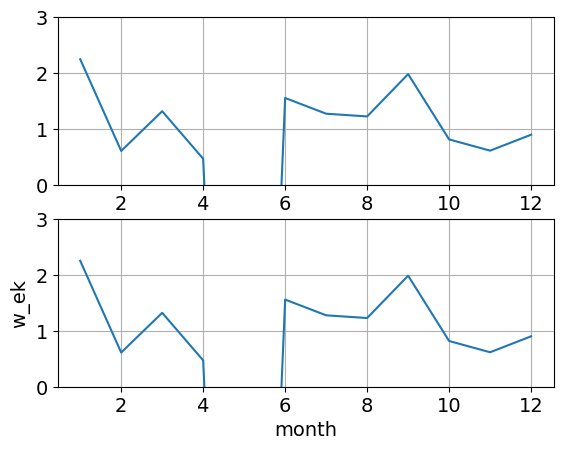

In [66]:
GD_lat, GD_lon = [5,10],[-30,-15]
fig,axs = plt.subplots(2,1)
ax=axs[0]
(tau_curl_clim.sel(forcings='CORE')/tau_curl_clim.sel(forcings='JRA')
    ).sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon']
    ).plot(ax=ax,ylim=[0,3])
ax=axs[1]
(w_ek_clim.w_ek.sel(forcings='CORE')/w_ek_clim.w_ek.sel(forcings='JRA')
    ).sel(lat=slice(*GD_lat),lon=slice(*GD_lon)).mean(['lat','lon']
    ).plot(ax=ax,ylim=[0,3])

for ax in axs:
    ax.grid()

## Sverdrup different period

In [67]:
def plot_sv(ds_tau,forcing,data_crs,axes):
    c_vmin,c_vmax,levs=-3, 3,11
        
    if forcing=='DIFF':
        im = ds_tau.diff('forcings').squeeze().plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)
    else:
        im = ds_tau.sel(forcings=forcing).plot.pcolormesh(
            ax=axes, vmin=c_vmin, vmax=c_vmax,levels=levs,
            cmap='RdBu_r',add_colorbar=False, extend='both',
            transform=data_crs)

    axes.axes.axis('tight')
    axes.set_title('')
    axes.coastlines()
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,)
    gl.top_labels = gl.right_labels = False
    return im

# Quick plot to show the results
def plot_sv_10years(yy1,yy2):
    lw=3

    data_crs = ccrs.PlateCarree()

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3),subplot_kw={'projection': ccrs.PlateCarree()})

    im = plot_sv(T_sv_A.sel(year=slice(yy1,yy2)).mean('year'),'JRA',data_crs,axes[0])
    EUC_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[0],transform=data_crs,linewidth=lw)
    NEUC_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[0],transform=data_crs,linewidth=lw)
    SEUC_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[0],transform=data_crs,linewidth=lw)
    NECC_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('w',ax=axes[0],transform=data_crs,linewidth=lw)
    nSECu_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('w',ax=axes[0],transform=data_crs,linewidth=lw)

    im = plot_sv(T_sv_A.sel(year=slice(yy1,yy2)).mean('year'),'CORE',data_crs,axes[1])
    EUC_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[1],transform=data_crs,linewidth=lw)
    NEUC_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[1],transform=data_crs,linewidth=lw)
    SEUC_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[1],transform=data_crs,linewidth=lw)
    NECC_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('w',ax=axes[1],transform=data_crs,linewidth=lw)
    nSECu_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('w',ax=axes[1],transform=data_crs,linewidth=lw)
    im = plot_sv(T_sv_A.sel(year=slice(yy1,yy2)).mean('year'),'DIFF',data_crs,axes[2])

    axes[0].set_title(f'JRA {yy1}-{yy2}')
    axes[1].set_title(f'CORE {yy1}-{yy2}')
    axes[2].set_title(f'Difference CORE-JRA {yy1}-{yy2}')

    fig.subplots_adjust(right=0.93)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
    cb =fig.colorbar(im, cax=cbar_ax, extend='both')
    cb.set_label('Anomalous\n Sverdrup transport (Sv)')
    if savefig:
        plt.savefig(out_dir+f'INALT20_JRA_CORE_SV_{yy1}_{yy2}'+fig_format,dpi=300,bbox_inches='tight')

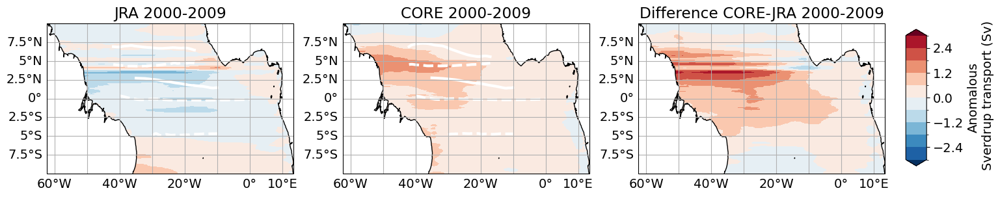

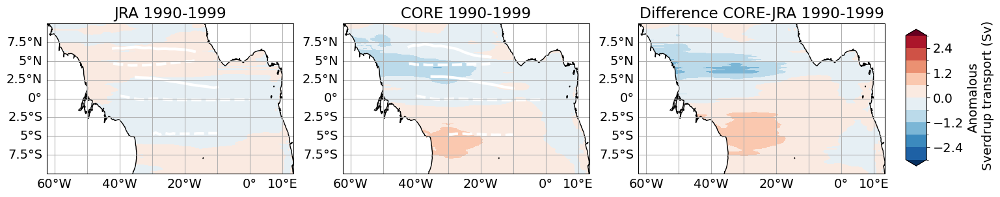

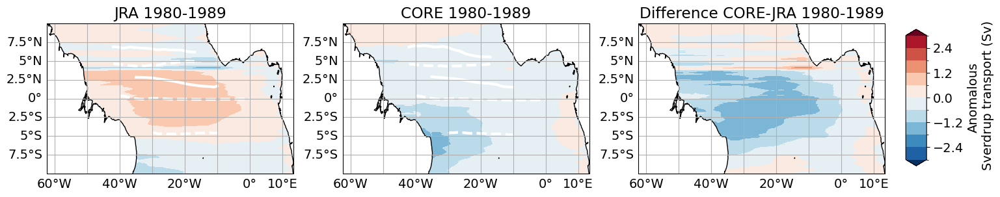

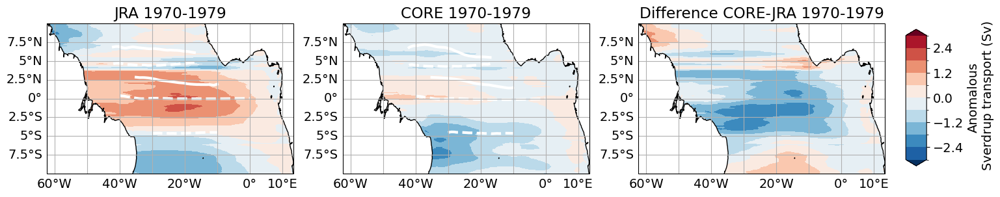

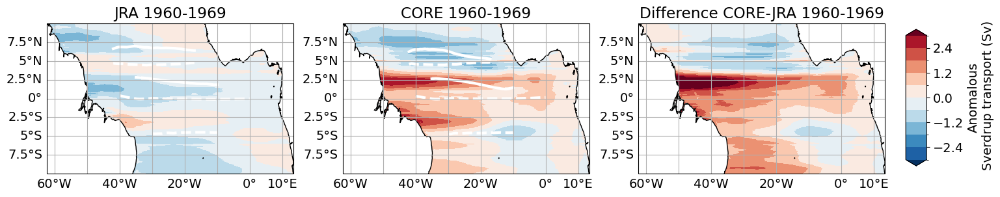

In [68]:
plot_sv_10years('2000','2009')
plot_sv_10years('1990','1999')
plot_sv_10years('1980','1989')
plot_sv_10years('1970','1979')
plot_sv_10years('1960','1969')

In [69]:
def plot_lin_adv_10years(yy1,yy2):
    lw=3

    data_crs = ccrs.PlateCarree()

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3),subplot_kw={'projection': ccrs.PlateCarree()})
    c_vmin,c_vmax,levs=-1e-7,1e-7,11

    dummy = ds_lin_adv_A.sel(time_counter=slice(yy1,yy2)).mean('time_counter').compute()
    im = plot_results2(dummy,'JRA',data_crs,axes[0],c_vmin,c_vmax,levs,tlim=[yy1,yy2])

    im = plot_results2(dummy,'CORE',data_crs,axes[1],c_vmin,c_vmax,levs,tlim=[yy1,yy2])
    im = plot_results2(dummy,'DIFF',data_crs,axes[2],c_vmin,c_vmax,levs,tlim=[yy1,yy2])

    axes[0].set_title(f'JRA {yy1}-{yy2}')
    axes[1].set_title(f'CORE {yy1}-{yy2}')
    axes[2].set_title(f'Difference CORE-JRA {yy1}-{yy2}')

    fig.subplots_adjust(right=0.93)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
    cb =fig.colorbar(im, cax=cbar_ax, extend='both')
    cb.set_label('Lin Adv Term (N/m$^3$')
    if savefig:
        plt.savefig(out_dir+f'INALT20_JRA_CORE_lin_adv_A_{yy1}_{yy2}'+fig_format,dpi=300,bbox_inches='tight')

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 719.30 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


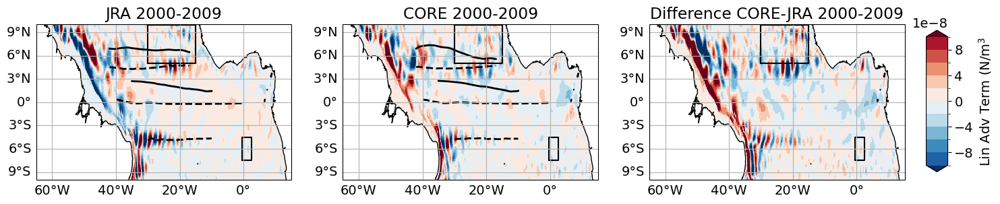

In [70]:
plot_lin_adv_10years('2000','2009')

In [71]:
def plot_V_int_A_10years(yy1,yy2):
    lw=3

    data_crs = ccrs.PlateCarree()

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3),subplot_kw={'projection': ccrs.PlateCarree()})
    c_vmin,c_vmax,levs=-1e-7,1e-7,11

    dummy = V_int_A.sel(time_counter=slice(yy1,yy2)).mean('time_counter').compute()
    im = plot_sv(dummy,'JRA',data_crs,axes[0])
    EUC_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[0],transform=data_crs,linewidth=lw)
    NEUC_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[0],transform=data_crs,linewidth=lw)
    SEUC_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[0],transform=data_crs,linewidth=lw)
    NECC_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('w',ax=axes[0],transform=data_crs,linewidth=lw)
    nSECu_JRA.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('w',ax=axes[0],transform=data_crs,linewidth=lw)

    im = plot_sv(dummy,'CORE',data_crs,axes[1])
    EUC_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[1],transform=data_crs,linewidth=lw)
    NEUC_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[1],transform=data_crs,linewidth=lw)
    SEUC_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('--w',ax=axes[1],transform=data_crs,linewidth=lw)
    NECC_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('w',ax=axes[1],transform=data_crs,linewidth=lw)
    nSECu_CORE.Y_CM.sel(time_counter=slice(yy1,yy2)).mean(dim=['time_counter']).plot.line('w',ax=axes[1],transform=data_crs,linewidth=lw)
    im = plot_sv(dummy,'DIFF',data_crs,axes[2])

    axes[0].set_title(f'JRA {yy1}-{yy2}')
    axes[1].set_title(f'CORE {yy1}-{yy2}')
    axes[2].set_title(f'Difference CORE-JRA {yy1}-{yy2}')

    fig.subplots_adjust(right=0.93)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
    cb =fig.colorbar(im, cax=cbar_ax, extend='both')
    cb.set_label('Anomalous V\n stream function (Sv) ')
    if savefig:
        plt.savefig(out_dir+f'INALT20_JRA_CORE_V_int_A_{yy1}_{yy2}'+fig_format,dpi=300,bbox_inches='tight')

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 724.23 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 724.23 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 724.23 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 724.23 MiB.
This may cause some slowdown.
Consider scattering data ahead 

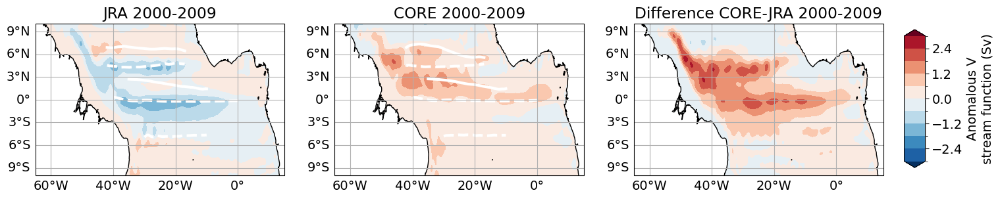

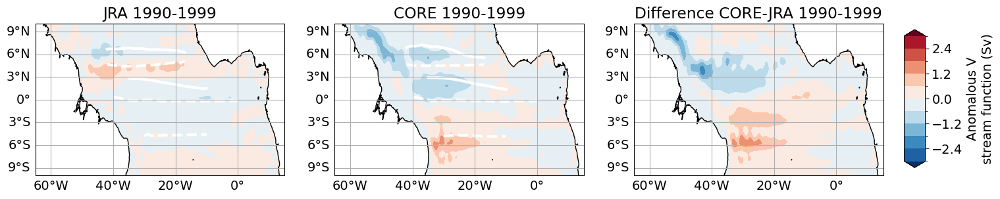

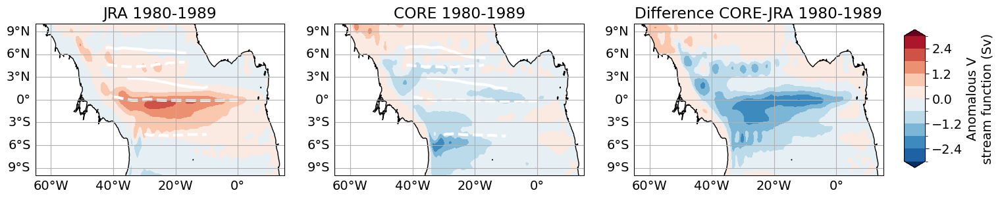

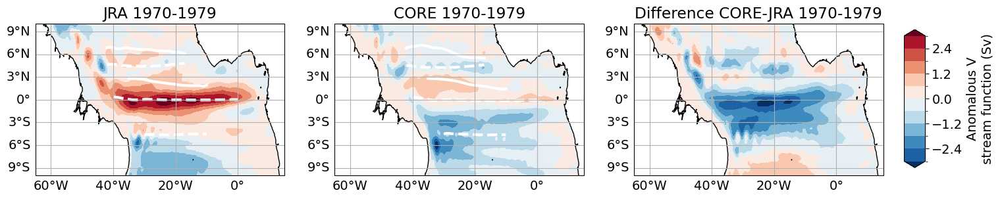

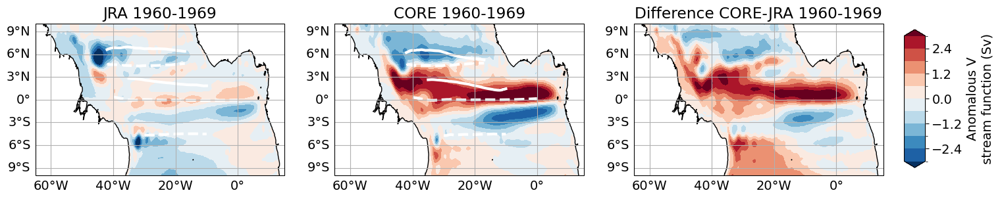

In [72]:
plot_V_int_A_10years('2000','2009')
plot_V_int_A_10years('1990','1999')
plot_V_int_A_10years('1980','1989')
plot_V_int_A_10years('1970','1979')
plot_V_int_A_10years('1960','1969')

# 10 year means

In [73]:
def plot_curl_10years(yy1,yy2):
    lw=3

    data_crs = ccrs.PlateCarree()

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,3),subplot_kw={'projection': ccrs.PlateCarree()})
    c_vmin,c_vmax,levs=-1e-7,1e-7,11

    dummy = ds_AM_curl.sel(year=slice(yy1,yy2)).mean('year').compute()
    im = plot_results2(dummy,'JRA',data_crs,axes[0],c_vmin,c_vmax,levs,tlim=[str(yy1),str(yy2)])

    im = plot_results2(dummy,'CORE',data_crs,axes[1],c_vmin,c_vmax,levs,tlim=[str(yy1),str(yy2)])
    im = plot_results2(dummy,'DIFF',data_crs,axes[2],c_vmin,c_vmax,levs,tlim=[str(yy1),str(yy2)])

    axes[0].set_title(f'JRA {yy1}-{yy2}')
    axes[1].set_title(f'CORE {yy1}-{yy2}')
    axes[2].set_title(f'Difference CORE-JRA {yy1}-{yy2}')

    fig.subplots_adjust(right=0.93)
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
    cb =fig.colorbar(im, cax=cbar_ax, extend='both')
    cb.set_label('Curl (N/m^3)')
    if savefig:
        plt.savefig(out_dir+f'INALT20_JRA_CORE_curl_A_{yy1}_{yy2}'+fig_format,dpi=300,bbox_inches='tight')

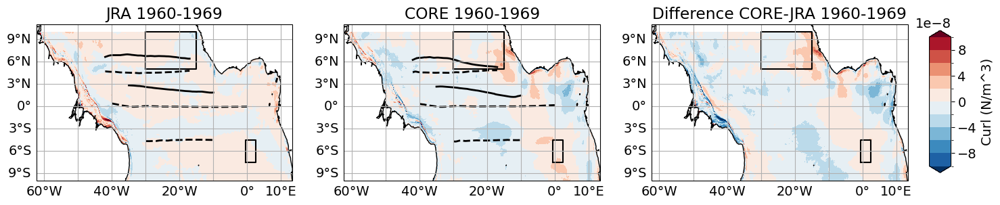

In [74]:
plot_curl_10years(1960,1969)

In [75]:
# Quick plot to show the results
def plot_taux_10yrmean(yy1,yy2):

    data_crs = ccrs.PlateCarree()

    fig, axes = plt.subplots(nrows=11, ncols=3, figsize=(16,14*2.2),subplot_kw={'projection': ccrs.PlateCarree()})

    for idx,yy in enumerate(range(yy1,yy2+1)):
        stress_dummy=ds_AM_A.sel(year=yy)
        im = plot_taux(stress_dummy,'JRA',data_crs,axes[idx,0])
        im = plot_taux(stress_dummy,'CORE',data_crs,axes[idx,1])
        im = plot_taux(stress_dummy,'DIFF',data_crs,axes[idx,2])
        
        axes[idx, 0].annotate(f'{yy}', xy=(0,0), xycoords='axes fraction',
                xytext=(5, 3), textcoords='offset points', 
                 horizontalalignment='left', verticalalignment='bottom')

    stress_dummy=ds_AM_A.sel(year=slice(yy1,yy2)).mean('year')
    im = plot_taux(stress_dummy,'JRA',data_crs,axes[10,0])
    im = plot_taux(stress_dummy,'CORE',data_crs,axes[10,1])
    im = plot_taux(stress_dummy,'DIFF',data_crs,axes[10,2])

    axes[10,0].annotate(f'{yy1}-{yy2}', xy=(0,0), xycoords='axes fraction',
                xytext=(5, 3), textcoords='offset points', 
                 horizontalalignment='left', verticalalignment='bottom')


    axes[0, 0].set_title('JRA')
    axes[0, 1].set_title('CORE')
    axes[0, 2].set_title('Difference CORE-JRA')


    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.27, 0.05, 0.4, 0.03])
    cb =fig.colorbar(im, cax=cbar_ax, extend='both',orientation='horizontal')
    cb.set_label('Wind stress (N/m$^2$)')
    # plt.tight_layout()
    if savefig:
        plt.savefig(out_dir+f'INALT20_JRA_CORE_taux_{yy1}_{yy2}'+fig_format,dpi=300)

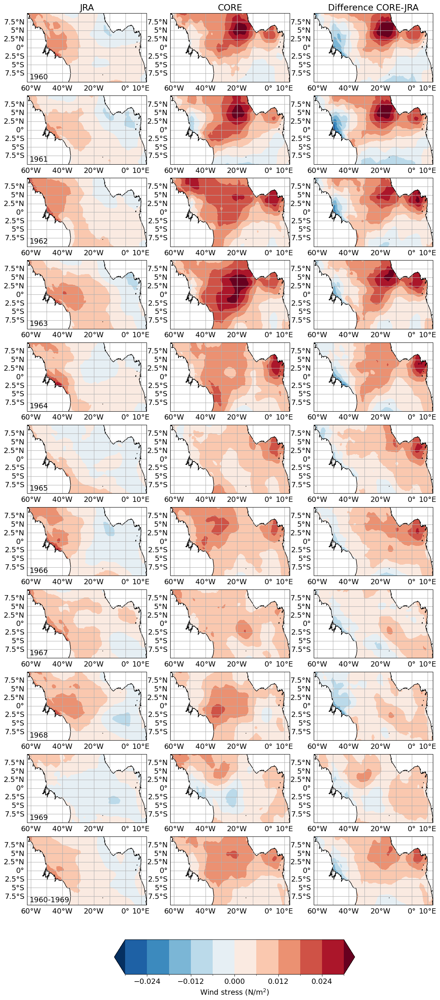

In [76]:
plot_taux_10yrmean(1960,1969)
# plot_taux_10yrmean(1970,1979)
# plot_taux_10yrmean(1980,1989)
# plot_taux_10yrmean(1990,1999)
# plot_taux_10yrmean(2000,2009)

# Longer-term changes in winds and transports

In [77]:
ds_AM_A = ds_AM_A.isel(forcings=slice(None, None, -1))
ds_AM_curl = ds_AM_curl.isel(forcings=slice(None, None, -1))
T_sv_A = T_sv_A.isel(forcings=slice(None, None, -1))

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

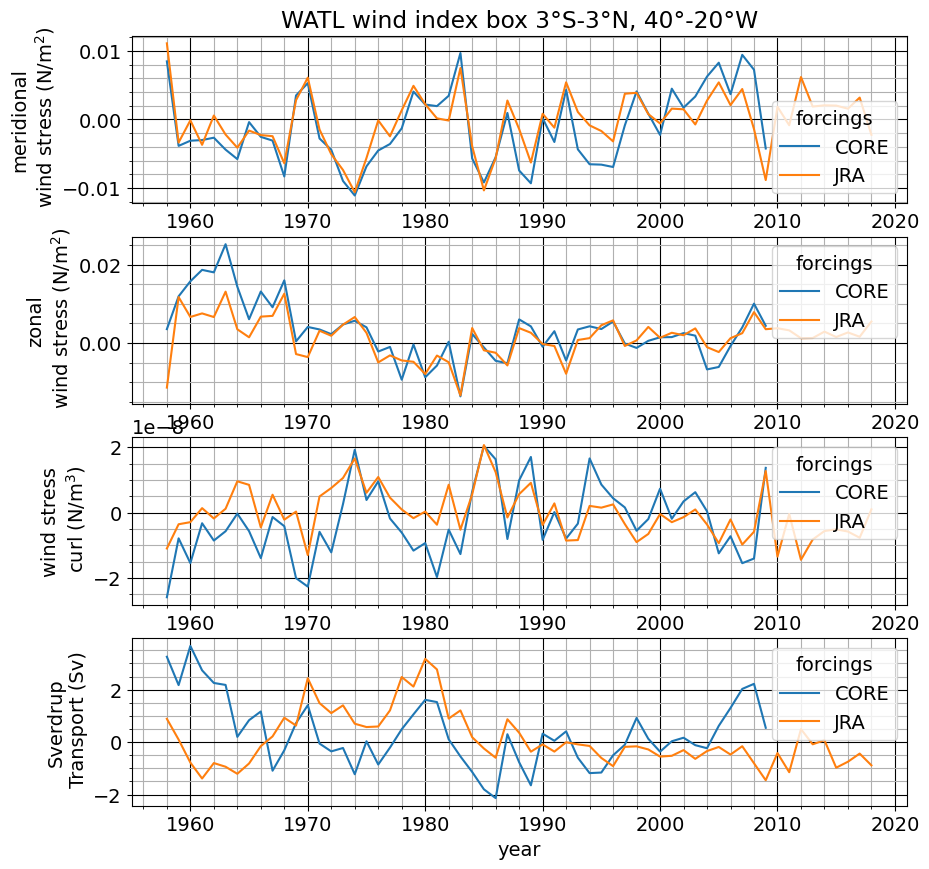

In [78]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=-3,3,-40,-20
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'WATL wind index box {abs(lat1)}°S-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

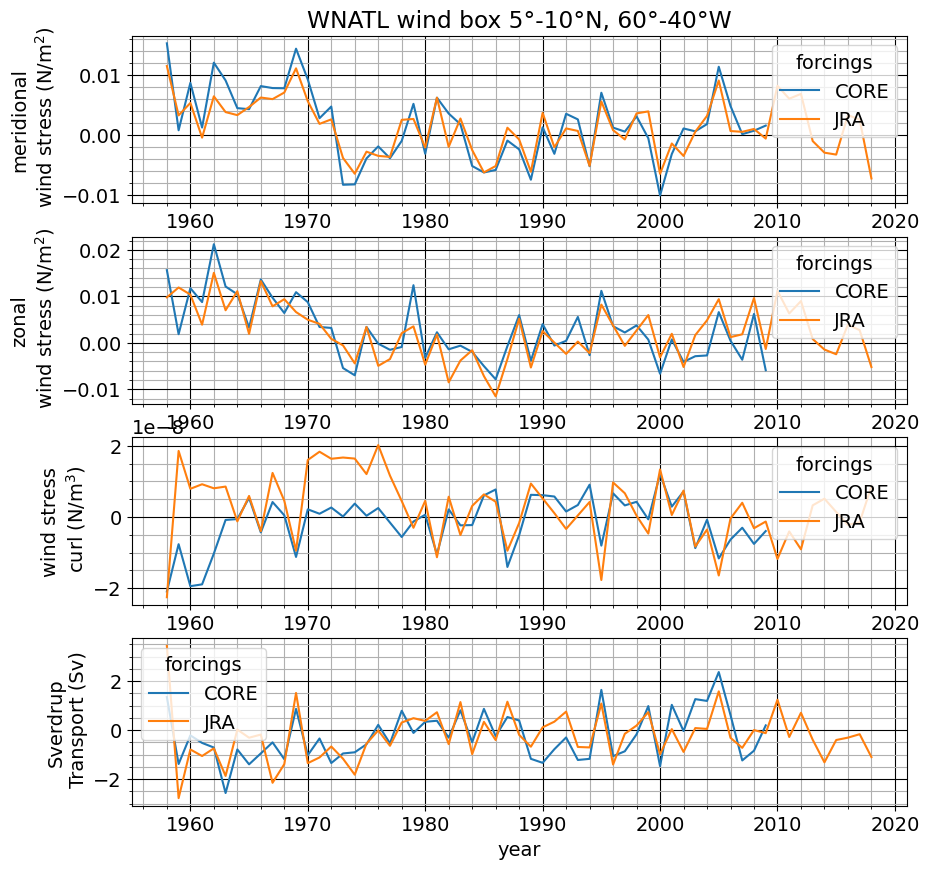

In [79]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=5,10,-60,-40
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'WNATL wind box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Current & Lon & JRA (sign. 95\%) & CORE (sign. 95\%)\\
		&&Sv/dec&Sv/dec\\
		\middlehline
		EUC  & 35$^{\circ}$W-0$^{\circ}$ & -1.0 (True) & -0.4 (True) \\
		NEUC & 42$^{\circ}$W-17$^{\circ}$W & 0.1 (False) & 0.7 (True) \\
		SEUC & 30$^{\circ}$W-10$^{\circ}$W & 0.4 (True) & 0.3 (True) \\
		NECC & 42$^{\circ}$W-17$^{\circ}$W & -0.6 (True) & 0.2 (True) \\
		nSECu & 35$^{\circ}$W-10$^{\circ}$W  & 0.1 (False) & 0.2 (True) \\
		nSECl  & 35$^{\circ}$W-10$^{\circ}$W & 0.1 (True) & -0.2 (True) \\
		\middlehline
		EUC & 15$^{\circ}$W & -1.5 (True) & -0.8 (True) \\
		NEUC & 17$^{\circ}$W & -0.6 (True) & 0.2 (True) \\
		SEUC & 15$^{\circ}$W & -0.1 (False) & 0.2 (True) \\
		NECC & 17$^{\circ}$W & -0.3 (True) & 0.1 (True) \\
		nSECu & 15$^{\circ}$W & -0.1 (False) & 0.3 (False) \\
		nSECl & 15$^{\circ}$W & 0.2 (True) & 0.2 (True ) \\
		\middlehline
		EUC & 25$^{\circ}$W & -1.3 (True) & -0.3 (True) \\
		NEUC & 25$^{\circ}$W & -0.3 (True) & 0.7 (True) \\
		SEUC & 25$^{\circ}$W & 0.5 (True) & 0.4 (True) \\
		NECC & 25$^{\circ}$W & -0.5 (True) & 0.3 (True) \\
		nSECu & 25$^{\circ}$W & 0.2 (True) & 0.2 (False) \\
		nSECl & 25$^{\circ}$W & 0.4 (True) & -0.3 (False) \\
		\middlehline
		EUC & 35$^{\circ}$W & -0.7 (True) & -0.4 (True) \\
		NEUC & 35$^{\circ}$W & 0.6 (True) & 0.8 (True) \\
		SEUC & 30$^{\circ}$W & 0.6 (True) & 0.6 (True) \\
		NECC & 35$^{\circ}$W & -0.8 (True) & -0.1 (False) \\
		nSECu & 35$^{\circ}$W & 0.4 (True) & 0.5 (False) \\
		nSECl & 35$^{\circ}$W & -0.5 (True) & -0.7 (False) \\

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

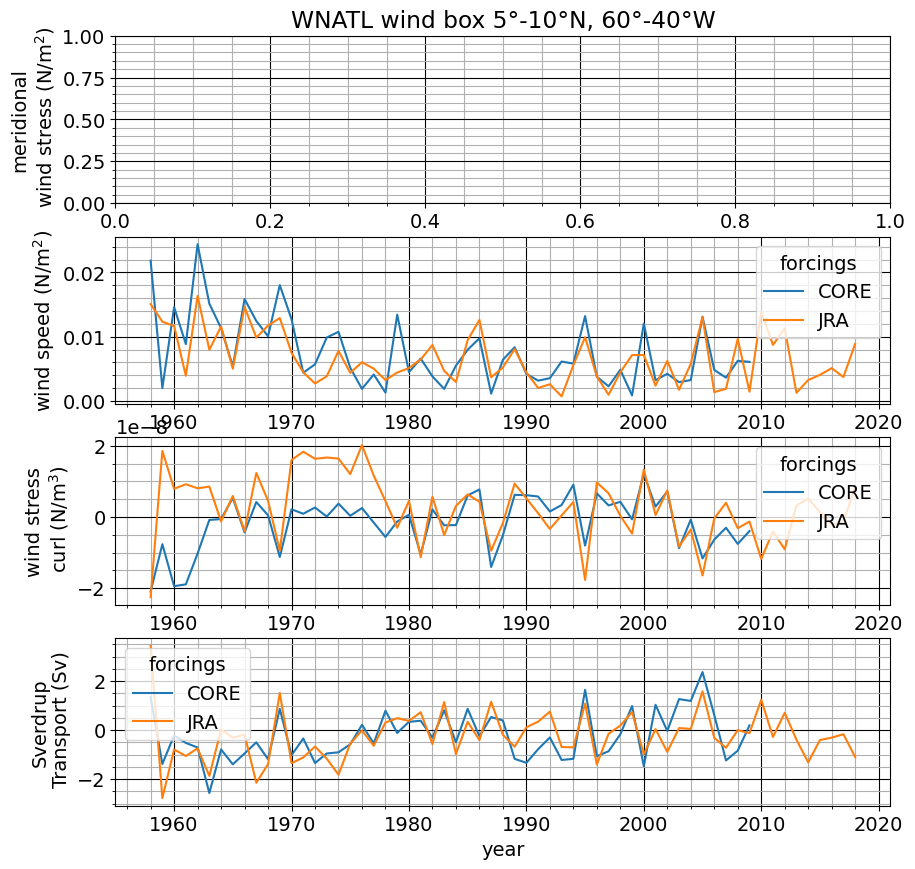

In [80]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=5,10,-60,-40
y = ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}) #.plot(ax=ax[0],hue='forcings')

x = ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}) #.plot(ax=ax[1],hue='forcings')

np.sqrt(x*x+y*y).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'WNATL wind box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('wind speed (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')


Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

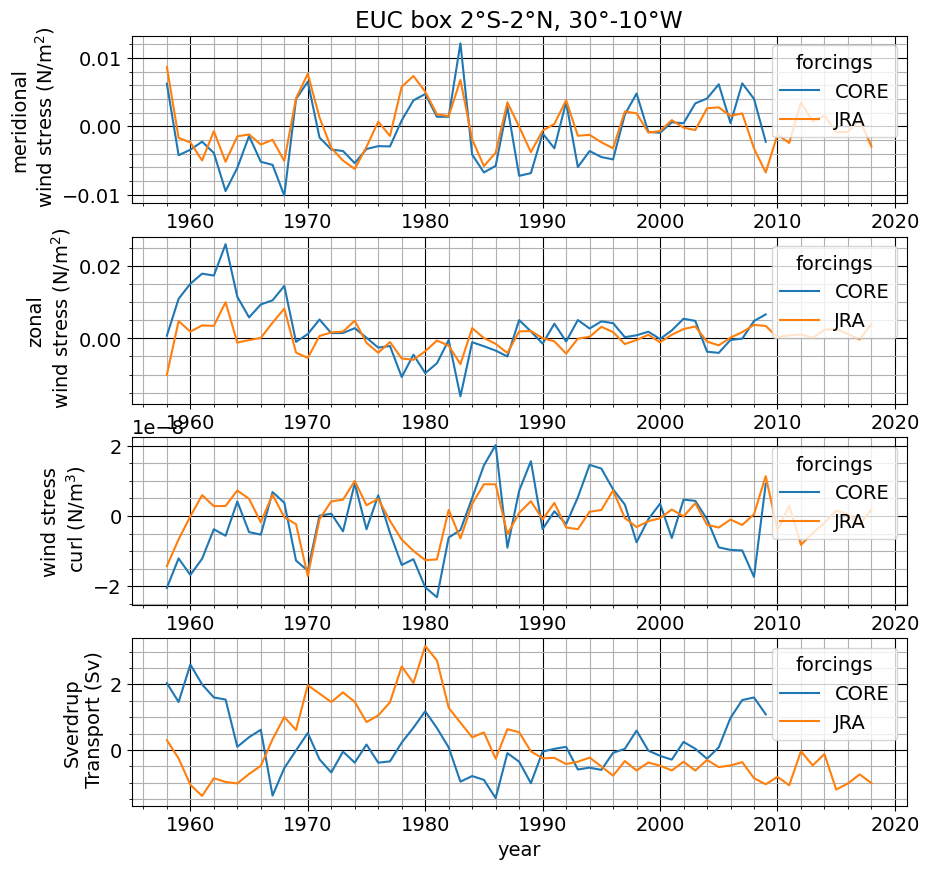

In [81]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=-2,2,-30,-10
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'EUC box {abs(lat1)}°S-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

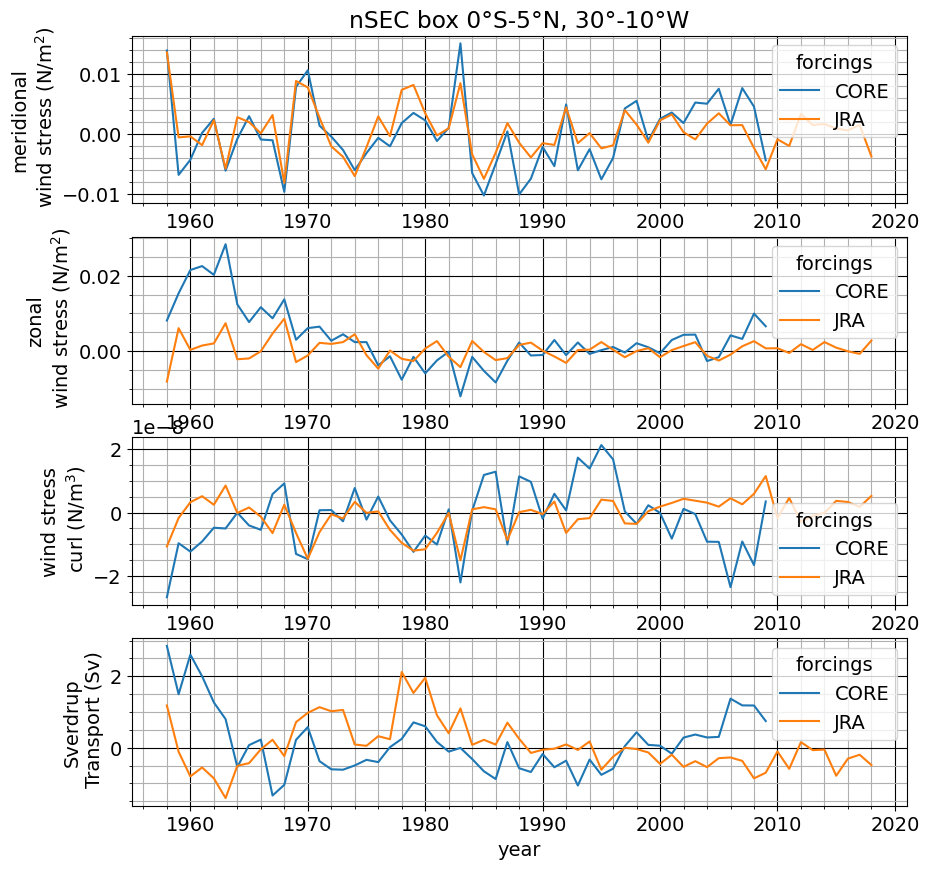

In [82]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=0,5,-30,-10
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'nSEC box {abs(lat1)}°S-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

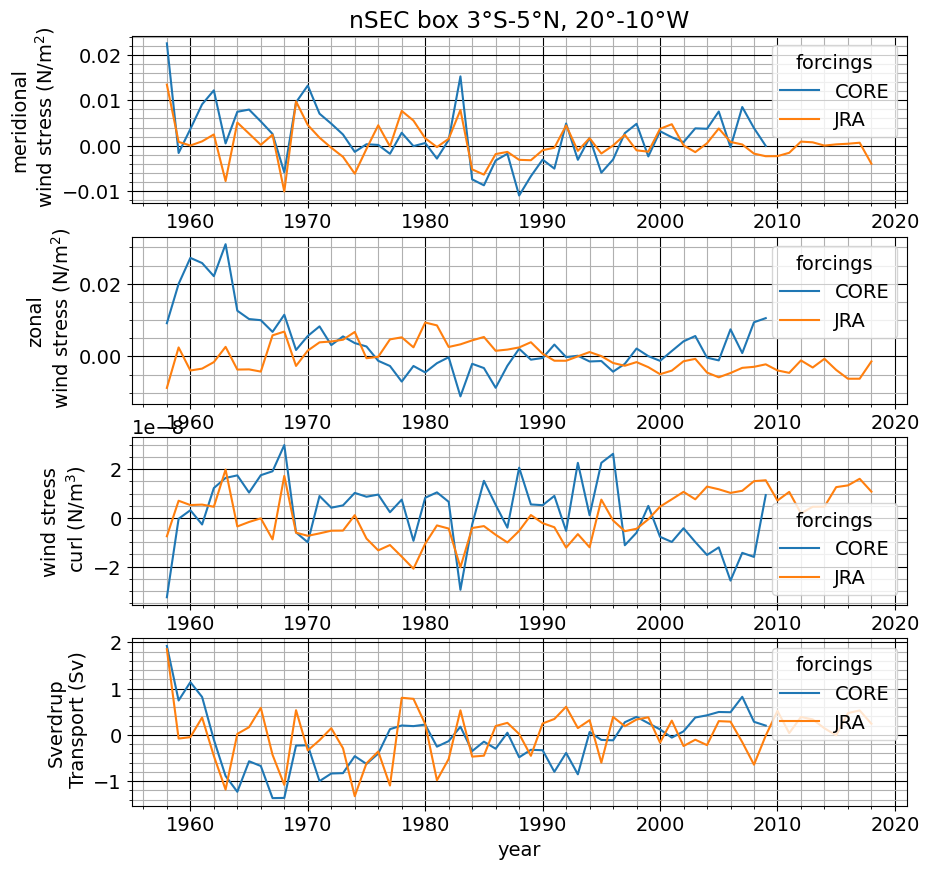

In [83]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=3,5,-20,-10
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'nSEC box {abs(lat1)}°S-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

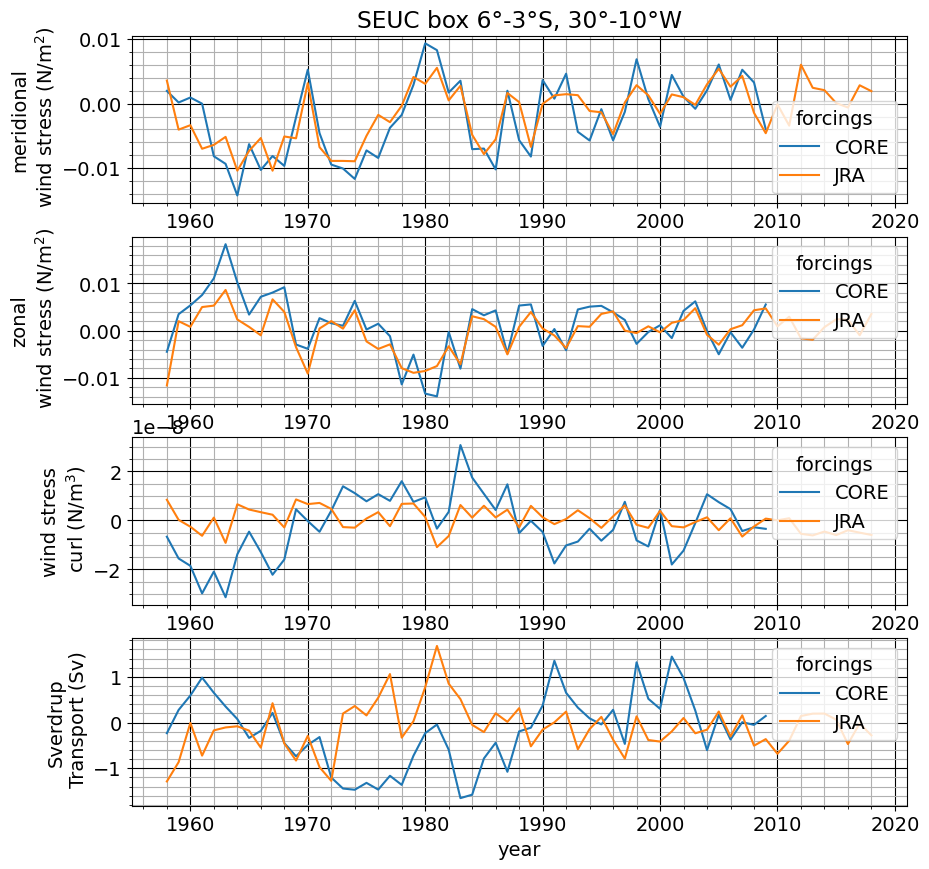

In [84]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=-6,-3,-30,-10
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'SEUC box {abs(lat1)}°-{abs(lat2)}°S, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

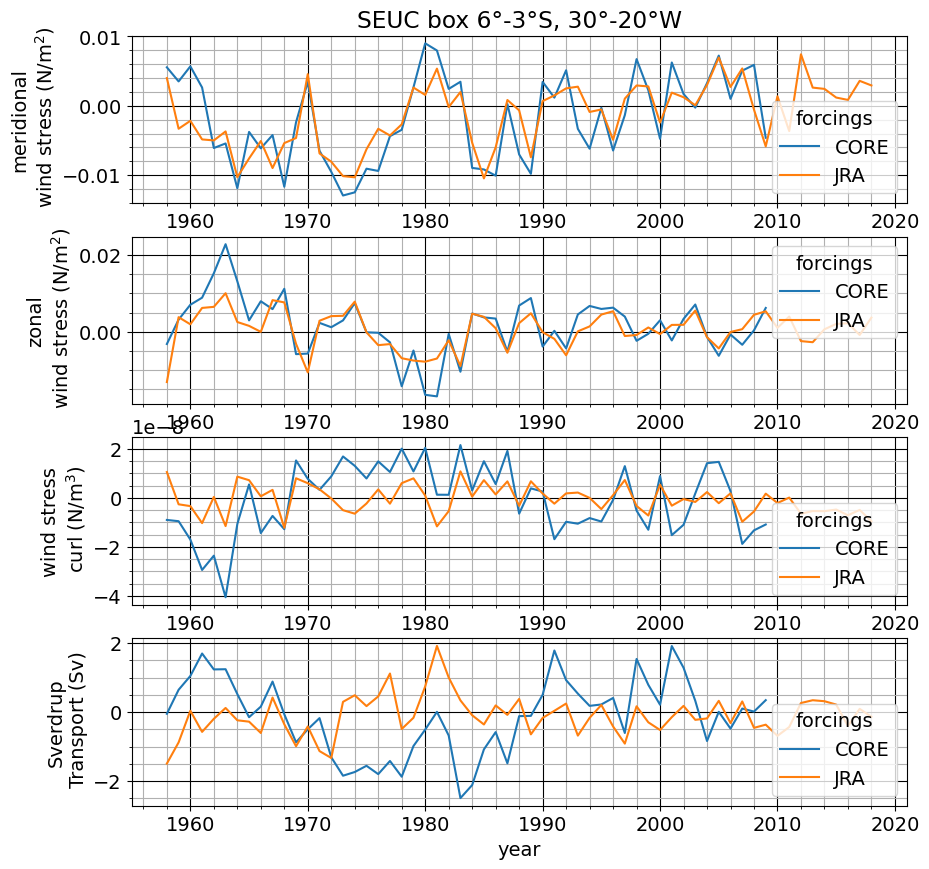

In [85]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=-6,-3,-30,-20
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'SEUC box {abs(lat1)}°-{abs(lat2)}°S, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

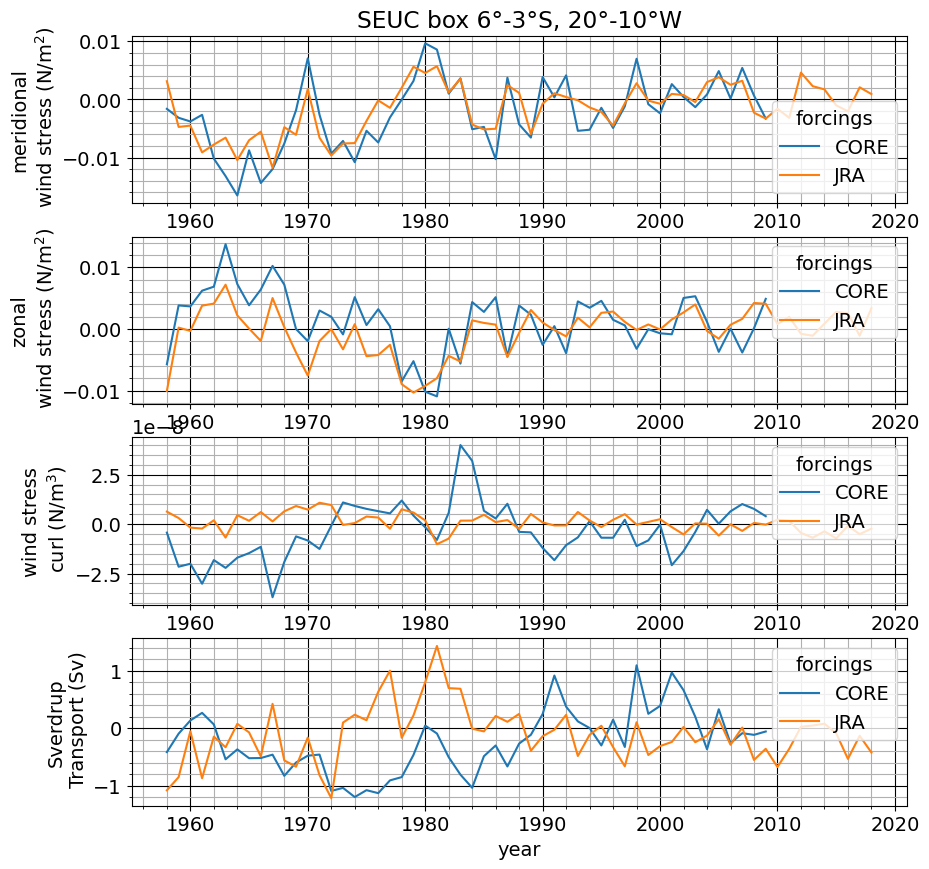

In [86]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=-6,-3,-20,-10
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'SEUC box {abs(lat1)}°-{abs(lat2)}°S, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

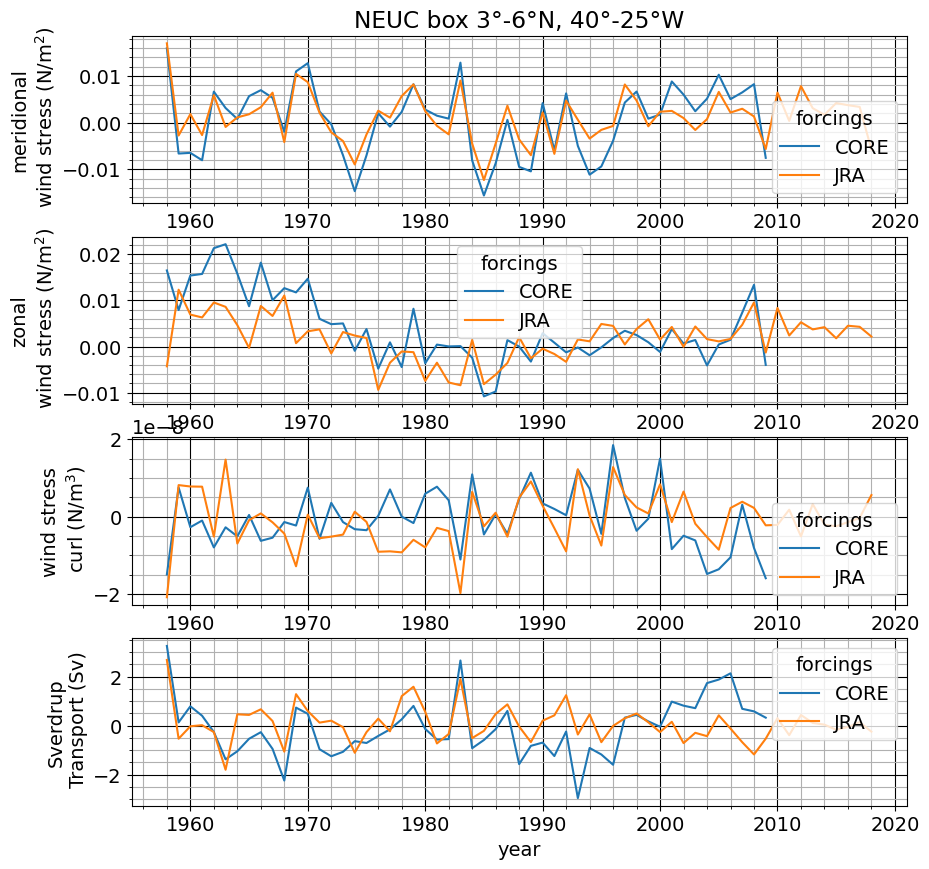

In [87]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=3,6,-40,-25
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'NEUC box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

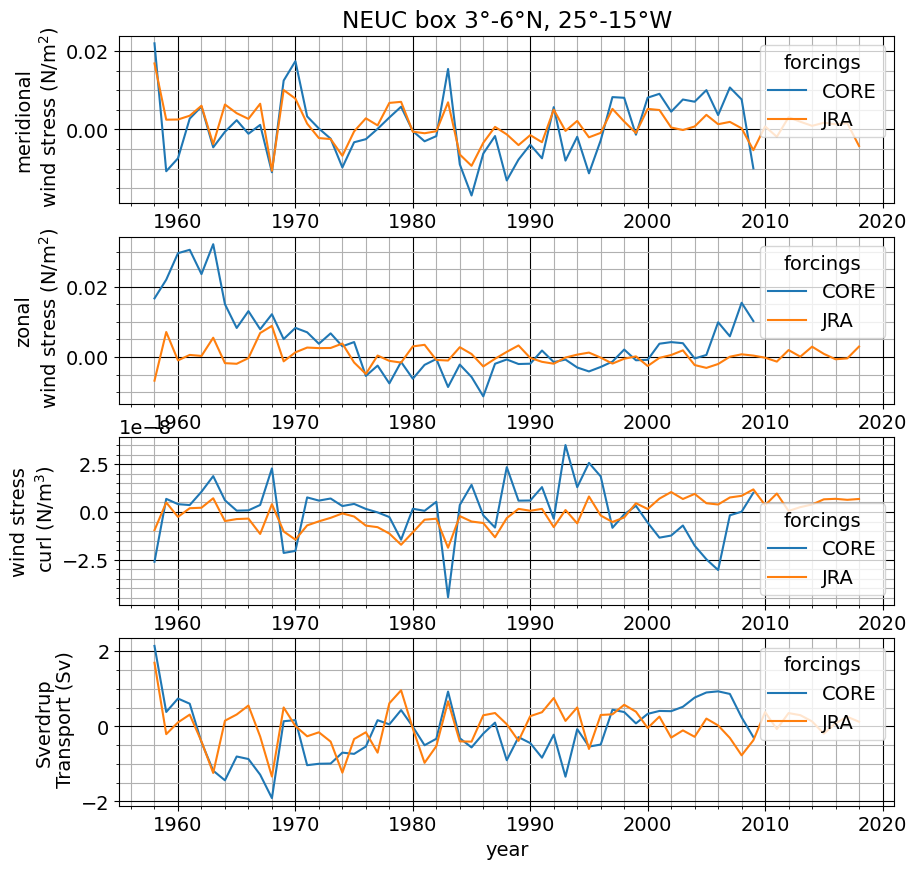

In [88]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=3,6,-25,-15
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'NEUC box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

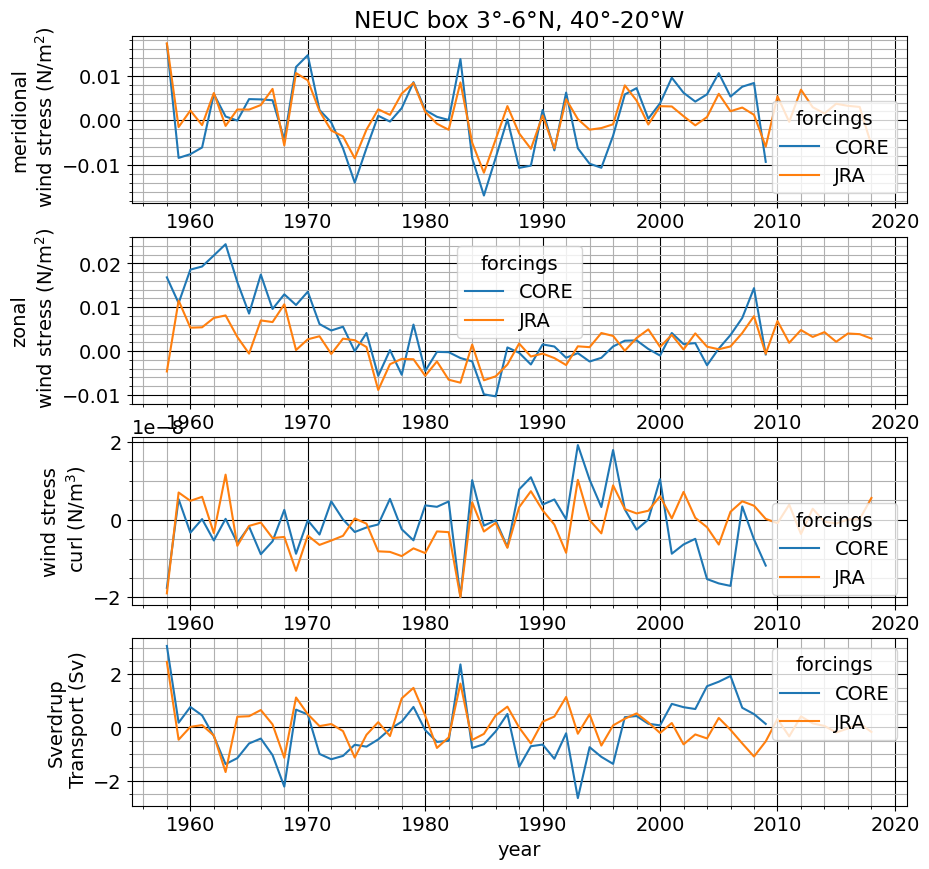

In [89]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=3,6,-40,-20
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'NEUC box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

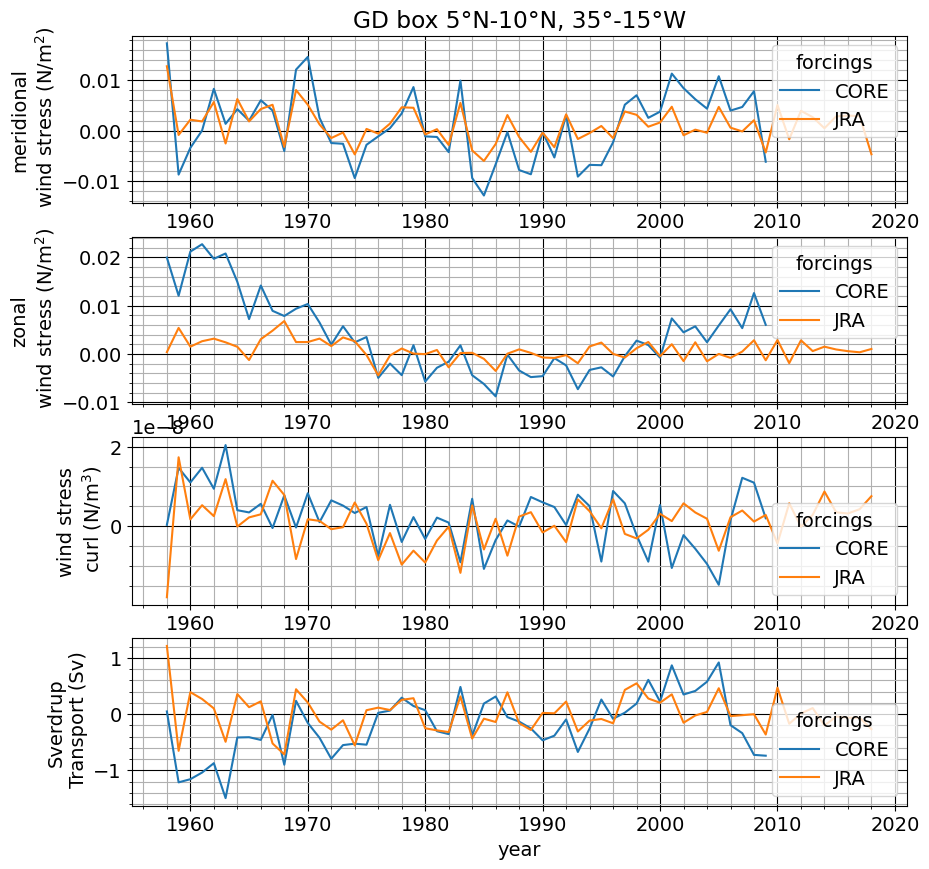

In [90]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=5,10,-35,-15
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'GD box {abs(lat1)}°N-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

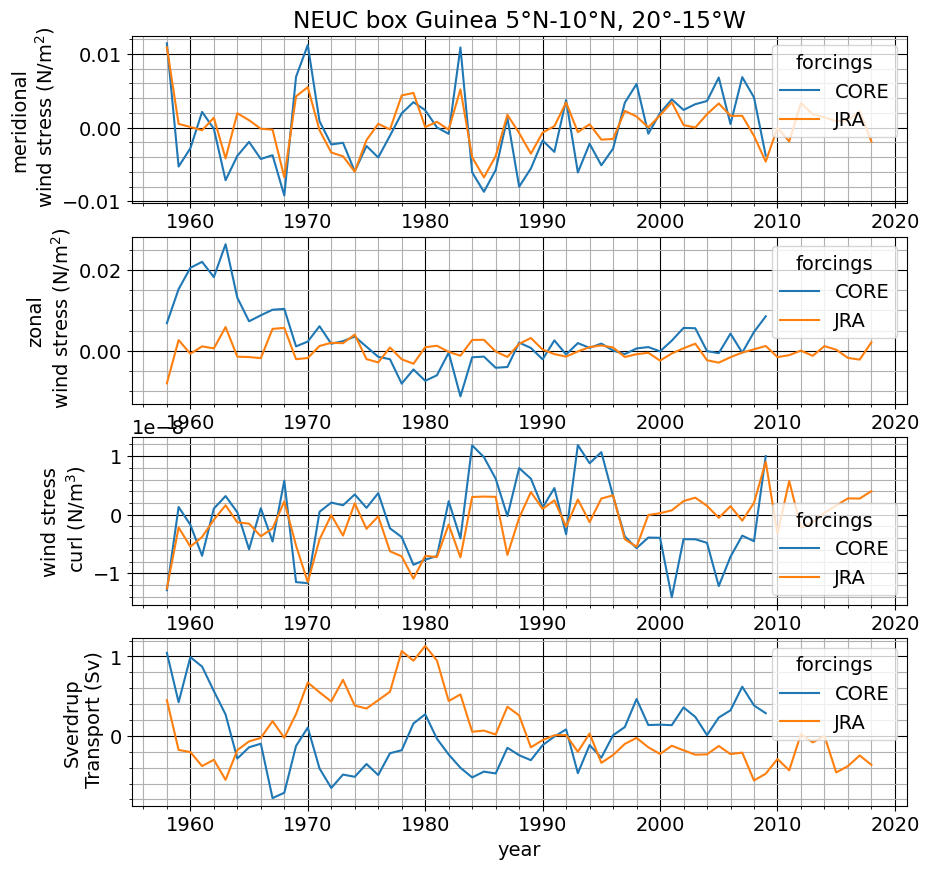

In [91]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=-5,10,-20,-15
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'NEUC box Guinea {abs(lat1)}°N-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional\n wind stress (N/m$^2$)')
ax[1].set_ylabel('zonal\n wind stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

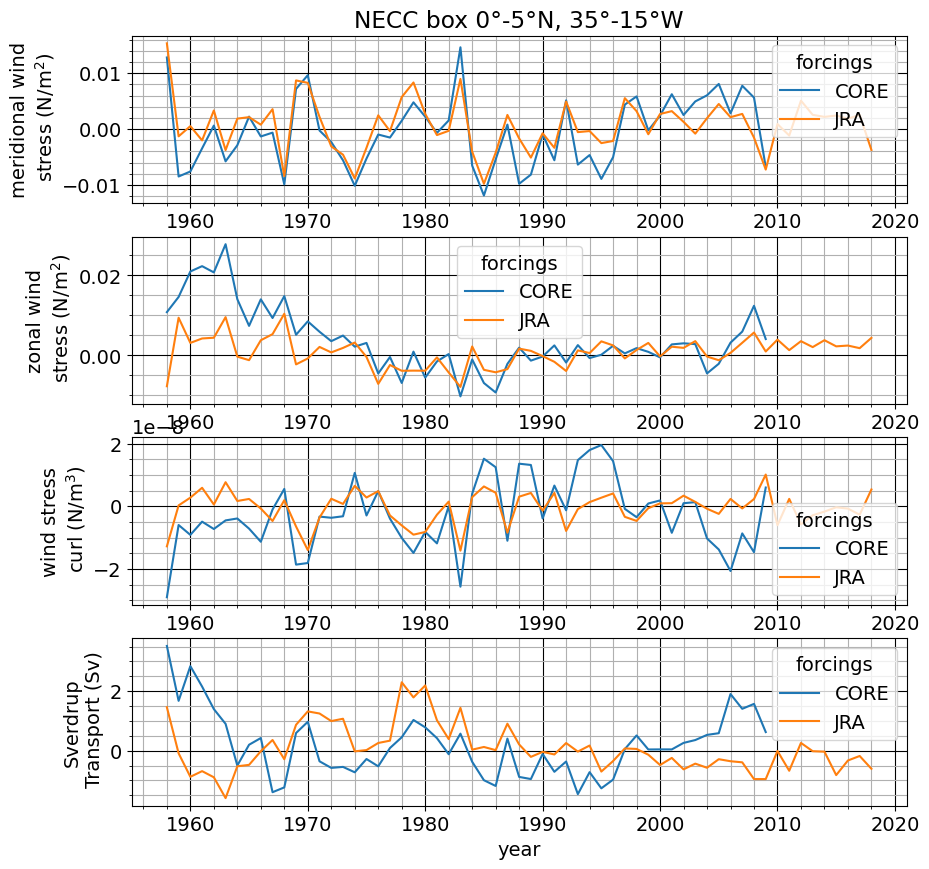

In [92]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=0,5,-35,-15
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'NECC box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional wind\n stress (N/m$^2$)')
ax[1].set_ylabel('zonal wind\n stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')
# plt.tight_layout()

Text(0, 0.5, 'Sverdrup\n Transport (Sv)')

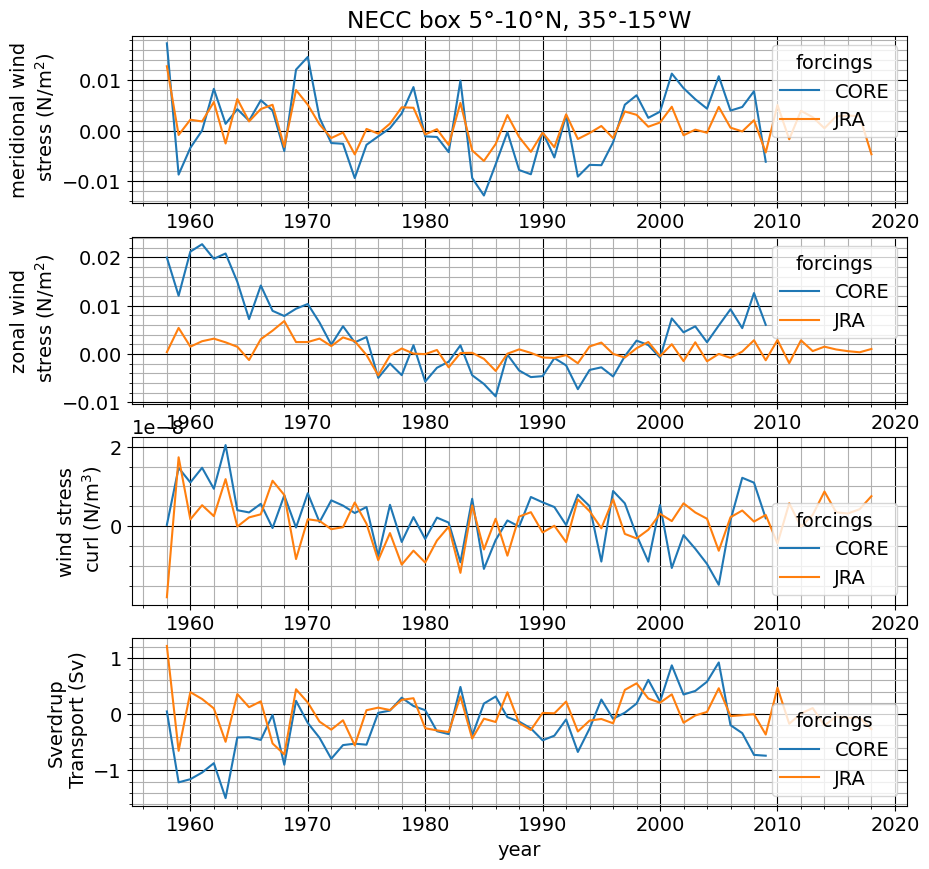

In [93]:
fig,ax = plt.subplots(4,1,figsize=(10,10))
lat1,lat2,lon1,lon2=5,10,-35,-15
ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[0],hue='forcings')

ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[1],hue='forcings')

ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[2],hue='forcings')

T_sv_A.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2)).mean({'lat','lon'}).plot(ax=ax[3],hue='forcings')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    ax[0].set_title(f'NECC box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')
ax[0].set_ylabel('meridional wind\n stress (N/m$^2$)')
ax[1].set_ylabel('zonal wind\n stress (N/m$^2$)')
ax[2].set_ylabel('wind stress\n curl (N/m$^3$)')
ax[3].set_ylabel('Sverdrup\n Transport (Sv)')
# plt.tight_layout()

# Correlations

In [94]:
tlim_min_J,tlim_max_J = '1980','2009' #'2000','2018'
tlim_min_C,tlim_max_C = '1980','2009' #'1991','2019'
NECC_JRA_cyc = NECC_JRA.sel(time_counter=slice(tlim_min_J,tlim_max_J)).groupby(
        'time_counter.dayofyear').mean(dim='time_counter').compute()
NECC_CORE_cyc = NECC_CORE.sel(time_counter=slice(tlim_min_C,tlim_max_C)).groupby(
    'time_counter.dayofyear').mean(dim='time_counter').compute()

nSECu_JRA_cyc = nSECu_JRA.sel(time_counter=slice(tlim_min_J,tlim_max_J)).groupby(
        'time_counter.dayofyear').mean(dim='time_counter').compute()
nSECu_CORE_cyc = nSECu_CORE.sel(time_counter=slice(tlim_min_C,tlim_max_C)).groupby(
    'time_counter.dayofyear').mean(dim='time_counter').compute()

In [95]:
nSECl_JRA_cyc = nSECl_JRA.sel(time_counter=slice(tlim_min_J,tlim_max_J)).groupby(
        'time_counter.dayofyear').mean(dim='time_counter').compute()
nSECl_CORE_cyc = nSECl_CORE.sel(time_counter=slice(tlim_min_C,tlim_max_C)).groupby(
    'time_counter.dayofyear').mean(dim='time_counter').compute()

In [96]:
NECC_JRA_A = NECC_JRA.groupby('time_counter.dayofyear') - NECC_JRA_cyc
NECC_CORE_A = NECC_CORE.groupby('time_counter.dayofyear') - NECC_CORE_cyc
nSECu_JRA_A = nSECu_JRA.groupby('time_counter.dayofyear') - nSECu_JRA_cyc
nSECu_CORE_A = nSECu_CORE.groupby('time_counter.dayofyear') - nSECu_CORE_cyc

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 61 times more chunks
  return self.array[key]
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 52 times more chunks
  return self.array[key]
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 61 times more chunks
  return self.array[key]
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 52 times more chunks
  return self.array[key]


In [97]:
nSECl_JRA_A = nSECl_JRA.groupby('time_counter.dayofyear') - nSECl_JRA_cyc
nSECl_CORE_A = nSECl_CORE.groupby('time_counter.dayofyear') - nSECl_CORE_cyc

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 61 times more chunks
  return self.array[key]
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 52 times more chunks
  return self.array[key]


In [98]:
NECC_JRA_am = NECC_JRA_A.groupby('time_counter.year').mean('time_counter').compute()
NECC_CORE_am = NECC_CORE_A.groupby('time_counter.year').mean('time_counter').compute()

nSECu_JRA_am = nSECu_JRA_A.groupby('time_counter.year').mean('time_counter').compute()
nSECu_CORE_am = nSECu_CORE_A.groupby('time_counter.year').mean('time_counter').compute()

/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/distributed/client.py:3163: UserWarning: Sending large graph of size 9.73 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(
2024-01-26 15:22:31,168 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:22:35,388 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:22:40,046 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:22:45,171 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:22:51,198 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:22:57,959 - distributed.utils_perf - WARNING - full garbage collections took 

In [99]:
nSECl_JRA_am = nSECl_JRA_A.groupby('time_counter.year').mean('time_counter').compute()
nSECl_CORE_am = nSECl_CORE_A.groupby('time_counter.year').mean('time_counter').compute()

2024-01-26 15:27:09,112 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:27:13,624 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:27:18,866 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:27:33,686 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:27:35,175 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:27:36,742 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:27:38,575 - distributed.utils_perf - WARNING - full garbage collections took 10% CPU time recently (threshold: 10%)
2024-01-26 15:27:40,618 - distributed.utils_perf - WARNING - full garbage collections took

In [100]:
tlim_min_J,tlim_max_J = '1980','2009' #'2000','2018'
tlim_min_C,tlim_max_C = '1980','2009' #'1991','2019'
NEUC_JRA_cyc = NEUC_JRA.sel(time_counter=slice(tlim_min_J,tlim_max_J)).groupby(
        'time_counter.dayofyear').mean(dim='time_counter').compute()
NEUC_CORE_cyc = NEUC_CORE.sel(time_counter=slice(tlim_min_C,tlim_max_C)).groupby(
    'time_counter.dayofyear').mean(dim='time_counter').compute()

NEUC_JRA_A = NEUC_JRA.groupby('time_counter.dayofyear') - NEUC_JRA_cyc
NEUC_CORE_A = NEUC_CORE.groupby('time_counter.dayofyear') - NEUC_CORE_cyc

NEUC_JRA_am = NEUC_JRA_A.groupby('time_counter.year').mean('time_counter').compute()
NEUC_CORE_am = NEUC_CORE_A.groupby('time_counter.year').mean('time_counter').compute()

2024-01-26 15:28:18,598 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:28:20,129 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:28:21,575 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:28:23,374 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:28:25,748 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:28:28,204 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:28:35,249 - distributed.utils_perf - WARNING - full garbage collections took 11% CPU time recently (threshold: 10%)
2024-01-26 15:28:36,855 - distributed.utils_perf - WARNING - full garbage collections took

In [101]:
SEUC_JRA_cyc = SEUC_JRA.sel(time_counter=slice(tlim_min_J,tlim_max_J)).groupby(
        'time_counter.dayofyear').mean(dim='time_counter').compute()
SEUC_CORE_cyc = SEUC_CORE.sel(time_counter=slice(tlim_min_C,tlim_max_C)).groupby(
    'time_counter.dayofyear').mean(dim='time_counter').compute()

SEUC_JRA_A = SEUC_JRA.groupby('time_counter.dayofyear') - SEUC_JRA_cyc
SEUC_CORE_A = SEUC_CORE.groupby('time_counter.dayofyear') - SEUC_CORE_cyc

SEUC_JRA_am = SEUC_JRA_A.groupby('time_counter.year').mean('time_counter').compute()
SEUC_CORE_am = SEUC_CORE_A.groupby('time_counter.year').mean('time_counter').compute()

2024-01-26 15:31:24,488 - distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)
2024-01-26 15:31:31,652 - distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 61 times more chunks
  return self.array[key]
/gxfs_work/geomar/smomw294/.conda/envs/py3_std/lib/python3.9/site-packages/xarray/core/indexing.py:1446: PerformanceWarning: Slicing with an out-of-order index is generating 52 times more chunks
  return self.array[key]
2024-01-26 15:31:48,375 - distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
2024-01-26 15:31:50,348 - distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
2024-01-26 15:31:52,324 - distributed.ut

In [102]:
tlim=[1958,2018]

In [103]:
SEUC_INT_JRA = SEUC_JRA_am.INT.sel(year=slice(*tlim)).mean('lon')
SEUC_INT_CORE = SEUC_CORE_am.INT.sel(year=slice(tlim[0],2009)).mean('lon')

In [104]:
NEUC_INT_JRA = NEUC_JRA_am.INT.sel(year=slice(*tlim)).mean('lon')
NEUC_INT_CORE = NEUC_CORE_am.INT.sel(year=slice(tlim[0],2009)).mean('lon')

In [105]:
NECC_INT_JRA = NECC_JRA_am.INT.sel(year=slice(*tlim)).mean('lon')
NECC_INT_CORE = NECC_CORE_am.INT.sel(year=slice(tlim[0],2009)).mean('lon')
nSECu_INT_JRA = nSECu_JRA_am.INT.sel(year=slice(*tlim)).mean('lon')
nSECu_INT_CORE = nSECu_CORE_am.INT.sel(year=slice(tlim[0],2009)).mean('lon')

In [106]:
nSECl_INT_JRA = nSECl_JRA_am.INT.sel(year=slice(*tlim)).mean('lon')
nSECl_INT_CORE = nSECl_CORE_am.INT.sel(year=slice(tlim[0],2009)).mean('lon')

In [107]:
lat1,lat2,lon1,lon2=0,5,-35,-15
tauy_JRA = ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(*tlim)).mean({'lat','lon'}
                    ).sel(forcings='JRA')
tauy_CORE = ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(tlim[0],2009)).mean({'lat','lon'}
                    ).sel(forcings='CORE')

In [108]:
taux_JRA = ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(*tlim)).mean({'lat','lon'}
                    ).sel(forcings='JRA')
taux_CORE = ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(tlim[0],2009)).mean({'lat','lon'}
                    ).sel(forcings='CORE')

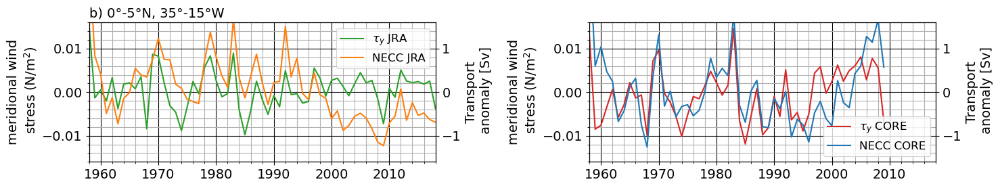

In [109]:
fig,ax = plt.subplots(1,2,figsize=(15,3))

lat1,lat2,lon1,lon2=0,5,-35,-15

lns1 = tauy_JRA.plot(ax=ax[0],label=r'$\tau_y$ JRA',color='C2')
lns3 = tauy_CORE.plot(ax=ax[1],label=r'$\tau_y$ CORE',color='C3')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    a.set_ylim([-.016,.016])
    a.set_xlim([*tlim])
    a.set_xlabel('')
    a.set_title('')
    a.set_ylabel('meridional wind\n stress (N/m$^2$)')
ax[0].set_title(f'b) {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W',loc='left',fontsize=14)



add_ax = ax[0].twinx()
lns2 = NECC_INT_JRA.plot(ax=add_ax,label='NECC JRA',color='C1')
# lns5 = nSECu_INT_JRA.plot(ax=add_ax,label='nSECu JRA',color='C4')
add_ax.set_ylim([-1.6,1.6])
add_ax.set_ylabel('Transport\n anomaly [Sv]')
lns = lns1+lns2
labs = [l.get_label() for l in lns]
ax[0].legend(lns, labs,loc=1,prop={'size': 12})

add_ax = ax[1].twinx()
lns4 = NECC_INT_CORE.plot(ax=add_ax,label='NECC CORE',color='C0')
# lns6 = nSECu_INT_CORE.plot(ax=add_ax,label='nSECu CORE',color='C4')
add_ax.set_ylim([-1.6,1.6])
add_ax.set_ylabel('Transport\n anomaly [Sv]')
lns = lns3+lns4
labs = [l.get_label() for l in lns]
ax[1].legend(lns, labs,loc=4,prop={'size': 12})
plt.tight_layout()
plt.savefig(out_dir+f'INALT20_JRA_CORE_NECC_tauy_{tlim[0]}_{tlim[1]}'+fig_format,dpi=300,bbox_inches='tight')
# plt.savefig(out_dir+f'INALT20_JRA_CORE_NECC_nSECu_tauy_{tlim[0]}_{tlim[1]}'+fig_format,dpi=300)

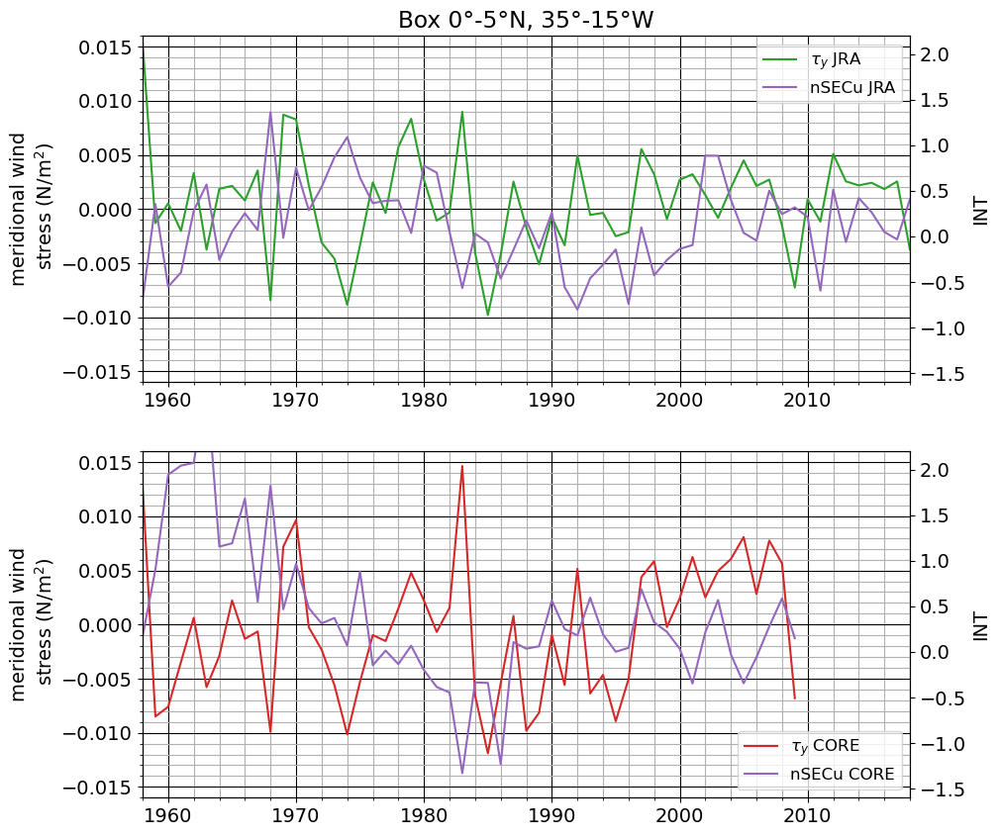

In [110]:
fig,ax = plt.subplots(2,1,figsize=(10,10))

lat1,lat2,lon1,lon2=0,5,-35,-15


lns1 = tauy_JRA.plot(ax=ax[0],label=r'$\tau_y$ JRA',color='C2')
lns3 = tauy_CORE.plot(ax=ax[1],label=r'$\tau_y$ CORE',color='C3')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    a.set_ylim([-.016,.016])
    a.set_xlim([*tlim])
    a.set_xlabel('')
    a.set_title('')
    a.set_ylabel('meridional wind\n stress (N/m$^2$)')
ax[0].set_title(f'Box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')



add_ax = ax[0].twinx()
# lns2 = NECC_INT_JRA.plot(ax=add_ax,label='NECC JRA',color='C1')
lns5 = nSECu_INT_JRA.plot(ax=add_ax,label='nSECu JRA',color='C4')
add_ax.set_ylim([-1.6,2.2])
lns = lns1+lns5
labs = [l.get_label() for l in lns]
ax[0].legend(lns, labs,loc=1,prop={'size': 12})

add_ax = ax[1].twinx()
# lns4 = NECC_INT_CORE.plot(ax=add_ax,label='NECC CORE',color='C0')
lns6 = nSECu_INT_CORE.plot(ax=add_ax,label='nSECu CORE',color='C4')
add_ax.set_ylim([-1.6,2.2])
lns = lns3+lns6
labs = [l.get_label() for l in lns]
ax[1].legend(lns, labs,loc=4,prop={'size': 12})

plt.savefig(out_dir+f'INALT20_JRA_CORE_nSECu_tauy_{tlim[0]}_{tlim[1]}'+fig_format,dpi=300,bbox_inches='tight')

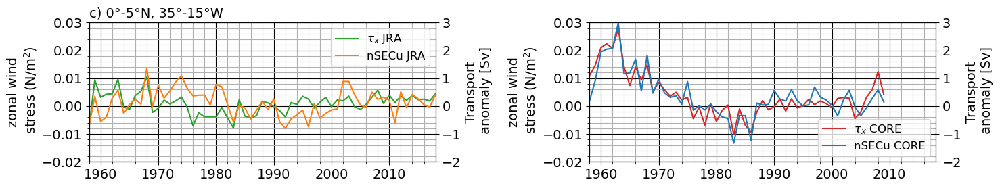

In [111]:
fig,ax = plt.subplots(1,2,figsize=(15,3))

lat1,lat2,lon1,lon2=0,5,-35,-15

lns1 = taux_JRA.plot(ax=ax[0],label=r'$\tau_x$ JRA',color='C2')
lns3 = taux_CORE.plot(ax=ax[1],label=r'$\tau_x$ CORE',color='C3')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    a.set_ylim([-.02,.03])
    a.set_xlim([*tlim])
    a.set_xlabel('')
    a.set_title('')
    a.set_ylabel('zonal wind\n stress (N/m$^2$)')
ax[0].set_title(f'c) {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W',loc='left',fontsize=14)



add_ax = ax[0].twinx()
# lns2 = NECC_INT_JRA.plot(ax=add_ax,label='NECC JRA',color='C1')
lns5 = nSECu_INT_JRA.plot(ax=add_ax,label='nSECu JRA',color='C1')
add_ax.set_ylim([-2,3])
add_ax.set_ylabel('Transport\n anomaly [Sv]')
lns = lns1+lns5
labs = [l.get_label() for l in lns]
ax[0].legend(lns, labs,loc=1,prop={'size': 12})

add_ax = ax[1].twinx()
# lns4 = NECC_INT_CORE.plot(ax=add_ax,label='NECC CORE',color='C0')
lns6 = nSECu_INT_CORE.plot(ax=add_ax,label='nSECu CORE',color='C0')
add_ax.set_ylim([-2,3])
add_ax.set_ylabel('Transport\n anomaly [Sv]')
lns = lns3+lns6
labs = [l.get_label() for l in lns]
ax[1].legend(lns, labs,loc=4,prop={'size': 12})
plt.tight_layout()
plt.savefig(out_dir+f'INALT20_JRA_CORE_nSECu_taux_{tlim[0]}_{tlim[1]}'+fig_format,dpi=300,bbox_inches='tight')

In [112]:
def correlation(y1_ds,y2_ds):
    y1=y1_ds.values
    y2=y2_ds.values
    npts = len(y1_ds)
    lags = np.arange(-npts + 1, npts)
    ccov = np.correlate(y1 - y1.mean(), y2 - y2.mean(), mode='full')
    ccor = ccov / (npts * y1.std() * y2.std())

    fig, axs = plt.subplots(ncols=2,figsize=[20,3])
    fig.subplots_adjust(hspace=0.4)
    ax = axs[0]
    ax.plot(y1_ds.year, y1, 'b', label='y1')
    add_ax = axs[0].twinx()
    add_ax.plot(y2_ds.year, y2, 'r', label='y2')
    ax.set_ylim([-.03,.03])
    add_ax.set_ylim(-3, 3)
    ax.legend(loc='upper right', fontsize='small', ncol=2)
    ax.grid()

    ax = axs[1]
    ax.plot(lags, ccor)
    ax.set_ylim(-.5, 1)
    ax.set_ylabel('cross-correlation')
    ax.set_xlabel('lag of y1 relative to y2')
    ax.grid()

    maxlag = lags[np.argmax(np.abs(ccor))]
    print(f"max correlation {np.max(np.abs(ccor))} is at lag {maxlag}")
    print(f"correlation {ccor[int(npts-1)]} is at lag {lags[int(npts-1)]}")

max correlation 0.3719838264919934 is at lag -10
correlation -0.18175154579840302 is at lag 0


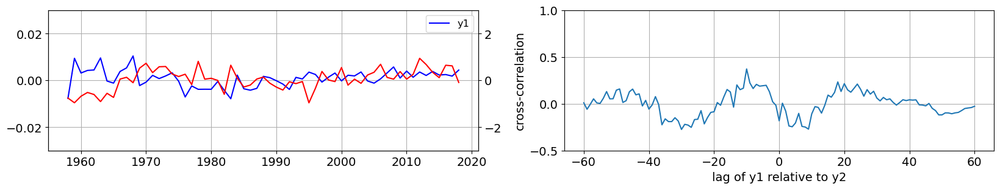

In [113]:
correlation(taux_JRA,nSECl_INT_JRA)

max correlation 0.5309892836330439 is at lag -15
correlation -0.2829240968768659 is at lag 0


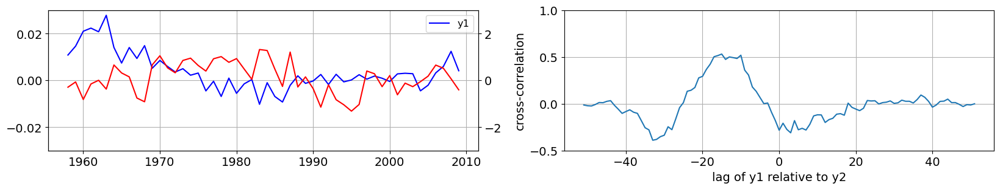

In [114]:
correlation(taux_CORE,nSECl_INT_CORE)

max correlation 0.44570680103496346 is at lag -7
correlation 0.35482907486942716 is at lag 0


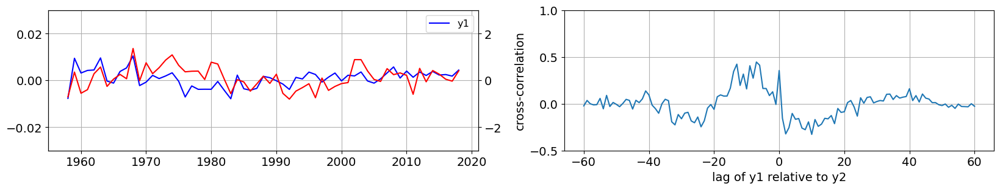

In [115]:
lat1,lat2,lon1,lon2=0,5,-35,-15
tlim=[1958,2018]
taux_JRA = ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(*tlim)).mean({'lat','lon'}
                    ).sel(forcings='JRA')
correlation(taux_JRA,nSECu_INT_JRA)

max correlation 0.9060309196622897 is at lag 0
correlation 0.9060309196622897 is at lag 0


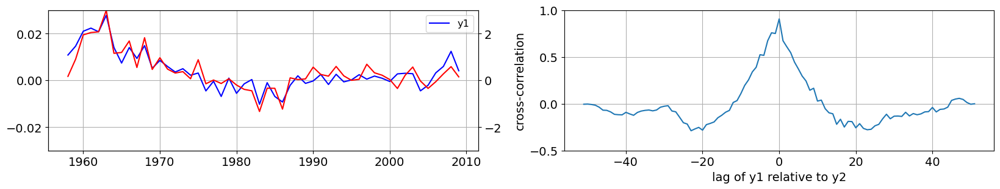

In [116]:
taux_CORE = ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(tlim[0],2009)).mean({'lat','lon'}
                    ).sel(forcings='CORE')
correlation(taux_CORE,nSECu_INT_CORE)

max correlation 0.6207067198140762 is at lag 0
correlation 0.6207067198140762 is at lag 0


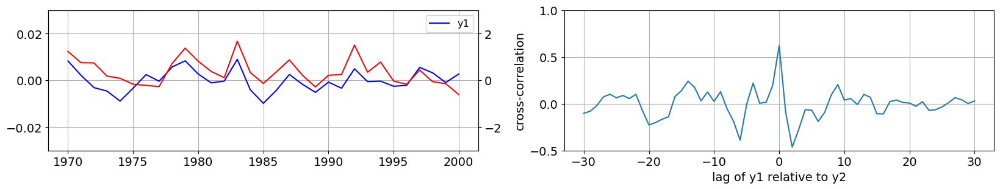

In [117]:
tlim=[1970,2000]
correlation(tauy_JRA.sel(year=slice(*tlim)),NECC_INT_JRA.sel(year=slice(*tlim)))

max correlation 0.7406868537351334 is at lag 0
correlation 0.7406868537351334 is at lag 0


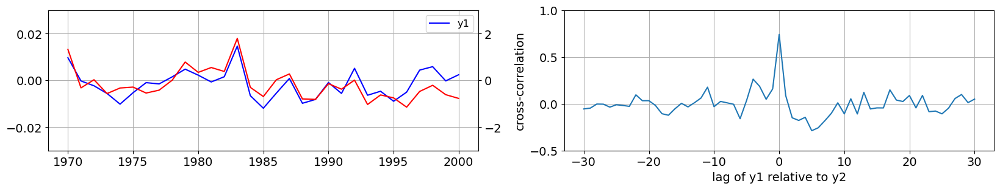

In [118]:
tlim=[1970,2000]
correlation(tauy_CORE.sel(year=slice(*tlim)),NECC_INT_CORE.sel(year=slice(*tlim)))

max correlation 0.4138021486518 is at lag -2
correlation 0.34084986022324615 is at lag 0
max correlation 0.6646340850118003 is at lag 0
correlation 0.6646340850118003 is at lag 0


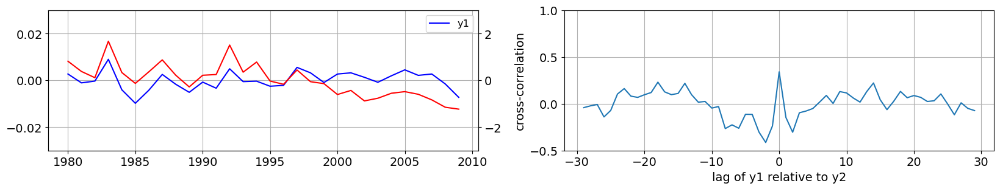

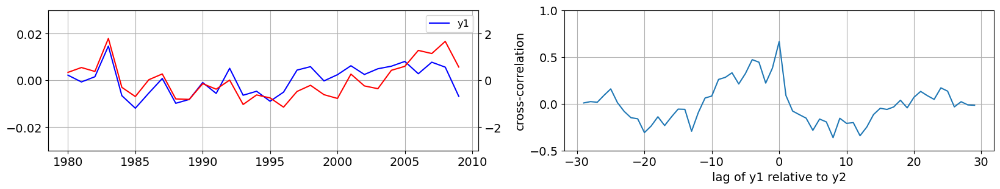

In [119]:
tlim=[1980,2009]
correlation(tauy_JRA.sel(year=slice(*tlim)),NECC_INT_JRA.sel(year=slice(*tlim)))
correlation(tauy_CORE.sel(year=slice(*tlim)),NECC_INT_CORE.sel(year=slice(*tlim)))

max correlation 0.8499133286110409 is at lag 0
correlation 0.8499133286110409 is at lag 0
max correlation 0.4669327894056278 is at lag 1
correlation 0.15689508695426257 is at lag 0


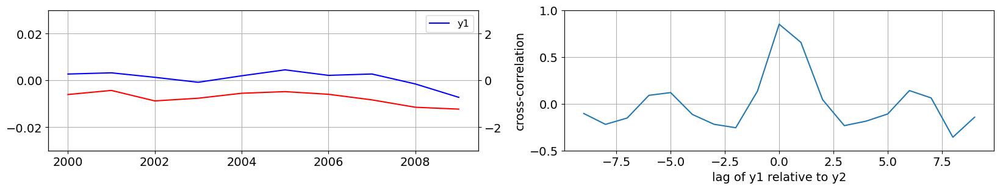

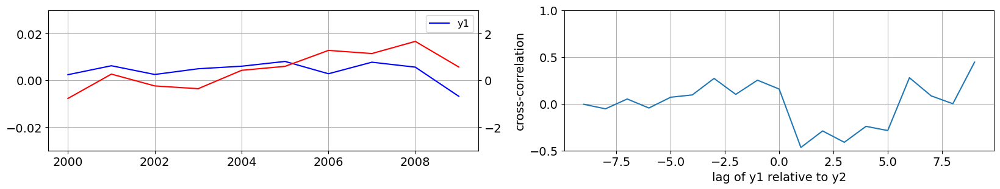

In [120]:
tlim=[2000,2009]
correlation(tauy_JRA.sel(year=slice(*tlim)),NECC_INT_JRA.sel(year=slice(*tlim)))
correlation(tauy_CORE.sel(year=slice(*tlim)),NECC_INT_CORE.sel(year=slice(*tlim)))

JRA pearsons R=0.593099081347657, p=0.004599481560858967
CORE pearsons R=0.7145314257063541, p=0.00027347246574362376


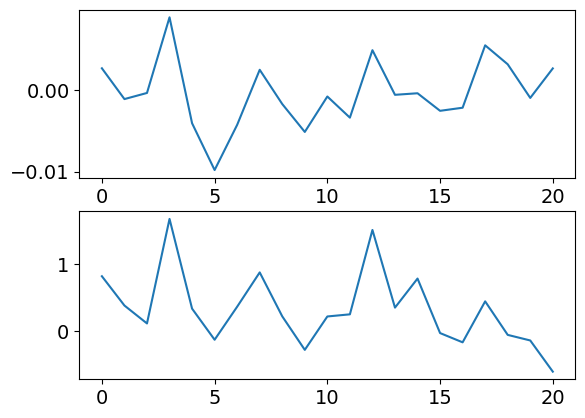

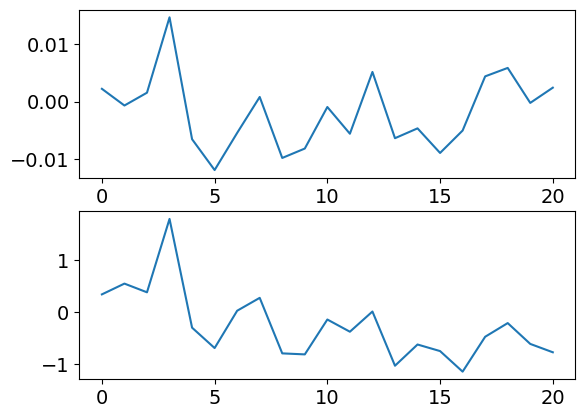

In [121]:
tlim=[1980,2000]
y,x = tauy_JRA.sel(year=slice(*tlim)).values,NECC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = tauy_CORE.sel(year=slice(*tlim)).values,NECC_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

JRA pearsons R=0.35334647772146327, p=0.010182953262963285
CORE pearsons R=0.90603091966229, p=2.6254837260769854e-20


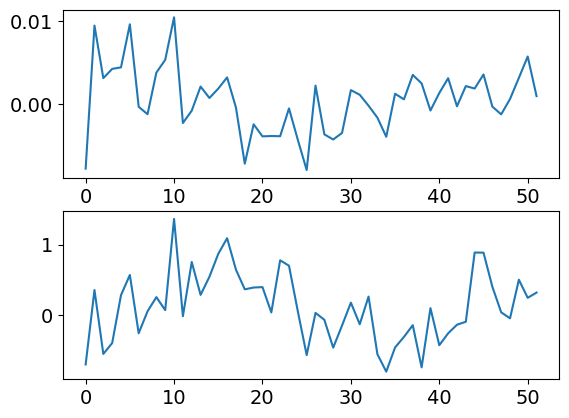

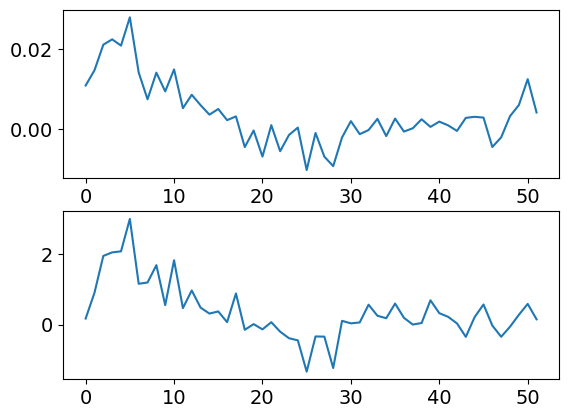

In [122]:
tlim=[1958,2009]
y,x = taux_JRA.sel(year=slice(*tlim)).values,nSECu_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = taux_CORE.sel(year=slice(*tlim)).values,nSECu_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

## Guinea Dome Box and NEUC

In [123]:
tlim=[1958,2018]
NEUC_INT_JRA = NEUC_JRA_am.INT.sel(year=slice(*tlim),lon=slice(None,None)).mean('lon')
NEUC_INT_CORE = NEUC_CORE_am.INT.sel(year=slice(tlim[0],2009),lon=slice(None,None)).mean('lon')

In [124]:
tlim=[1958,2018]
lat1,lat2,lon1,lon2=5,10,-35,-15

In [125]:
taux_JRA = ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(*tlim)).mean({'lat','lon'}
                    ).sel(forcings='JRA')
taux_CORE = ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(tlim[0],2009)).mean({'lat','lon'}
                    ).sel(forcings='CORE')

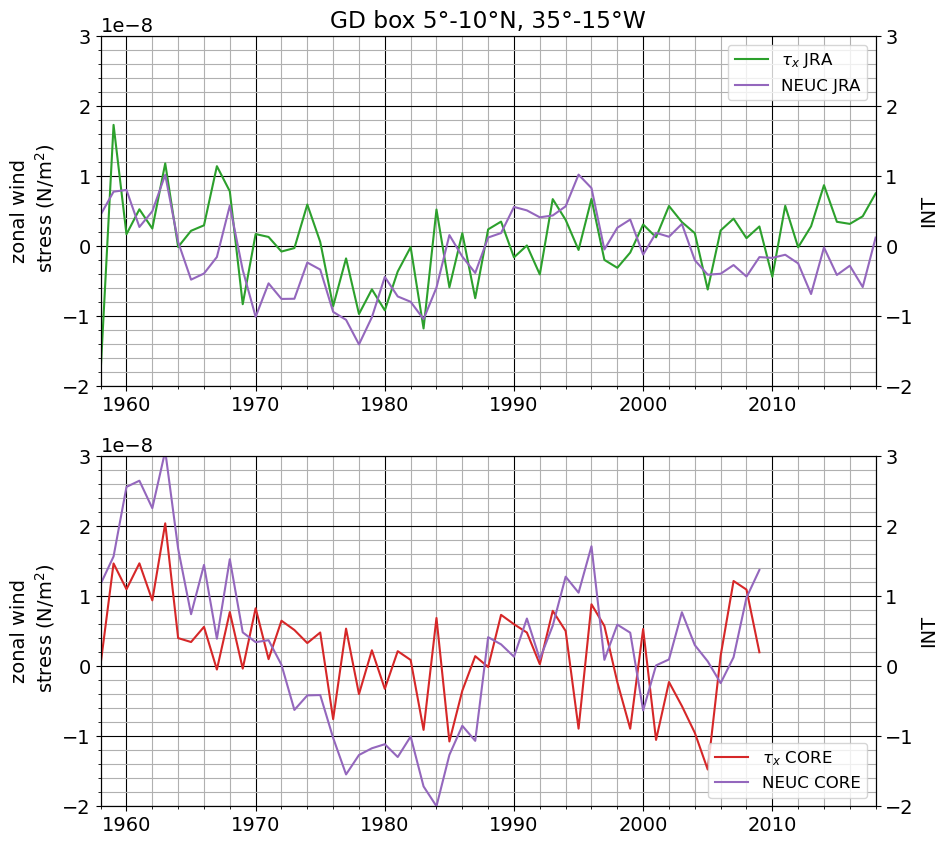

In [126]:
fig,ax = plt.subplots(2,1,figsize=(10,10))

lns1 = taux_JRA.plot(ax=ax[0],label=r'$\tau_x$ JRA',color='C2')
lns3 = taux_CORE.plot(ax=ax[1],label=r'$\tau_x$ CORE',color='C3')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    a.set_ylim([-.02*1e-6,.03*1e-6])
    a.set_xlim([*tlim])
    a.set_xlabel('')
    a.set_title('')
    a.set_ylabel('zonal wind\n stress (N/m$^2$)')
ax[0].set_title(f'GD box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')



add_ax = ax[0].twinx()
lns5 = NEUC_INT_JRA.plot(ax=add_ax,label='NEUC JRA',color='C4')
add_ax.set_ylim([-2,3])
lns = lns1+lns5
labs = [l.get_label() for l in lns]
ax[0].legend(lns, labs,loc=1,prop={'size': 12})

add_ax = ax[1].twinx()
lns6 = NEUC_INT_CORE.plot(ax=add_ax,label='NEUC CORE',color='C4')
add_ax.set_ylim([-2,3])
lns = lns3+lns6
labs = [l.get_label() for l in lns]
ax[1].legend(lns, labs,loc=4,prop={'size': 12})

plt.savefig(out_dir+f'INALT20_JRA_CORE_NEUC_GD_taux_{tlim[0]}_{tlim[1]}'+fig_format,dpi=300)

max correlation 0.3876223245081642 is at lag 0
correlation 0.3876223245081642 is at lag 0


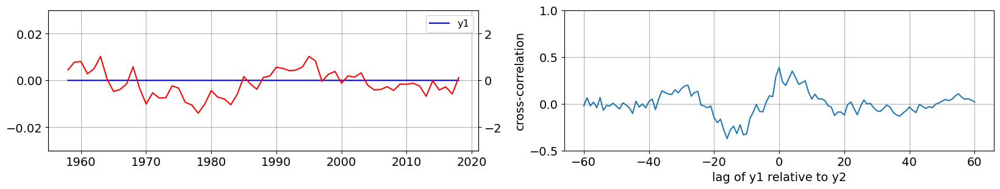

In [127]:
correlation(taux_JRA,NEUC_INT_JRA)

max correlation 0.48295895888565277 is at lag -1
correlation 0.480693097331867 is at lag 0


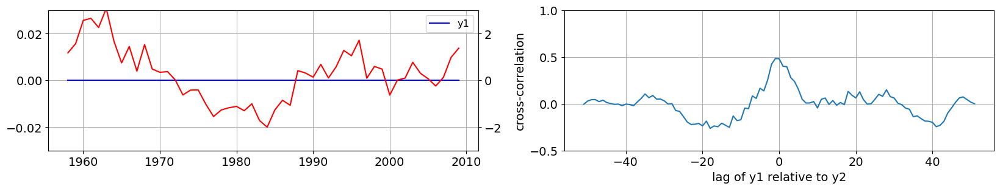

In [128]:
correlation(taux_CORE,NEUC_INT_CORE)

JRA pearsons R=0.49826857309617706, p=0.00023109436378640567
CORE pearsons R=0.4690157981881043, p=0.0005911424786584007


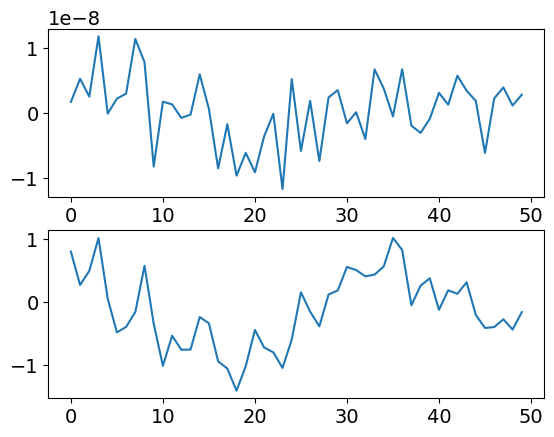

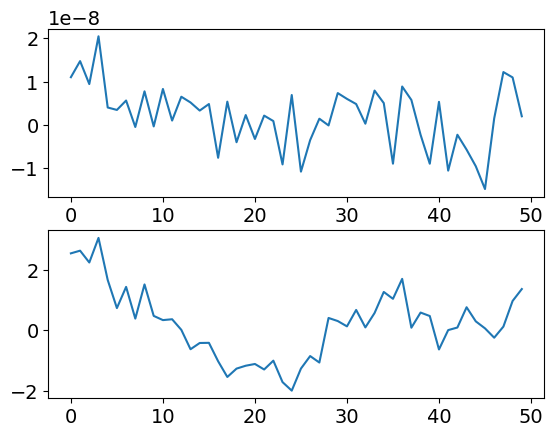

In [129]:
tlim=[1960,2009]
y,x = taux_JRA.sel(year=slice(*tlim)).values,NEUC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = taux_CORE.sel(year=slice(*tlim)).values,NEUC_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

JRA pearsons R=0.16413005903167432, p=0.47712979988903415
CORE pearsons R=0.16870642325017213, p=0.477072177911678


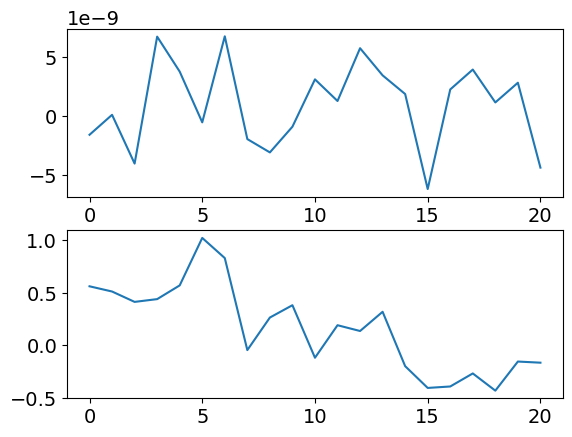

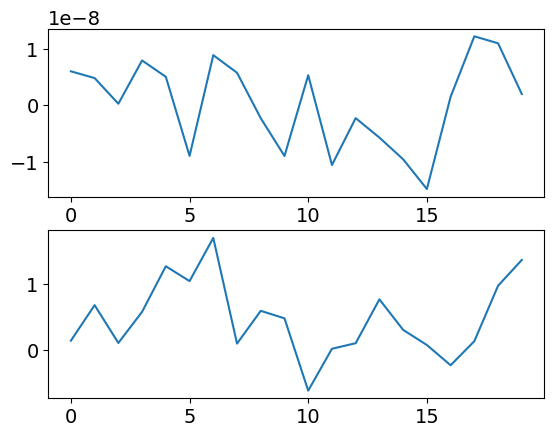

In [130]:
tlim=[1990,2010]
y,x = taux_JRA.sel(year=slice(*tlim)).values,NEUC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = taux_CORE.sel(year=slice(*tlim)).values,NEUC_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

JRA pearsons R=0.26634645019423986, p=0.10121867616267925
CORE pearsons R=0.1905175382139685, p=0.31324207197755566


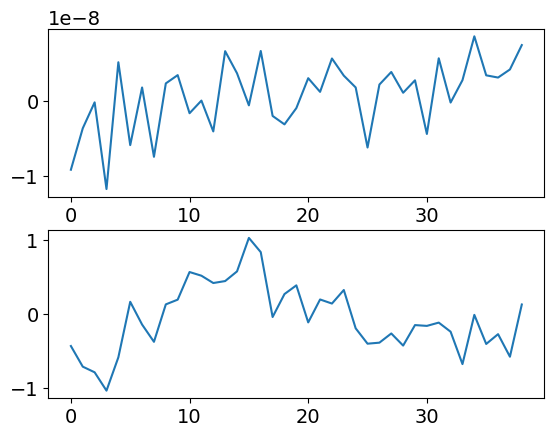

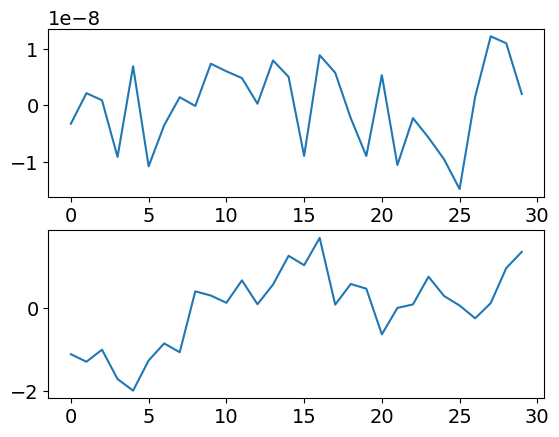

In [131]:
tlim=[1980,2018]
y,x = taux_JRA.sel(year=slice(*tlim)).values,NEUC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = taux_CORE.sel(year=slice(*tlim)).values,NEUC_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

## Just north of equator Box and NEUC

In [132]:
tlim=[1958,2018]
NEUC_INT_JRA = NEUC_JRA_am.INT.sel(year=slice(*tlim),lon=slice(None,None)).mean('lon')
NEUC_INT_CORE = NEUC_CORE_am.INT.sel(year=slice(tlim[0],2009),lon=slice(None,None)).mean('lon')

In [133]:
tlim=[1958,2018]
lat1,lat2,lon1,lon2=2,8,-35,-15
taux_JRA = ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(*tlim)).mean({'lat','lon'}
                    ).sel(forcings='JRA')
taux_CORE = ds_AM_A.taux.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(tlim[0],2009)).mean({'lat','lon'}
                    ).sel(forcings='CORE')

2024-01-26 15:33:37,602 - distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


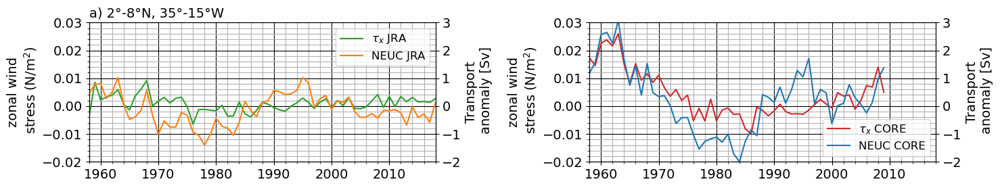

In [134]:
fig,ax = plt.subplots(1,2,figsize=(15,3))

lns1 = taux_JRA.plot(ax=ax[0],label=r'$\tau_x$ JRA',color='C2')
lns3 = taux_CORE.plot(ax=ax[1],label=r'$\tau_x$ CORE',color='C3')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    a.set_ylim([-.02,.03])
    a.set_xlim([*tlim])
    a.set_xlabel('')
    a.set_title('')
    a.set_ylabel('zonal wind\n stress (N/m$^2$)')
ax[0].set_title(f'a) {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W',loc='left',fontsize=14)



add_ax = ax[0].twinx()
lns5 = NEUC_INT_JRA.plot(ax=add_ax,label='NEUC JRA',color='C1')
add_ax.set_ylim([-2,3])
add_ax.set_ylabel('Transport\n anomaly [Sv]')
lns = lns1+lns5
labs = [l.get_label() for l in lns]
ax[0].legend(lns, labs,loc=1,prop={'size': 12})

add_ax = ax[1].twinx()
lns6 = NEUC_INT_CORE.plot(ax=add_ax,label='NEUC CORE',color='C0')
add_ax.set_ylim([-2,3])
add_ax.set_ylabel('Transport\n anomaly [Sv]')
lns = lns3+lns6
labs = [l.get_label() for l in lns]
ax[1].legend(lns, labs,loc=4,prop={'size': 12})
plt.tight_layout()
plt.savefig(out_dir+f'INALT20_JRA_CORE_NEUC_taux_{tlim[0]}_{tlim[1]}'+fig_format,dpi=300,bbox_inches='tight')

max correlation 0.546092847987948 is at lag -10
correlation 0.38818685310859496 is at lag 0


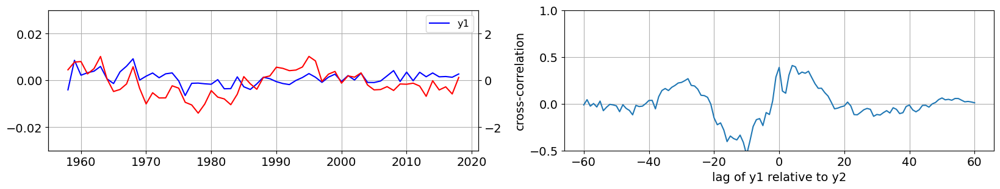

In [135]:
correlation(taux_JRA,NEUC_INT_JRA)

max correlation 0.7516800287944025 is at lag 0
correlation 0.7516800287944025 is at lag 0


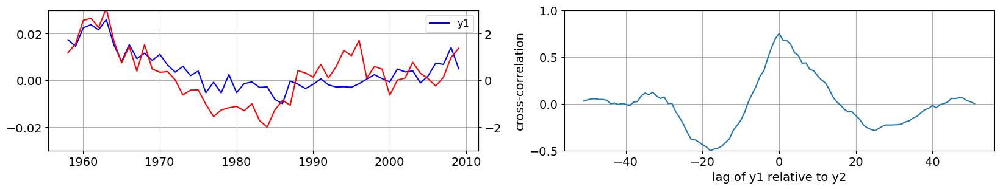

In [136]:
correlation(taux_CORE,NEUC_INT_CORE)

JRA pearsons R=0.42083754409137447, p=0.00234076529612225
CORE pearsons R=0.7430662191846574, p=6.434006756229922e-10


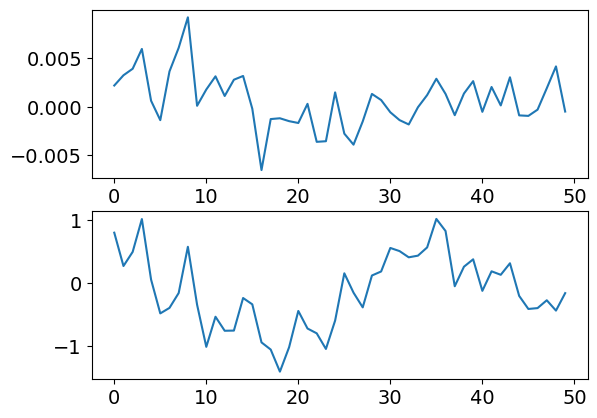

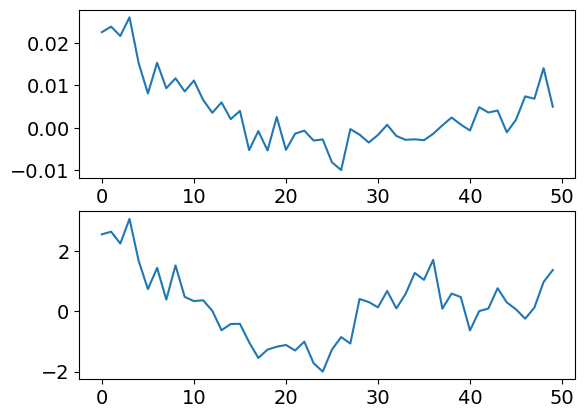

In [137]:
tlim=[1960,2009]
y,x = taux_JRA.sel(year=slice(*tlim)).values,NEUC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = taux_CORE.sel(year=slice(*tlim)).values,NEUC_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

JRA pearsons R=0.3910425392375394, p=0.032619909655145704
CORE pearsons R=0.39519401042659263, p=0.03066073379201993


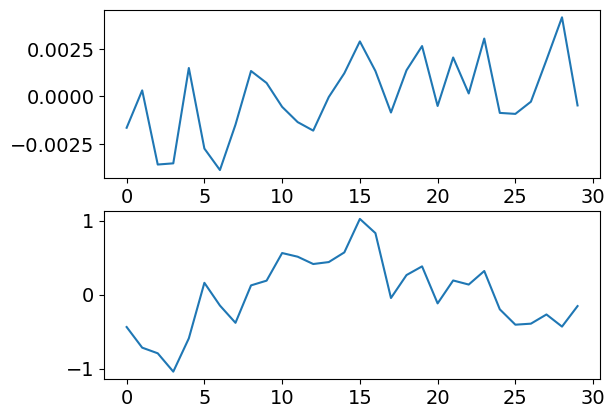

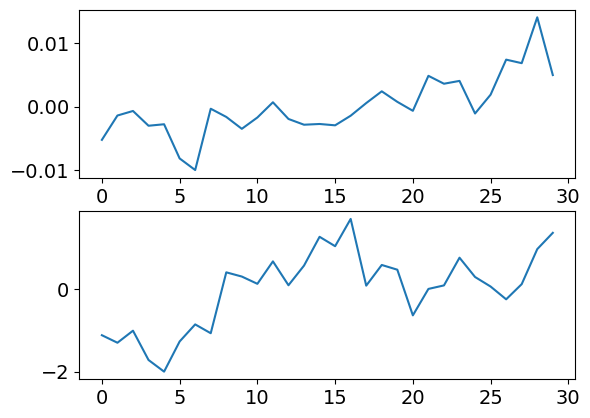

In [138]:
tlim=[1980,2009]
y,x = taux_JRA.sel(year=slice(*tlim)).values,NEUC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = taux_CORE.sel(year=slice(*tlim)).values,NEUC_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

## Angola Dome Box and SEUC

In [139]:
tlim=[1958,2018]
SEUC_INT_JRA = SEUC_JRA_am.INT.sel(year=slice(*tlim),lon=slice(None,None)).mean('lon')
SEUC_INT_CORE = SEUC_CORE_am.INT.sel(year=slice(tlim[0],2009),lon=slice(None,None)).mean('lon')

In [140]:
tlim=[1958,2018]
lat1,lat2,lon1,lon2=-7.5,-4.5,-0.5,2.5
tauy_JRA = ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(*tlim)).mean({'lat','lon'}
                    ).sel(forcings='JRA')
tauy_CORE = ds_AM_A.tauy.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(tlim[0],2009)).mean({'lat','lon'}
                    ).sel(forcings='CORE')

In [141]:
taux_JRA = ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(*tlim)).mean({'lat','lon'}
                    ).sel(forcings='JRA')
taux_CORE = ds_AM_curl.sel(lat=slice(lat1,lat2),lon=slice(lon1,lon2),year=slice(tlim[0],2009)).mean({'lat','lon'}
                    ).sel(forcings='CORE')

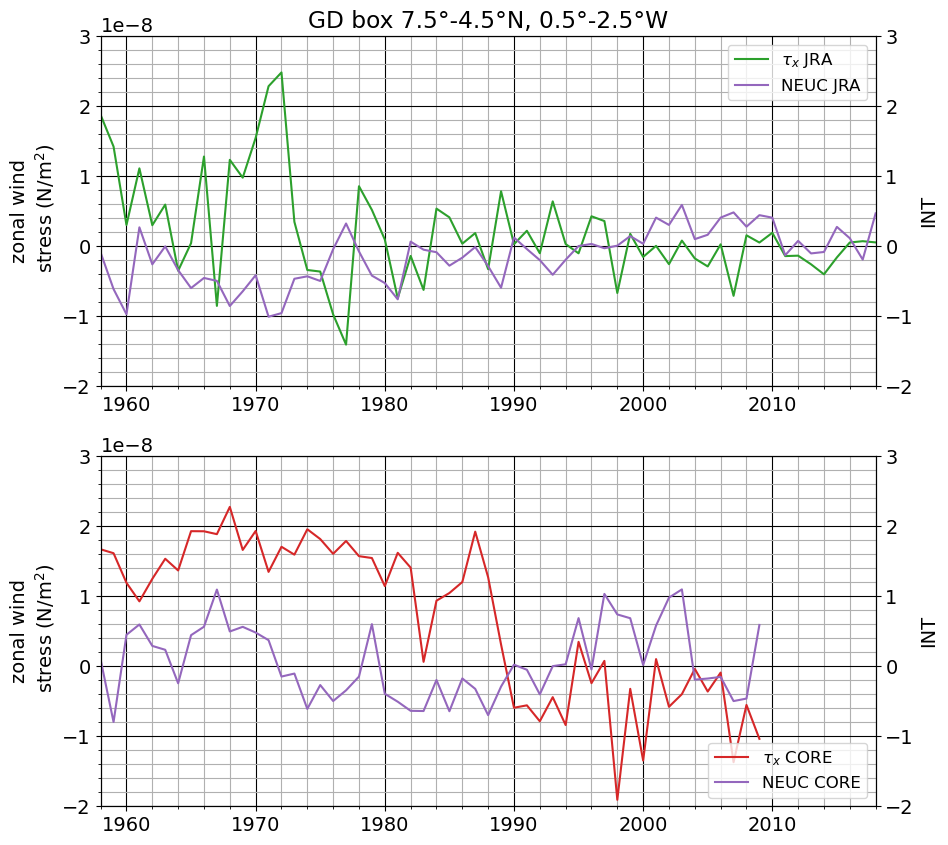

In [142]:
fig,ax = plt.subplots(2,1,figsize=(10,10))

lns1 = taux_JRA.plot(ax=ax[0],label=r'$\tau_x$ JRA',color='C2')
lns3 = taux_CORE.plot(ax=ax[1],label=r'$\tau_x$ CORE',color='C3')

for a in ax:
    a.grid(which='major',color='k')
    a.grid(which='minor')
    a.minorticks_on()
    a.set_ylim([-.02*1e-6,.03*1e-6])
    a.set_xlim([*tlim])
    a.set_xlabel('')
    a.set_title('')
    a.set_ylabel('zonal wind\n stress (N/m$^2$)')
ax[0].set_title(f'GD box {abs(lat1)}°-{abs(lat2)}°N, {abs(lon1)}°-{abs(lon2)}°W')



add_ax = ax[0].twinx()
lns5 = SEUC_INT_JRA.plot(ax=add_ax,label='NEUC JRA',color='C4')
add_ax.set_ylim([-2,3])
lns = lns1+lns5
labs = [l.get_label() for l in lns]
ax[0].legend(lns, labs,loc=1,prop={'size': 12})

add_ax = ax[1].twinx()
lns6 = SEUC_INT_CORE.plot(ax=add_ax,label='NEUC CORE',color='C4')
add_ax.set_ylim([-2,3])
lns = lns3+lns6
labs = [l.get_label() for l in lns]
ax[1].legend(lns, labs,loc=4,prop={'size': 12})

# plt.savefig(out_dir+f'INALT20_JRA_CORE_nSECu_taux_{tlim[0]}_{tlim[1]}'+fig_format,dpi=300)

max correlation 0.5109239774056383 is at lag -1
correlation -0.4413419530155877 is at lag 0


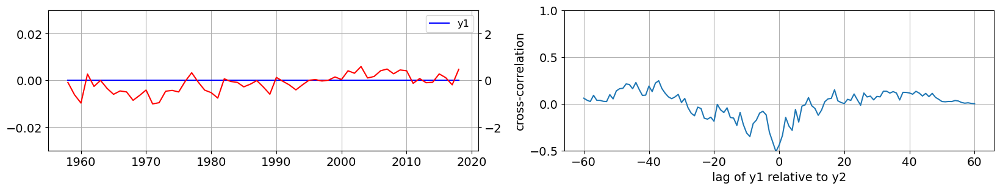

In [143]:
correlation(taux_JRA,SEUC_INT_JRA)

max correlation 0.3922533653846901 is at lag 17
correlation -0.12140206680544886 is at lag 0


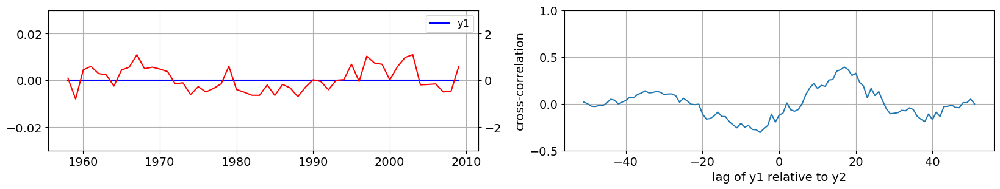

In [144]:
correlation(taux_CORE,SEUC_INT_CORE)

JRA pearsons R=-0.446193620464722, p=0.000915126055677371
CORE pearsons R=-0.12140206680544888, p=0.3912575487365186


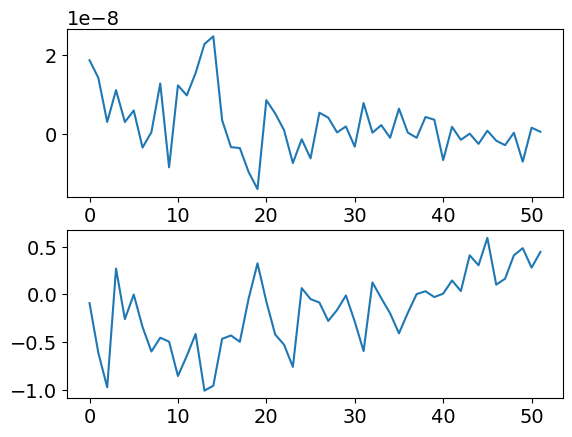

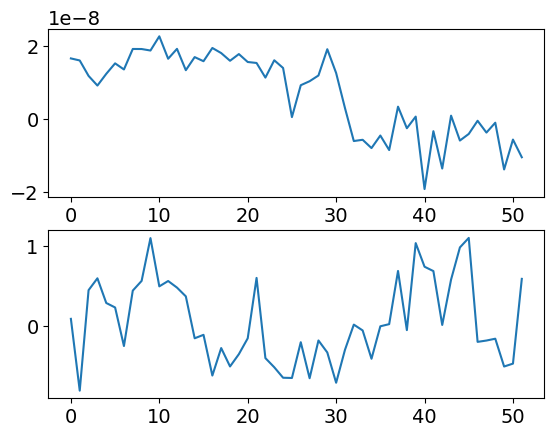

In [145]:
tlim=[1958,2009]
y,x = taux_JRA.sel(year=slice(*tlim)).values,SEUC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = taux_CORE.sel(year=slice(*tlim)).values,SEUC_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

JRA pearsons R=-0.16835785396622563, p=0.37382957441800824
CORE pearsons R=-0.4274705787066411, p=0.018462154517689407


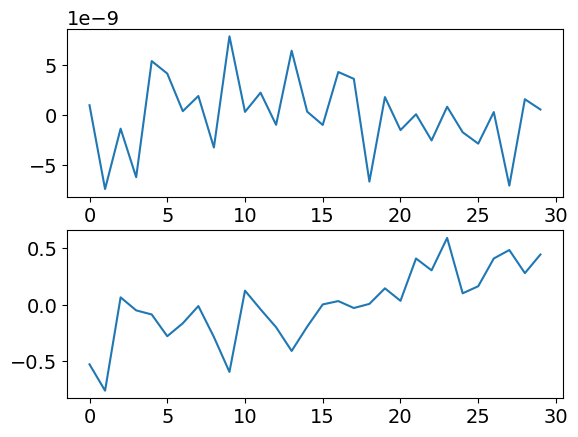

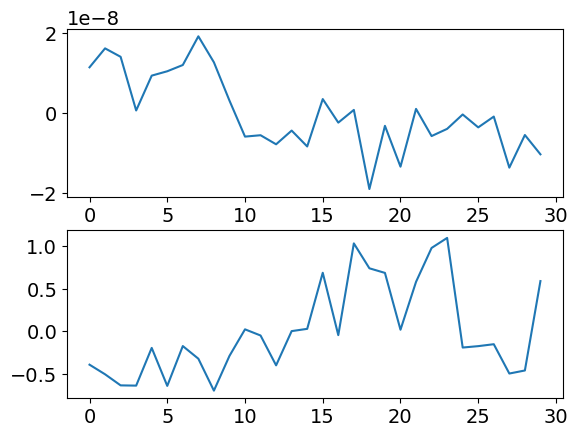

In [146]:
tlim=[1980,2009]
y,x = taux_JRA.sel(year=slice(*tlim)).values,SEUC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
y,x = taux_CORE.sel(year=slice(*tlim)).values,SEUC_INT_CORE.sel(year=slice(*tlim)).values
res_CORE = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')

JRA pearsons R=-0.11574044788082634, p=0.48290009468988654


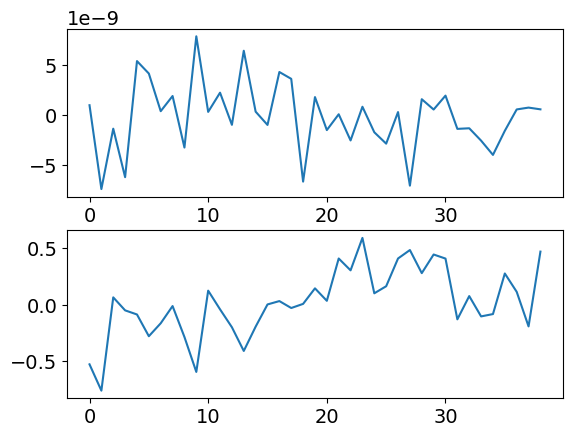

In [147]:
tlim=[1980,2018]
y,x = taux_JRA.sel(year=slice(*tlim)).values,SEUC_INT_JRA.sel(year=slice(*tlim)).values
res_JRA = stats.pearsonr(y,x)

fig, axs = plt.subplots(nrows=2)
axs[0].plot(y)
axs[1].plot(x)
# y,x = taux_CORE.sel(year=slice(*tlim)).values,NEUC_INT_CORE.sel(year=slice(*tlim)).values
# res_CORE = stats.pearsonr(y,x)

# fig, axs = plt.subplots(nrows=2)
# axs[0].plot(y)
# axs[1].plot(x)

print(f'JRA pearsons R={res_JRA[0]}, p={res_JRA[1]}')
# print(f'CORE pearsons R={res_CORE[0]}, p={res_CORE[1]}')